In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import datetime
%matplotlib inline

In [2]:
n_sensors=16

In [3]:
x = np.linspace(0, 1, 101)
y = np.linspace(0, 1, 101)

In [4]:
t = np.linspace(0, 1, 41)

In [5]:
xrange = np.linspace(0, 1, 101)
yrange = np.linspace(0, 1, 101)
xmesh, ymesh = np.meshgrid(xrange, yrange)

In [6]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

$$ f_1(x, y, t) = e^{-t}(cos2\pi xcos2\pi y + sin2\pi xsin2\pi y) $$
$$ f_2(x, y, t) = x + y + t $$
$$ f_3(x, y, t) = e^{-t}(2sin2\pi x + sin2\pi xcos2\pi y) $$

Case 1: f1

In [7]:
out1 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out1[i, j, k] = np.exp(-t[i])*(np.cos(2*np.pi*x[j])*np.cos(2*np.pi*y[k])
                                           + np.sin(2*np.pi*x[j])*np.sin(2*np.pi*y[k]))

In [8]:
out1[0, :, :]

array([[1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ],
       [0.99802673, 1.        , 0.99802673, ..., 0.98228725, 0.9921147 ,
        0.99802673],
       [0.9921147 , 0.99802673, 1.        , ..., 0.96858316, 0.98228725,
        0.9921147 ],
       ...,
       [0.9921147 , 0.98228725, 0.96858316, ..., 1.        , 0.99802673,
        0.9921147 ],
       [0.99802673, 0.9921147 , 0.98228725, ..., 0.99802673, 1.        ,
        0.99802673],
       [1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ]])

In [9]:
sensor1 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor1[i, j, k] = out1[i, 20*(j+1)+1, 20*(k+1)+1]

In [10]:
sensor1.shape

(41, 4, 4)

In [11]:
sensor1 = sensor1.reshape(41, 16, 1)

In [12]:
sensor1.shape

(41, 16, 1)

In [13]:
x_train1, x_test1, y_train1, y_test1, t_train, t_test = train_test_split(sensor1, out1, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [14]:
t_train

array([[0.725],
       [0.15 ],
       [0.65 ],
       [0.3  ],
       [0.425],
       [0.225],
       [0.375],
       [0.8  ],
       [0.4  ],
       [0.875],
       [0.85 ],
       [0.   ],
       [0.675],
       [0.125],
       [0.275],
       [0.025],
       [0.75 ],
       [0.525],
       [0.05 ],
       [0.775],
       [0.925],
       [0.075],
       [0.9  ],
       [0.575],
       [0.825],
       [0.25 ],
       [0.55 ],
       [0.45 ],
       [0.5  ],
       [0.175],
       [0.35 ],
       [0.7  ],
       [0.95 ]])

In [15]:
x_train1

array([[[ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457]],

       [[ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798]],

       [[ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
       

In [16]:
x_test1

array([[[ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164]],

       [[ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735]],

       [[ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
       

In [17]:
input_time = tf.keras.Input(shape=(1))
reshape = tf.keras.layers.Reshape((1,))(input_time)

x_ = tf.keras.layers.Dense(units=5, activation='relu', name='firstHiddenLayerSensor')(reshape)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='secondHiddenLayerSensor')(x_)
x_ = tf.keras.layers.Dense(units=5, activation='relu', name='thirdHiddenLayerSensor')(x_)
output_data = tf.keras.layers.Dense(units=16, activation=None, name='outputLayerSensor')(x_)
output_sensor = tf.keras.layers.Reshape((16, 1))(output_data)
# MLP
sensor_pred1 = tf.keras.Model(input_time, output_sensor)
sensor_pred2 = tf.keras.Model(input_time, output_sensor)
sensor_pred3 = tf.keras.Model(input_time, output_sensor)

In [18]:
sensor_pred1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 reshape (Reshape)           (None, 1)                 0         
                                                                 
 firstHiddenLayerSensor (Den  (None, 5)                10        
 se)                                                             
                                                                 
 secondHiddenLayerSensor (De  (None, 5)                30        
 nse)                                                            
                                                                 
 thirdHiddenLayerSensor (Den  (None, 5)                30        
 se)                                                             
                                                             

In [19]:
sensor_pred1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [20]:
start1 = datetime.datetime.now()
history1 = sensor_pred1.fit(t_train, x_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 6ms/step - loss: 0.2593 - rmse: 0.5092
Epoch 2/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2589 - rmse: 0.5088
Epoch 3/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2586 - rmse: 0.5085
Epoch 4/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2582 - rmse: 0.5081
Epoch 5/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2578 - rmse: 0.5077
Epoch 6/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2574 - rmse: 0.5074
Epoch 7/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2570 - rmse: 0.5070
Epoch 8/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2567 - rmse: 0.5066
Epoch 9/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2563 - rmse: 0.5063
Epoch 10/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2559 - rmse: 0.5059
Epoch 11/10000
2/2 [=============================

2/2 [==============================] - 0s 3ms/step - loss: 0.2326 - rmse: 0.4823
Epoch 87/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2323 - rmse: 0.4820
Epoch 88/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2320 - rmse: 0.4817
Epoch 89/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2318 - rmse: 0.4814
Epoch 90/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2315 - rmse: 0.4812
Epoch 91/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2313 - rmse: 0.4809
Epoch 92/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2310 - rmse: 0.4807
Epoch 93/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2308 - rmse: 0.4804
Epoch 94/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2305 - rmse: 0.4801
Epoch 95/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2303 - rmse: 0.4799
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 3ms/step - loss: 0.2138 - rmse: 0.4624
Epoch 171/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2136 - rmse: 0.4622
Epoch 172/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2134 - rmse: 0.4620
Epoch 173/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2132 - rmse: 0.4618
Epoch 174/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.2130 - rmse: 0.4615
Epoch 175/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2128 - rmse: 0.4613
Epoch 176/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.2126 - rmse: 0.4611
Epoch 177/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2124 - rmse: 0.4609
Epoch 178/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.2123 - rmse: 0.4607
Epoch 179/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2121 - rmse: 0.4605
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 0.1988 - rmse: 0.4459
Epoch 255/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1986 - rmse: 0.4457
Epoch 256/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1985 - rmse: 0.4455
Epoch 257/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1983 - rmse: 0.4453
Epoch 258/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1981 - rmse: 0.4451
Epoch 259/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1980 - rmse: 0.4449
Epoch 260/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1978 - rmse: 0.4448
Epoch 261/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1977 - rmse: 0.4446
Epoch 262/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1975 - rmse: 0.4444
Epoch 263/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1973 - rmse: 0.4442
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 0.1861 - rmse: 0.4314
Epoch 339/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1859 - rmse: 0.4312
Epoch 340/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1858 - rmse: 0.4310
Epoch 341/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1856 - rmse: 0.4308
Epoch 342/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1855 - rmse: 0.4307
Epoch 343/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1853 - rmse: 0.4305
Epoch 344/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1852 - rmse: 0.4303
Epoch 345/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1850 - rmse: 0.4301
Epoch 346/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1849 - rmse: 0.4300
Epoch 347/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1847 - rmse: 0.4298
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 0.1742 - rmse: 0.4173
Epoch 423/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1740 - rmse: 0.4172
Epoch 424/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1739 - rmse: 0.4170
Epoch 425/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1738 - rmse: 0.4169
Epoch 426/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1736 - rmse: 0.4167
Epoch 427/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1735 - rmse: 0.4166
Epoch 428/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1734 - rmse: 0.4164
Epoch 429/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1733 - rmse: 0.4163
Epoch 430/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1731 - rmse: 0.4161
Epoch 431/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1730 - rmse: 0.4160
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 0.1635 - rmse: 0.4044
Epoch 507/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1634 - rmse: 0.4042
Epoch 508/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1633 - rmse: 0.4041
Epoch 509/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1632 - rmse: 0.4039
Epoch 510/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1630 - rmse: 0.4038
Epoch 511/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1629 - rmse: 0.4036
Epoch 512/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1628 - rmse: 0.4035
Epoch 513/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1627 - rmse: 0.4033
Epoch 514/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1625 - rmse: 0.4032
Epoch 515/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1624 - rmse: 0.4030
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 0.1535 - rmse: 0.3918
Epoch 591/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1534 - rmse: 0.3917
Epoch 592/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1533 - rmse: 0.3915
Epoch 593/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1532 - rmse: 0.3914
Epoch 594/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1530 - rmse: 0.3912
Epoch 595/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1529 - rmse: 0.3911
Epoch 596/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1528 - rmse: 0.3909
Epoch 597/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1527 - rmse: 0.3908
Epoch 598/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1526 - rmse: 0.3907
Epoch 599/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1525 - rmse: 0.3905
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 0.1442 - rmse: 0.3798
Epoch 675/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1441 - rmse: 0.3797
Epoch 676/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1440 - rmse: 0.3795
Epoch 677/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1439 - rmse: 0.3794
Epoch 678/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1438 - rmse: 0.3793
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1437 - rmse: 0.3791
Epoch 680/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1436 - rmse: 0.3790
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1435 - rmse: 0.3789
Epoch 682/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1434 - rmse: 0.3787
Epoch 683/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1433 - rmse: 0.3786
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 0.1356 - rmse: 0.3682
Epoch 759/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1355 - rmse: 0.3681
Epoch 760/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1354 - rmse: 0.3679
Epoch 761/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1353 - rmse: 0.3678
Epoch 762/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1352 - rmse: 0.3677
Epoch 763/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1351 - rmse: 0.3676
Epoch 764/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1350 - rmse: 0.3674
Epoch 765/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1349 - rmse: 0.3673
Epoch 766/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1348 - rmse: 0.3672
Epoch 767/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1347 - rmse: 0.3670
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.1269 - rmse: 0.3562
Epoch 843/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1268 - rmse: 0.3561
Epoch 844/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1267 - rmse: 0.3559
Epoch 845/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1266 - rmse: 0.3558
Epoch 846/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1265 - rmse: 0.3557
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1264 - rmse: 0.3555
Epoch 848/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1263 - rmse: 0.3554
Epoch 849/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1262 - rmse: 0.3552
Epoch 850/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1261 - rmse: 0.3551
Epoch 851/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1260 - rmse: 0.3549
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 6ms/step - loss: 0.1187 - rmse: 0.3445
Epoch 927/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1186 - rmse: 0.3444
Epoch 928/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1185 - rmse: 0.3443
Epoch 929/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1184 - rmse: 0.3442
Epoch 930/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1184 - rmse: 0.3440
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1183 - rmse: 0.3439
Epoch 932/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1182 - rmse: 0.3438
Epoch 933/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1181 - rmse: 0.3437
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1180 - rmse: 0.3435
Epoch 935/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1179 - rmse: 0.3434
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 0.1106 - rmse: 0.3325
Epoch 1011/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1105 - rmse: 0.3324
Epoch 1012/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1104 - rmse: 0.3322
Epoch 1013/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1103 - rmse: 0.3321
Epoch 1014/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1102 - rmse: 0.3319
Epoch 1015/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1101 - rmse: 0.3317
Epoch 1016/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1099 - rmse: 0.3316
Epoch 1017/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1098 - rmse: 0.3314
Epoch 1018/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1097 - rmse: 0.3313
Epoch 1019/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1096 - rmse: 0.3311
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.1022 - rmse: 0.3197
Epoch 1094/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1021 - rmse: 0.3196
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1020 - rmse: 0.3194
Epoch 1096/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1019 - rmse: 0.3192
Epoch 1097/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1018 - rmse: 0.3190
Epoch 1098/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1017 - rmse: 0.3189
Epoch 1099/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1016 - rmse: 0.3187
Epoch 1100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1015 - rmse: 0.3185
Epoch 1101/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1014 - rmse: 0.3184
Epoch 1102/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1013 - rmse: 0.3182
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0933 - rmse: 0.3054
Epoch 1177/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0932 - rmse: 0.3053
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0931 - rmse: 0.3051
Epoch 1179/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0929 - rmse: 0.3049
Epoch 1180/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0928 - rmse: 0.3047
Epoch 1181/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0927 - rmse: 0.3045
Epoch 1182/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0926 - rmse: 0.3043
Epoch 1183/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0924 - rmse: 0.3041
Epoch 1184/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0923 - rmse: 0.3039
Epoch 1185/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0922 - rmse: 0.3037
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0830 - rmse: 0.2882
Epoch 1260/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0829 - rmse: 0.2879
Epoch 1261/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0827 - rmse: 0.2876
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0826 - rmse: 0.2874
Epoch 1263/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0824 - rmse: 0.2871
Epoch 1264/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0823 - rmse: 0.2868
Epoch 1265/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0821 - rmse: 0.2866
Epoch 1266/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0820 - rmse: 0.2863
Epoch 1267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0818 - rmse: 0.2861
Epoch 1268/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0817 - rmse: 0.2858
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0728 - rmse: 0.2699
Epoch 1343/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0727 - rmse: 0.2697
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0726 - rmse: 0.2694
Epoch 1345/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0725 - rmse: 0.2692
Epoch 1346/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0724 - rmse: 0.2690
Epoch 1347/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0722 - rmse: 0.2688
Epoch 1348/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0721 - rmse: 0.2686
Epoch 1349/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0720 - rmse: 0.2684
Epoch 1350/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0719 - rmse: 0.2681
Epoch 1351/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0718 - rmse: 0.2679
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0633 - rmse: 0.2516
Epoch 1426/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0632 - rmse: 0.2513
Epoch 1427/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0630 - rmse: 0.2511
Epoch 1428/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0629 - rmse: 0.2508
Epoch 1429/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0628 - rmse: 0.2506
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0627 - rmse: 0.2504
Epoch 1431/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0626 - rmse: 0.2501
Epoch 1432/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0624 - rmse: 0.2499
Epoch 1433/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0623 - rmse: 0.2497
Epoch 1434/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0622 - rmse: 0.2495
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0542 - rmse: 0.2327
Epoch 1509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0541 - rmse: 0.2325
Epoch 1510/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0540 - rmse: 0.2323
Epoch 1511/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0539 - rmse: 0.2322
Epoch 1512/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0538 - rmse: 0.2320
Epoch 1513/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0537 - rmse: 0.2317
Epoch 1514/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0536 - rmse: 0.2315
Epoch 1515/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0535 - rmse: 0.2313
Epoch 1516/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0534 - rmse: 0.2311
Epoch 1517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0533 - rmse: 0.2310
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0469 - rmse: 0.2166
Epoch 1592/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0468 - rmse: 0.2164
Epoch 1593/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0467 - rmse: 0.2162
Epoch 1594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0466 - rmse: 0.2160
Epoch 1595/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0466 - rmse: 0.2158
Epoch 1596/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0465 - rmse: 0.2156
Epoch 1597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0464 - rmse: 0.2153
Epoch 1598/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0463 - rmse: 0.2152
Epoch 1599/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0462 - rmse: 0.2149
Epoch 1600/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0461 - rmse: 0.2147
Epoch 1601/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0409 - rmse: 0.2022
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0408 - rmse: 0.2020
Epoch 1676/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0407 - rmse: 0.2019
Epoch 1677/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0407 - rmse: 0.2017
Epoch 1678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0406 - rmse: 0.2015
Epoch 1679/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0406 - rmse: 0.2014
Epoch 1680/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0405 - rmse: 0.2012
Epoch 1681/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0404 - rmse: 0.2011
Epoch 1682/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0404 - rmse: 0.2009
Epoch 1683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0403 - rmse: 0.2008
Epoch 1684/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0360 - rmse: 0.1897
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0359 - rmse: 0.1896
Epoch 1759/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0359 - rmse: 0.1895
Epoch 1760/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0358 - rmse: 0.1893
Epoch 1761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0358 - rmse: 0.1892
Epoch 1762/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0358 - rmse: 0.1891
Epoch 1763/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0357 - rmse: 0.1890
Epoch 1764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0357 - rmse: 0.1889
Epoch 1765/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0356 - rmse: 0.1888
Epoch 1766/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0356 - rmse: 0.1886
Epoch 1767/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0321 - rmse: 0.1791
Epoch 1841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0320 - rmse: 0.1790
Epoch 1842/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0320 - rmse: 0.1789
Epoch 1843/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0319 - rmse: 0.1787
Epoch 1844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0319 - rmse: 0.1786
Epoch 1845/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0318 - rmse: 0.1784
Epoch 1846/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0318 - rmse: 0.1782
Epoch 1847/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0317 - rmse: 0.1781
Epoch 1848/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0317 - rmse: 0.1779
Epoch 1849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0316 - rmse: 0.1778
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0284 - rmse: 0.1685
Epoch 1924/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0284 - rmse: 0.1684
Epoch 1925/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0283 - rmse: 0.1683
Epoch 1926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0283 - rmse: 0.1682
Epoch 1927/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0283 - rmse: 0.1681
Epoch 1928/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0282 - rmse: 0.1680
Epoch 1929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0282 - rmse: 0.1679
Epoch 1930/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0281 - rmse: 0.1677
Epoch 1931/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0281 - rmse: 0.1676
Epoch 1932/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0281 - rmse: 0.1675
Epoch 1933/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0255 - rmse: 0.1598
Epoch 2007/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0255 - rmse: 0.1596
Epoch 2008/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0254 - rmse: 0.1595
Epoch 2009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0254 - rmse: 0.1593
Epoch 2010/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0253 - rmse: 0.1592
Epoch 2011/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0253 - rmse: 0.1591
Epoch 2012/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0253 - rmse: 0.1589
Epoch 2013/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0252 - rmse: 0.1588
Epoch 2014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0252 - rmse: 0.1587
Epoch 2015/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0252 - rmse: 0.1586
Epoch 2016/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0229 - rmse: 0.1513
Epoch 2090/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0229 - rmse: 0.1512
Epoch 2091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0229 - rmse: 0.1512
Epoch 2092/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0228 - rmse: 0.1511
Epoch 2093/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0228 - rmse: 0.1510
Epoch 2094/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0228 - rmse: 0.1509
Epoch 2095/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0227 - rmse: 0.1508
Epoch 2096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0227 - rmse: 0.1507
Epoch 2097/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0227 - rmse: 0.1506
Epoch 2098/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0227 - rmse: 0.1505
Epoch 2099/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0207 - rmse: 0.1438
Epoch 2173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0207 - rmse: 0.1437
Epoch 2174/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0206 - rmse: 0.1436
Epoch 2175/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0206 - rmse: 0.1435
Epoch 2176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0206 - rmse: 0.1434
Epoch 2177/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0205 - rmse: 0.1433
Epoch 2178/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0205 - rmse: 0.1432
Epoch 2179/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0205 - rmse: 0.1431
Epoch 2180/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0205 - rmse: 0.1431
Epoch 2181/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0204 - rmse: 0.1430
Epoch 2182/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0185 - rmse: 0.1360
Epoch 2256/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0185 - rmse: 0.1359
Epoch 2257/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0184 - rmse: 0.1358
Epoch 2258/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0184 - rmse: 0.1357
Epoch 2259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0184 - rmse: 0.1356
Epoch 2260/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0184 - rmse: 0.1356
Epoch 2261/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0184 - rmse: 0.1355
Epoch 2262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0183 - rmse: 0.1354
Epoch 2263/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0183 - rmse: 0.1354
Epoch 2264/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0183 - rmse: 0.1353
Epoch 2265/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0161 - rmse: 0.1268
Epoch 2339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0160 - rmse: 0.1267
Epoch 2340/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0160 - rmse: 0.1266
Epoch 2341/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0160 - rmse: 0.1265
Epoch 2342/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0160 - rmse: 0.1264
Epoch 2343/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0160 - rmse: 0.1263
Epoch 2344/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0159 - rmse: 0.1262
Epoch 2345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0159 - rmse: 0.1262
Epoch 2346/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0159 - rmse: 0.1261
Epoch 2347/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0159 - rmse: 0.1260
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0140 - rmse: 0.1183
Epoch 2422/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0140 - rmse: 0.1183
Epoch 2423/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0140 - rmse: 0.1182
Epoch 2424/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0139 - rmse: 0.1181
Epoch 2425/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0139 - rmse: 0.1180
Epoch 2426/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0139 - rmse: 0.1179
Epoch 2427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0139 - rmse: 0.1179
Epoch 2428/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0139 - rmse: 0.1178
Epoch 2429/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0139 - rmse: 0.1177
Epoch 2430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0138 - rmse: 0.1176
Epoch 2431/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0122 - rmse: 0.1106
Epoch 2505/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0122 - rmse: 0.1105
Epoch 2506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0122 - rmse: 0.1105
Epoch 2507/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0122 - rmse: 0.1104
Epoch 2508/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0122 - rmse: 0.1103
Epoch 2509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0122 - rmse: 0.1103
Epoch 2510/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0121 - rmse: 0.1102
Epoch 2511/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0121 - rmse: 0.1101
Epoch 2512/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0121 - rmse: 0.1100
Epoch 2513/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0121 - rmse: 0.1099
Epoch 2514/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0108 - rmse: 0.1041
Epoch 2588/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0108 - rmse: 0.1040
Epoch 2589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0108 - rmse: 0.1039
Epoch 2590/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0108 - rmse: 0.1038
Epoch 2591/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0108 - rmse: 0.1037
Epoch 2592/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0107 - rmse: 0.1037
Epoch 2593/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0107 - rmse: 0.1035
Epoch 2594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0107 - rmse: 0.1034
Epoch 2595/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0107 - rmse: 0.1033
Epoch 2596/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0106 - rmse: 0.1032
Epoch 2597/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 2671/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0093 - rmse: 0.0966
Epoch 2672/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 2673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 2674/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 2675/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 2676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0961
Epoch 2677/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0092 - rmse: 0.0960
Epoch 2678/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 2679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0958
Epoch 2680/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 2754/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 2755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 2756/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 2757/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0081 - rmse: 0.0902
Epoch 2758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 2759/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 2760/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 2761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 2762/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 2837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 2838/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 2839/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 2840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 2841/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 2842/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 2843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 2844/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 2845/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0070 - rmse: 0.0839
Epoch 2846/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 2920/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 2921/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0061 - rmse: 0.0784
Epoch 2922/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0784
Epoch 2923/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 2924/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 2925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 2926/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 2927/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 2928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 2929/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 3003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 3004/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 3005/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 3006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 3007/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 3008/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0053 - rmse: 0.0731
Epoch 3009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0731
Epoch 3010/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 3011/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 3012/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 3086/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 3087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 3088/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 3089/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 3090/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 3091/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 3092/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 3093/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 3094/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 3095/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 3169/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 3170/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 3171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 3172/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 3173/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 3174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 3175/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 3176/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 3177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0636
Epoch 3178/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 3252/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 3253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 3254/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 3255/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 3256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 3257/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 3258/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 3259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 3260/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3261/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 3335/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 3336/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 3337/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0032 - rmse: 0.0570
Epoch 3338/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0570
Epoch 3339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 3340/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 3341/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 3342/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 3343/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 3344/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 3418/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 3419/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 3420/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 3421/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 3422/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 3423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 3424/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 3425/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 3426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3427/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 3501/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 3502/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 3503/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 3504/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 3505/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 3506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 3507/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 3508/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 3509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 3510/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 3584/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 3585/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3586/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3587/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3588/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3589/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 3590/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 3591/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 3592/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 3593/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 3667/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 3668/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 3669/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 3670/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 3671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 3672/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 3673/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 3674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 3675/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 3676/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 3750/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 3751/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 3752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 3753/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 3754/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 3755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 3756/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 3757/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 3758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 3759/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 3833/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 3834/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3835/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3837/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3838/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 3840/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 3841/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 3842/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3916/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3917/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3918/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 3919/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 3920/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 3921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 3922/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 3923/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 3924/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 3925/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 3999/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4000/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4002/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 4003/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 4004/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 4005/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 4006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 4007/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 4008/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 4082/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 4083/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 4084/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 4085/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 4086/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 4087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 4088/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 4089/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 4090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 4091/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 9.7112e-04 - rmse: 0.0312
Epoch 4164/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6983e-04 - rmse: 0.0311
Epoch 4165/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6869e-04 - rmse: 0.0311
Epoch 4166/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.6720e-04 - rmse: 0.0311
Epoch 4167/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6565e-04 - rmse: 0.0311
Epoch 4168/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.6447e-04 - rmse: 0.0311
Epoch 4169/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6339e-04 - rmse: 0.0310
Epoch 4170/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.6201e-04 - rmse: 0.0310
Epoch 4171/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6048e-04 - rmse: 0.0310
Epoch 4172/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.5906e-04 - rmse: 0.03

2/2 [==============================] - 0s 4ms/step - loss: 8.6055e-04 - rmse: 0.0293
Epoch 4244/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.5933e-04 - rmse: 0.0293
Epoch 4245/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5809e-04 - rmse: 0.0293
Epoch 4246/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.5679e-04 - rmse: 0.0293
Epoch 4247/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.5546e-04 - rmse: 0.0292
Epoch 4248/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5429e-04 - rmse: 0.0292
Epoch 4249/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.5294e-04 - rmse: 0.0292
Epoch 4250/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.5150e-04 - rmse: 0.0292
Epoch 4251/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5011e-04 - rmse: 0.0292
Epoch 4252/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.4885e-04 - rmse: 0.02

2/2 [==============================] - 0s 6ms/step - loss: 7.6440e-04 - rmse: 0.0276
Epoch 4324/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.6282e-04 - rmse: 0.0276
Epoch 4325/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.6106e-04 - rmse: 0.0276
Epoch 4326/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5931e-04 - rmse: 0.0276
Epoch 4327/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5845e-04 - rmse: 0.0275
Epoch 4328/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.5705e-04 - rmse: 0.0275
Epoch 4329/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5572e-04 - rmse: 0.0275
Epoch 4330/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5434e-04 - rmse: 0.0275
Epoch 4331/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5276e-04 - rmse: 0.0274
Epoch 4332/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5121e-04 - rmse: 0.02

2/2 [==============================] - 0s 4ms/step - loss: 6.6834e-04 - rmse: 0.0259
Epoch 4404/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.6761e-04 - rmse: 0.0258
Epoch 4405/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.6671e-04 - rmse: 0.0258
Epoch 4406/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.6570e-04 - rmse: 0.0258
Epoch 4407/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.6468e-04 - rmse: 0.0258
Epoch 4408/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.6365e-04 - rmse: 0.0258
Epoch 4409/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.6276e-04 - rmse: 0.0257
Epoch 4410/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.6194e-04 - rmse: 0.0257
Epoch 4411/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.6152e-04 - rmse: 0.0257
Epoch 4412/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.6094e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 5.9806e-04 - rmse: 0.0245
Epoch 4484/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9697e-04 - rmse: 0.0244
Epoch 4485/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.9570e-04 - rmse: 0.0244
Epoch 4486/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9439e-04 - rmse: 0.0244
Epoch 4487/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9267e-04 - rmse: 0.0243
Epoch 4488/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9095e-04 - rmse: 0.0243
Epoch 4489/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8930e-04 - rmse: 0.0243
Epoch 4490/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8794e-04 - rmse: 0.0242
Epoch 4491/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8688e-04 - rmse: 0.0242
Epoch 4492/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8630e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 5.2189e-04 - rmse: 0.0228
Epoch 4564/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2087e-04 - rmse: 0.0228
Epoch 4565/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.1995e-04 - rmse: 0.0228
Epoch 4566/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.1903e-04 - rmse: 0.0228
Epoch 4567/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1818e-04 - rmse: 0.0228
Epoch 4568/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1765e-04 - rmse: 0.0228
Epoch 4569/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1706e-04 - rmse: 0.0227
Epoch 4570/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.1612e-04 - rmse: 0.0227
Epoch 4571/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.1497e-04 - rmse: 0.0227
Epoch 4572/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1395e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 4.5883e-04 - rmse: 0.0214
Epoch 4644/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5771e-04 - rmse: 0.0214
Epoch 4645/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.5630e-04 - rmse: 0.0214
Epoch 4646/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.5537e-04 - rmse: 0.0213
Epoch 4647/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5474e-04 - rmse: 0.0213
Epoch 4648/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.5442e-04 - rmse: 0.0213
Epoch 4649/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.5471e-04 - rmse: 0.0213
Epoch 4650/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5572e-04 - rmse: 0.0213
Epoch 4651/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.5718e-04 - rmse: 0.0214
Epoch 4652/10000
2/2 [==============================] - 0s 3ms/step - loss: 4.5968e-04 - rmse: 0.02

2/2 [==============================] - 0s 4ms/step - loss: 3.9837e-04 - rmse: 0.0200
Epoch 4724/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.9791e-04 - rmse: 0.0199
Epoch 4725/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9743e-04 - rmse: 0.0199
Epoch 4726/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.9725e-04 - rmse: 0.0199
Epoch 4727/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.9711e-04 - rmse: 0.0199
Epoch 4728/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9663e-04 - rmse: 0.0199
Epoch 4729/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.9577e-04 - rmse: 0.0199
Epoch 4730/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.9484e-04 - rmse: 0.0199
Epoch 4731/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9402e-04 - rmse: 0.0198
Epoch 4732/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.9311e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 3.5043e-04 - rmse: 0.0187
Epoch 4804/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4961e-04 - rmse: 0.0187
Epoch 4805/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.4888e-04 - rmse: 0.0187
Epoch 4806/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.4815e-04 - rmse: 0.0187
Epoch 4807/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4747e-04 - rmse: 0.0186
Epoch 4808/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.4671e-04 - rmse: 0.0186
Epoch 4809/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.4595e-04 - rmse: 0.0186
Epoch 4810/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4547e-04 - rmse: 0.0186
Epoch 4811/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.4486e-04 - rmse: 0.0186
Epoch 4812/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.4446e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 3.0570e-04 - rmse: 0.0175
Epoch 4884/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0506e-04 - rmse: 0.0175
Epoch 4885/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.0424e-04 - rmse: 0.0174
Epoch 4886/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.0358e-04 - rmse: 0.0174
Epoch 4887/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0288e-04 - rmse: 0.0174
Epoch 4888/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.0219e-04 - rmse: 0.0174
Epoch 4889/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.0163e-04 - rmse: 0.0174
Epoch 4890/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0130e-04 - rmse: 0.0174
Epoch 4891/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.0124e-04 - rmse: 0.0174
Epoch 4892/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.0106e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 2.6644e-04 - rmse: 0.0163
Epoch 4964/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6590e-04 - rmse: 0.0163
Epoch 4965/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.6525e-04 - rmse: 0.0163
Epoch 4966/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.6483e-04 - rmse: 0.0163
Epoch 4967/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6437e-04 - rmse: 0.0163
Epoch 4968/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.6380e-04 - rmse: 0.0162
Epoch 4969/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.6278e-04 - rmse: 0.0162
Epoch 4970/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6178e-04 - rmse: 0.0162
Epoch 4971/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.6052e-04 - rmse: 0.0161
Epoch 4972/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.5984e-04 - rmse: 0.01

2/2 [==============================] - 0s 5ms/step - loss: 2.3114e-04 - rmse: 0.0152
Epoch 5044/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3107e-04 - rmse: 0.0152
Epoch 5045/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3099e-04 - rmse: 0.0152
Epoch 5046/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.3110e-04 - rmse: 0.0152
Epoch 5047/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3076e-04 - rmse: 0.0152
Epoch 5048/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.2974e-04 - rmse: 0.0152
Epoch 5049/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.2861e-04 - rmse: 0.0151
Epoch 5050/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2785e-04 - rmse: 0.0151
Epoch 5051/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.2717e-04 - rmse: 0.0151
Epoch 5052/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.2674e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 2.0412e-04 - rmse: 0.0143
Epoch 5124/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0395e-04 - rmse: 0.0143
Epoch 5125/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0353e-04 - rmse: 0.0143
Epoch 5126/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.0379e-04 - rmse: 0.0143
Epoch 5127/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0368e-04 - rmse: 0.0143
Epoch 5128/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0256e-04 - rmse: 0.0142
Epoch 5129/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.0117e-04 - rmse: 0.0142
Epoch 5130/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.0000e-04 - rmse: 0.0141
Epoch 5131/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9912e-04 - rmse: 0.0141
Epoch 5132/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9805e-04 - rmse: 0.01

2/2 [==============================] - 0s 5ms/step - loss: 1.7483e-04 - rmse: 0.0132
Epoch 5204/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7400e-04 - rmse: 0.0132
Epoch 5205/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7309e-04 - rmse: 0.0132
Epoch 5206/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7261e-04 - rmse: 0.0131
Epoch 5207/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7239e-04 - rmse: 0.0131
Epoch 5208/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7217e-04 - rmse: 0.0131
Epoch 5209/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7199e-04 - rmse: 0.0131
Epoch 5210/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7203e-04 - rmse: 0.0131
Epoch 5211/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7246e-04 - rmse: 0.0131
Epoch 5212/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.7214e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 1.5352e-04 - rmse: 0.0124
Epoch 5284/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.5295e-04 - rmse: 0.0124
Epoch 5285/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5255e-04 - rmse: 0.0124
Epoch 5286/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5212e-04 - rmse: 0.0123
Epoch 5287/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5188e-04 - rmse: 0.0123
Epoch 5288/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5160e-04 - rmse: 0.0123
Epoch 5289/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.5143e-04 - rmse: 0.0123
Epoch 5290/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5114e-04 - rmse: 0.0123
Epoch 5291/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5084e-04 - rmse: 0.0123
Epoch 5292/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5066e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 1.3616e-04 - rmse: 0.0117
Epoch 5364/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.3601e-04 - rmse: 0.0117
Epoch 5365/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3613e-04 - rmse: 0.0117
Epoch 5366/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3579e-04 - rmse: 0.0117
Epoch 5367/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.3526e-04 - rmse: 0.0116
Epoch 5368/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3499e-04 - rmse: 0.0116
Epoch 5369/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3466e-04 - rmse: 0.0116
Epoch 5370/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.3433e-04 - rmse: 0.0116
Epoch 5371/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3412e-04 - rmse: 0.0116
Epoch 5372/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3406e-04 - rmse: 0.01

2/2 [==============================] - 0s 8ms/step - loss: 1.2353e-04 - rmse: 0.0111
Epoch 5444/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2248e-04 - rmse: 0.0111
Epoch 5445/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2152e-04 - rmse: 0.0110
Epoch 5446/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2105e-04 - rmse: 0.0110
Epoch 5447/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2089e-04 - rmse: 0.0110
Epoch 5448/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2114e-04 - rmse: 0.0110
Epoch 5449/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2108e-04 - rmse: 0.0110
Epoch 5450/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2080e-04 - rmse: 0.0110
Epoch 5451/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2042e-04 - rmse: 0.0110
Epoch 5452/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.1997e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 1.0618e-04 - rmse: 0.0103
Epoch 5524/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.0596e-04 - rmse: 0.0103
Epoch 5525/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0600e-04 - rmse: 0.0103
Epoch 5526/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.0635e-04 - rmse: 0.0103
Epoch 5527/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.0625e-04 - rmse: 0.0103
Epoch 5528/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0603e-04 - rmse: 0.0103
Epoch 5529/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.0573e-04 - rmse: 0.0103
Epoch 5530/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.0520e-04 - rmse: 0.0103
Epoch 5531/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0478e-04 - rmse: 0.0102
Epoch 5532/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.0473e-04 - rmse: 0.01

2/2 [==============================] - 0s 7ms/step - loss: 9.8311e-05 - rmse: 0.0099
Epoch 5604/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.7145e-05 - rmse: 0.0099
Epoch 5605/10000
2/2 [==============================] - 0s 5ms/step - loss: 9.5704e-05 - rmse: 0.0098
Epoch 5606/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4770e-05 - rmse: 0.0097
Epoch 5607/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.4370e-05 - rmse: 0.0097
Epoch 5608/10000
2/2 [==============================] - 0s 5ms/step - loss: 9.4213e-05 - rmse: 0.0097
Epoch 5609/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4320e-05 - rmse: 0.0097
Epoch 5610/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.4359e-05 - rmse: 0.0097
Epoch 5611/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.4415e-05 - rmse: 0.0097
Epoch 5612/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4707e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 8.9514e-05 - rmse: 0.0095
Epoch 5684/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.0435e-05 - rmse: 0.0095
Epoch 5685/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.0460e-05 - rmse: 0.0095
Epoch 5686/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9968e-05 - rmse: 0.0095
Epoch 5687/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.9637e-05 - rmse: 0.0095
Epoch 5688/10000
2/2 [==============================] - 0s 5ms/step - loss: 8.8980e-05 - rmse: 0.0094
Epoch 5689/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8062e-05 - rmse: 0.0094
Epoch 5690/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.7693e-05 - rmse: 0.0094
Epoch 5691/10000
2/2 [==============================] - 0s 5ms/step - loss: 8.7319e-05 - rmse: 0.0093
Epoch 5692/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6782e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 8.1202e-05 - rmse: 0.0090
Epoch 5764/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1009e-05 - rmse: 0.0090
Epoch 5765/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.1457e-05 - rmse: 0.0090
Epoch 5766/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.2252e-05 - rmse: 0.0091
Epoch 5767/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3182e-05 - rmse: 0.0091
Epoch 5768/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.4063e-05 - rmse: 0.0092
Epoch 5769/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.5059e-05 - rmse: 0.0092
Epoch 5770/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6119e-05 - rmse: 0.0093
Epoch 5771/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.7541e-05 - rmse: 0.0094
Epoch 5772/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.7866e-05 - rmse: 0.00

2/2 [==============================] - 0s 3ms/step - loss: 7.8568e-05 - rmse: 0.0089
Epoch 5844/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.9290e-05 - rmse: 0.0089
Epoch 5845/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9170e-05 - rmse: 0.0089
Epoch 5846/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.8222e-05 - rmse: 0.0088
Epoch 5847/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.7127e-05 - rmse: 0.0088
Epoch 5848/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6612e-05 - rmse: 0.0088
Epoch 5849/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.6346e-05 - rmse: 0.0087
Epoch 5850/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.6111e-05 - rmse: 0.0087
Epoch 5851/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5971e-05 - rmse: 0.0087
Epoch 5852/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5745e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 7.3587e-05 - rmse: 0.0086
Epoch 5924/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.2822e-05 - rmse: 0.0085
Epoch 5925/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.2482e-05 - rmse: 0.0085
Epoch 5926/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2444e-05 - rmse: 0.0085
Epoch 5927/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.3051e-05 - rmse: 0.0085
Epoch 5928/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.4585e-05 - rmse: 0.0086
Epoch 5929/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5859e-05 - rmse: 0.0087
Epoch 5930/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.7073e-05 - rmse: 0.0088
Epoch 5931/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.8345e-05 - rmse: 0.0089
Epoch 5932/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9443e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 7.2397e-05 - rmse: 0.0085
Epoch 6004/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.3911e-05 - rmse: 0.0086
Epoch 6005/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.4593e-05 - rmse: 0.0086
Epoch 6006/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4293e-05 - rmse: 0.0086
Epoch 6007/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.3748e-05 - rmse: 0.0086
Epoch 6008/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.3181e-05 - rmse: 0.0086
Epoch 6009/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2544e-05 - rmse: 0.0085
Epoch 6010/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.2052e-05 - rmse: 0.0085
Epoch 6011/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.1612e-05 - rmse: 0.0085
Epoch 6012/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1514e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 6.9116e-05 - rmse: 0.0083
Epoch 6084/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8867e-05 - rmse: 0.0083
Epoch 6085/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.8715e-05 - rmse: 0.0083
Epoch 6086/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8687e-05 - rmse: 0.0083
Epoch 6087/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.9124e-05 - rmse: 0.0083
Epoch 6088/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.0215e-05 - rmse: 0.0084
Epoch 6089/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0902e-05 - rmse: 0.0084
Epoch 6090/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.0790e-05 - rmse: 0.0084
Epoch 6091/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.0162e-05 - rmse: 0.0084
Epoch 6092/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9311e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 6.7926e-05 - rmse: 0.0082
Epoch 6164/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8085e-05 - rmse: 0.0083
Epoch 6165/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.8153e-05 - rmse: 0.0083
Epoch 6166/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.8160e-05 - rmse: 0.0083
Epoch 6167/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8414e-05 - rmse: 0.0083
Epoch 6168/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8511e-05 - rmse: 0.0083
Epoch 6169/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.8189e-05 - rmse: 0.0083
Epoch 6170/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7744e-05 - rmse: 0.0082
Epoch 6171/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7524e-05 - rmse: 0.0082
Epoch 6172/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7652e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 6.8404e-05 - rmse: 0.0083
Epoch 6244/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.8373e-05 - rmse: 0.0083
Epoch 6245/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7970e-05 - rmse: 0.0082
Epoch 6246/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7794e-05 - rmse: 0.0082
Epoch 6247/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8056e-05 - rmse: 0.0082
Epoch 6248/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8136e-05 - rmse: 0.0083
Epoch 6249/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8047e-05 - rmse: 0.0082
Epoch 6250/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.7765e-05 - rmse: 0.0082
Epoch 6251/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6787e-05 - rmse: 0.0082
Epoch 6252/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.5656e-05 - rmse: 0.00

2/2 [==============================] - 0s 9ms/step - loss: 6.4865e-05 - rmse: 0.0081
Epoch 6324/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5147e-05 - rmse: 0.0081
Epoch 6325/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5679e-05 - rmse: 0.0081
Epoch 6326/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6976e-05 - rmse: 0.0082
Epoch 6327/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8566e-05 - rmse: 0.0083
Epoch 6328/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.0527e-05 - rmse: 0.0084
Epoch 6329/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1625e-05 - rmse: 0.0085
Epoch 6330/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.1055e-05 - rmse: 0.0084
Epoch 6331/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.9717e-05 - rmse: 0.0083
Epoch 6332/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8395e-05 - rmse: 0.00

2/2 [==============================] - 0s 3ms/step - loss: 6.7490e-05 - rmse: 0.0082
Epoch 6404/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7880e-05 - rmse: 0.0082
Epoch 6405/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.8085e-05 - rmse: 0.0083
Epoch 6406/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.8178e-05 - rmse: 0.0083
Epoch 6407/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7700e-05 - rmse: 0.0082
Epoch 6408/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.6950e-05 - rmse: 0.0082
Epoch 6409/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.6318e-05 - rmse: 0.0081
Epoch 6410/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5401e-05 - rmse: 0.0081
Epoch 6411/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.4770e-05 - rmse: 0.0080
Epoch 6412/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.4175e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 8.2250e-05 - rmse: 0.0091
Epoch 6484/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.1546e-05 - rmse: 0.0090
Epoch 6485/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0768e-05 - rmse: 0.0090
Epoch 6486/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.8973e-05 - rmse: 0.0089
Epoch 6487/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.4982e-05 - rmse: 0.0087
Epoch 6488/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0636e-05 - rmse: 0.0084
Epoch 6489/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7458e-05 - rmse: 0.0082
Epoch 6490/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.5870e-05 - rmse: 0.0081
Epoch 6491/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5157e-05 - rmse: 0.0081
Epoch 6492/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5101e-05 - rmse: 0.00

2/2 [==============================] - 0s 8ms/step - loss: 6.3114e-05 - rmse: 0.0079
Epoch 6564/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.3533e-05 - rmse: 0.0080
Epoch 6565/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.3624e-05 - rmse: 0.0080
Epoch 6566/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3600e-05 - rmse: 0.0080
Epoch 6567/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.4099e-05 - rmse: 0.0080
Epoch 6568/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5330e-05 - rmse: 0.0081
Epoch 6569/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6814e-05 - rmse: 0.0082
Epoch 6570/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7356e-05 - rmse: 0.0082
Epoch 6571/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7324e-05 - rmse: 0.0082
Epoch 6572/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6980e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 6.2072e-05 - rmse: 0.0079
Epoch 6644/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2186e-05 - rmse: 0.0079
Epoch 6645/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2588e-05 - rmse: 0.0079
Epoch 6646/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.3273e-05 - rmse: 0.0080
Epoch 6647/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4112e-05 - rmse: 0.0080
Epoch 6648/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5059e-05 - rmse: 0.0081
Epoch 6649/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.4919e-05 - rmse: 0.0081
Epoch 6650/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4314e-05 - rmse: 0.0080
Epoch 6651/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.4227e-05 - rmse: 0.0080
Epoch 6652/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.4335e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 6.2718e-05 - rmse: 0.0079
Epoch 6724/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.1945e-05 - rmse: 0.0079
Epoch 6725/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1943e-05 - rmse: 0.0079
Epoch 6726/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.1888e-05 - rmse: 0.0079
Epoch 6727/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.1912e-05 - rmse: 0.0079
Epoch 6728/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1981e-05 - rmse: 0.0079
Epoch 6729/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2304e-05 - rmse: 0.0079
Epoch 6730/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.2458e-05 - rmse: 0.0079
Epoch 6731/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2238e-05 - rmse: 0.0079
Epoch 6732/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2054e-05 - rmse: 0.00

2/2 [==============================] - 0s 8ms/step - loss: 6.1636e-05 - rmse: 0.0079
Epoch 6804/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.1834e-05 - rmse: 0.0079
Epoch 6805/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.3172e-05 - rmse: 0.0079
Epoch 6806/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4220e-05 - rmse: 0.0080
Epoch 6807/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5513e-05 - rmse: 0.0081
Epoch 6808/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7589e-05 - rmse: 0.0082
Epoch 6809/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8307e-05 - rmse: 0.0083
Epoch 6810/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7293e-05 - rmse: 0.0082
Epoch 6811/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5754e-05 - rmse: 0.0081
Epoch 6812/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.4414e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 6.4134e-05 - rmse: 0.0080
Epoch 6884/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.3868e-05 - rmse: 0.0080
Epoch 6885/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4120e-05 - rmse: 0.0080
Epoch 6886/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.5478e-05 - rmse: 0.0081
Epoch 6887/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.7652e-05 - rmse: 0.0082
Epoch 6888/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9025e-05 - rmse: 0.0083
Epoch 6889/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.8725e-05 - rmse: 0.0083
Epoch 6890/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7213e-05 - rmse: 0.0082
Epoch 6891/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5393e-05 - rmse: 0.0081
Epoch 6892/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.4294e-05 - rmse: 0.00

2/2 [==============================] - 0s 8ms/step - loss: 6.4405e-05 - rmse: 0.0080
Epoch 6964/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.6081e-05 - rmse: 0.0081
Epoch 6965/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7531e-05 - rmse: 0.0082
Epoch 6966/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8561e-05 - rmse: 0.0083
Epoch 6967/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.9988e-05 - rmse: 0.0084
Epoch 6968/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.2074e-05 - rmse: 0.0085
Epoch 6969/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3395e-05 - rmse: 0.0086
Epoch 6970/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.3050e-05 - rmse: 0.0085
Epoch 6971/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.0917e-05 - rmse: 0.0084
Epoch 6972/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8016e-05 - rmse: 0.00

2/2 [==============================] - 0s 9ms/step - loss: 6.2300e-05 - rmse: 0.0079
Epoch 7044/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2016e-05 - rmse: 0.0079
Epoch 7045/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.1725e-05 - rmse: 0.0079
Epoch 7046/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1621e-05 - rmse: 0.0078
Epoch 7047/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.1512e-05 - rmse: 0.0078
Epoch 7048/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.1591e-05 - rmse: 0.0078
Epoch 7049/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1220e-05 - rmse: 0.0078
Epoch 7050/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.0674e-05 - rmse: 0.0078
Epoch 7051/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0141e-05 - rmse: 0.0078
Epoch 7052/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0041e-05 - rmse: 0.00

2/2 [==============================] - 0s 3ms/step - loss: 6.1635e-05 - rmse: 0.0079
Epoch 7124/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1865e-05 - rmse: 0.0079
Epoch 7125/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2436e-05 - rmse: 0.0079
Epoch 7126/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.3557e-05 - rmse: 0.0080
Epoch 7127/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3727e-05 - rmse: 0.0080
Epoch 7128/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2823e-05 - rmse: 0.0079
Epoch 7129/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.1586e-05 - rmse: 0.0078
Epoch 7130/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0487e-05 - rmse: 0.0078
Epoch 7131/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9870e-05 - rmse: 0.0077
Epoch 7132/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9798e-05 - rmse: 0.00

2/2 [==============================] - 0s 3ms/step - loss: 5.9583e-05 - rmse: 0.0077
Epoch 7204/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9293e-05 - rmse: 0.0077
Epoch 7205/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9562e-05 - rmse: 0.0077
Epoch 7206/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9704e-05 - rmse: 0.0077
Epoch 7207/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9462e-05 - rmse: 0.0077
Epoch 7208/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9386e-05 - rmse: 0.0077
Epoch 7209/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9395e-05 - rmse: 0.0077
Epoch 7210/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9787e-05 - rmse: 0.0077
Epoch 7211/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0319e-05 - rmse: 0.0078
Epoch 7212/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.0426e-05 - rmse: 0.00

2/2 [==============================] - 0s 8ms/step - loss: 5.9444e-05 - rmse: 0.0077
Epoch 7284/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9233e-05 - rmse: 0.0077
Epoch 7285/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9052e-05 - rmse: 0.0077
Epoch 7286/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9319e-05 - rmse: 0.0077
Epoch 7287/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9608e-05 - rmse: 0.0077
Epoch 7288/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9739e-05 - rmse: 0.0077
Epoch 7289/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.0116e-05 - rmse: 0.0078
Epoch 7290/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0432e-05 - rmse: 0.0078
Epoch 7291/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.0363e-05 - rmse: 0.0078
Epoch 7292/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0220e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 6.2454e-05 - rmse: 0.0079
Epoch 7364/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.2283e-05 - rmse: 0.0079
Epoch 7365/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1282e-05 - rmse: 0.0078
Epoch 7366/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9916e-05 - rmse: 0.0077
Epoch 7367/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.9316e-05 - rmse: 0.0077
Epoch 7368/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8928e-05 - rmse: 0.0077
Epoch 7369/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9379e-05 - rmse: 0.0077
Epoch 7370/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9808e-05 - rmse: 0.0077
Epoch 7371/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9791e-05 - rmse: 0.0077
Epoch 7372/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.9608e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.8234e-05 - rmse: 0.0076
Epoch 7444/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.8230e-05 - rmse: 0.0076
Epoch 7445/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8175e-05 - rmse: 0.0076
Epoch 7446/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8090e-05 - rmse: 0.0076
Epoch 7447/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8328e-05 - rmse: 0.0076
Epoch 7448/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8384e-05 - rmse: 0.0076
Epoch 7449/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8232e-05 - rmse: 0.0076
Epoch 7450/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8141e-05 - rmse: 0.0076
Epoch 7451/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8168e-05 - rmse: 0.0076
Epoch 7452/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8159e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.8922e-05 - rmse: 0.0077
Epoch 7524/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8671e-05 - rmse: 0.0077
Epoch 7525/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8215e-05 - rmse: 0.0076
Epoch 7526/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.7907e-05 - rmse: 0.0076
Epoch 7527/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7952e-05 - rmse: 0.0076
Epoch 7528/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8565e-05 - rmse: 0.0077
Epoch 7529/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.9690e-05 - rmse: 0.0077
Epoch 7530/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1413e-05 - rmse: 0.0078
Epoch 7531/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2282e-05 - rmse: 0.0079
Epoch 7532/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.2385e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.7504e-05 - rmse: 0.0076
Epoch 7604/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8040e-05 - rmse: 0.0076
Epoch 7605/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9043e-05 - rmse: 0.0077
Epoch 7606/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0402e-05 - rmse: 0.0078
Epoch 7607/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.1825e-05 - rmse: 0.0079
Epoch 7608/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2153e-05 - rmse: 0.0079
Epoch 7609/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.1057e-05 - rmse: 0.0078
Epoch 7610/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.9488e-05 - rmse: 0.0077
Epoch 7611/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.8307e-05 - rmse: 0.0076
Epoch 7612/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.7723e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.7287e-05 - rmse: 0.0076
Epoch 7684/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7684e-05 - rmse: 0.0076
Epoch 7685/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8653e-05 - rmse: 0.0077
Epoch 7686/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.9357e-05 - rmse: 0.0077
Epoch 7687/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0344e-05 - rmse: 0.0078
Epoch 7688/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0833e-05 - rmse: 0.0078
Epoch 7689/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.0186e-05 - rmse: 0.0078
Epoch 7690/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9054e-05 - rmse: 0.0077
Epoch 7691/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8029e-05 - rmse: 0.0076
Epoch 7692/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.7419e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.6522e-05 - rmse: 0.0075
Epoch 7764/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7057e-05 - rmse: 0.0076
Epoch 7765/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.7964e-05 - rmse: 0.0076
Epoch 7766/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8684e-05 - rmse: 0.0077
Epoch 7767/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8856e-05 - rmse: 0.0077
Epoch 7768/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8367e-05 - rmse: 0.0076
Epoch 7769/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.7590e-05 - rmse: 0.0076
Epoch 7770/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6946e-05 - rmse: 0.0075
Epoch 7771/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6659e-05 - rmse: 0.0075
Epoch 7772/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.7118e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 6.0683e-05 - rmse: 0.0078
Epoch 7844/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8978e-05 - rmse: 0.0077
Epoch 7845/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.7533e-05 - rmse: 0.0076
Epoch 7846/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6955e-05 - rmse: 0.0075
Epoch 7847/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6677e-05 - rmse: 0.0075
Epoch 7848/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6675e-05 - rmse: 0.0075
Epoch 7849/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6281e-05 - rmse: 0.0075
Epoch 7850/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6116e-05 - rmse: 0.0075
Epoch 7851/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6901e-05 - rmse: 0.0075
Epoch 7852/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.7721e-05 - rmse: 0.00

2/2 [==============================] - 0s 8ms/step - loss: 5.6420e-05 - rmse: 0.0075
Epoch 7924/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6751e-05 - rmse: 0.0075
Epoch 7925/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6770e-05 - rmse: 0.0075
Epoch 7926/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6733e-05 - rmse: 0.0075
Epoch 7927/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6864e-05 - rmse: 0.0075
Epoch 7928/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6798e-05 - rmse: 0.0075
Epoch 7929/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6588e-05 - rmse: 0.0075
Epoch 7930/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6367e-05 - rmse: 0.0075
Epoch 7931/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6318e-05 - rmse: 0.0075
Epoch 7932/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6382e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.6840e-05 - rmse: 0.0075
Epoch 8004/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6831e-05 - rmse: 0.0075
Epoch 8005/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6706e-05 - rmse: 0.0075
Epoch 8006/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6454e-05 - rmse: 0.0075
Epoch 8007/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6391e-05 - rmse: 0.0075
Epoch 8008/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6360e-05 - rmse: 0.0075
Epoch 8009/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6348e-05 - rmse: 0.0075
Epoch 8010/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6403e-05 - rmse: 0.0075
Epoch 8011/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6380e-05 - rmse: 0.0075
Epoch 8012/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6305e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 5.6784e-05 - rmse: 0.0075
Epoch 8084/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.7238e-05 - rmse: 0.0076
Epoch 8085/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.7194e-05 - rmse: 0.0076
Epoch 8086/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6787e-05 - rmse: 0.0075
Epoch 8087/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6495e-05 - rmse: 0.0075
Epoch 8088/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6550e-05 - rmse: 0.0075
Epoch 8089/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6693e-05 - rmse: 0.0075
Epoch 8090/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6881e-05 - rmse: 0.0075
Epoch 8091/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.7598e-05 - rmse: 0.0076
Epoch 8092/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7937e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.9618e-05 - rmse: 0.0077
Epoch 8164/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8964e-05 - rmse: 0.0077
Epoch 8165/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8062e-05 - rmse: 0.0076
Epoch 8166/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.7369e-05 - rmse: 0.0076
Epoch 8167/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6408e-05 - rmse: 0.0075
Epoch 8168/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5721e-05 - rmse: 0.0075
Epoch 8169/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.5394e-05 - rmse: 0.0074
Epoch 8170/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5867e-05 - rmse: 0.0075
Epoch 8171/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6386e-05 - rmse: 0.0075
Epoch 8172/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6653e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.4841e-05 - rmse: 0.0074
Epoch 8244/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.4788e-05 - rmse: 0.0074
Epoch 8245/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4854e-05 - rmse: 0.0074
Epoch 8246/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4924e-05 - rmse: 0.0074
Epoch 8247/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4907e-05 - rmse: 0.0074
Epoch 8248/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4847e-05 - rmse: 0.0074
Epoch 8249/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5026e-05 - rmse: 0.0074
Epoch 8250/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5163e-05 - rmse: 0.0074
Epoch 8251/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.5312e-05 - rmse: 0.0074
Epoch 8252/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.5850e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.5965e-05 - rmse: 0.0075
Epoch 8324/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6374e-05 - rmse: 0.0075
Epoch 8325/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6610e-05 - rmse: 0.0075
Epoch 8326/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.6568e-05 - rmse: 0.0075
Epoch 8327/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6352e-05 - rmse: 0.0075
Epoch 8328/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6058e-05 - rmse: 0.0075
Epoch 8329/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5417e-05 - rmse: 0.0074
Epoch 8330/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4984e-05 - rmse: 0.0074
Epoch 8331/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4763e-05 - rmse: 0.0074
Epoch 8332/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.5796e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.4586e-05 - rmse: 0.0074
Epoch 8404/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4127e-05 - rmse: 0.0074
Epoch 8405/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3886e-05 - rmse: 0.0073
Epoch 8406/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5248e-05 - rmse: 0.0074
Epoch 8407/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7364e-05 - rmse: 0.0076
Epoch 8408/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8579e-05 - rmse: 0.0077
Epoch 8409/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8710e-05 - rmse: 0.0077
Epoch 8410/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8013e-05 - rmse: 0.0076
Epoch 8411/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6660e-05 - rmse: 0.0075
Epoch 8412/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.5115e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.3965e-05 - rmse: 0.0073
Epoch 8484/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3865e-05 - rmse: 0.0073
Epoch 8485/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3841e-05 - rmse: 0.0073
Epoch 8486/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.3789e-05 - rmse: 0.0073
Epoch 8487/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3794e-05 - rmse: 0.0073
Epoch 8488/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3810e-05 - rmse: 0.0073
Epoch 8489/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4092e-05 - rmse: 0.0074
Epoch 8490/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4547e-05 - rmse: 0.0074
Epoch 8491/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5490e-05 - rmse: 0.0074
Epoch 8492/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6555e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 5.7367e-05 - rmse: 0.0076
Epoch 8564/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5674e-05 - rmse: 0.0075
Epoch 8565/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4142e-05 - rmse: 0.0074
Epoch 8566/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3349e-05 - rmse: 0.0073
Epoch 8567/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3960e-05 - rmse: 0.0073
Epoch 8568/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.5120e-05 - rmse: 0.0074
Epoch 8569/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6600e-05 - rmse: 0.0075
Epoch 8570/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8357e-05 - rmse: 0.0076
Epoch 8571/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8889e-05 - rmse: 0.0077
Epoch 8572/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7553e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 5.6172e-05 - rmse: 0.0075
Epoch 8644/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5741e-05 - rmse: 0.0075
Epoch 8645/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.4823e-05 - rmse: 0.0074
Epoch 8646/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3794e-05 - rmse: 0.0073
Epoch 8647/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3236e-05 - rmse: 0.0073
Epoch 8648/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3273e-05 - rmse: 0.0073
Epoch 8649/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4351e-05 - rmse: 0.0074
Epoch 8650/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5548e-05 - rmse: 0.0075
Epoch 8651/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6043e-05 - rmse: 0.0075
Epoch 8652/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5383e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 5.4786e-05 - rmse: 0.0074
Epoch 8724/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4527e-05 - rmse: 0.0074
Epoch 8725/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4000e-05 - rmse: 0.0073
Epoch 8726/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3547e-05 - rmse: 0.0073
Epoch 8727/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3213e-05 - rmse: 0.0073
Epoch 8728/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3043e-05 - rmse: 0.0073
Epoch 8729/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3025e-05 - rmse: 0.0073
Epoch 8730/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3173e-05 - rmse: 0.0073
Epoch 8731/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3413e-05 - rmse: 0.0073
Epoch 8732/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3426e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.3102e-05 - rmse: 0.0073
Epoch 8804/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2952e-05 - rmse: 0.0073
Epoch 8805/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2760e-05 - rmse: 0.0073
Epoch 8806/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2913e-05 - rmse: 0.0073
Epoch 8807/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3226e-05 - rmse: 0.0073
Epoch 8808/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3863e-05 - rmse: 0.0073
Epoch 8809/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4881e-05 - rmse: 0.0074
Epoch 8810/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5444e-05 - rmse: 0.0074
Epoch 8811/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5863e-05 - rmse: 0.0075
Epoch 8812/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6691e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.3005e-05 - rmse: 0.0073
Epoch 8884/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2697e-05 - rmse: 0.0073
Epoch 8885/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2741e-05 - rmse: 0.0073
Epoch 8886/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.3231e-05 - rmse: 0.0073
Epoch 8887/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3279e-05 - rmse: 0.0073
Epoch 8888/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3122e-05 - rmse: 0.0073
Epoch 8889/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2947e-05 - rmse: 0.0073
Epoch 8890/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2703e-05 - rmse: 0.0073
Epoch 8891/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.2321e-05 - rmse: 0.0072
Epoch 8892/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2171e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.2234e-05 - rmse: 0.0072
Epoch 8964/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2291e-05 - rmse: 0.0072
Epoch 8965/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2623e-05 - rmse: 0.0073
Epoch 8966/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3394e-05 - rmse: 0.0073
Epoch 8967/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3947e-05 - rmse: 0.0073
Epoch 8968/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.3890e-05 - rmse: 0.0073
Epoch 8969/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3580e-05 - rmse: 0.0073
Epoch 8970/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3363e-05 - rmse: 0.0073
Epoch 8971/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3219e-05 - rmse: 0.0073
Epoch 8972/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3190e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.4944e-05 - rmse: 0.0074
Epoch 9044/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4389e-05 - rmse: 0.0074
Epoch 9045/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3446e-05 - rmse: 0.0073
Epoch 9046/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2633e-05 - rmse: 0.0073
Epoch 9047/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2059e-05 - rmse: 0.0072
Epoch 9048/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2018e-05 - rmse: 0.0072
Epoch 9049/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2154e-05 - rmse: 0.0072
Epoch 9050/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2513e-05 - rmse: 0.0072
Epoch 9051/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2943e-05 - rmse: 0.0073
Epoch 9052/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3294e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 5.2300e-05 - rmse: 0.0072
Epoch 9124/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2215e-05 - rmse: 0.0072
Epoch 9125/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2514e-05 - rmse: 0.0072
Epoch 9126/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2330e-05 - rmse: 0.0072
Epoch 9127/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1979e-05 - rmse: 0.0072
Epoch 9128/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.1848e-05 - rmse: 0.0072
Epoch 9129/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1705e-05 - rmse: 0.0072
Epoch 9130/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.1786e-05 - rmse: 0.0072
Epoch 9131/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.1752e-05 - rmse: 0.0072
Epoch 9132/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1667e-05 - rmse: 0.00

2/2 [==============================] - 0s 7ms/step - loss: 5.1532e-05 - rmse: 0.0072
Epoch 9204/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.1386e-05 - rmse: 0.0072
Epoch 9205/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1615e-05 - rmse: 0.0072
Epoch 9206/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2078e-05 - rmse: 0.0072
Epoch 9207/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2965e-05 - rmse: 0.0073
Epoch 9208/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4195e-05 - rmse: 0.0074
Epoch 9209/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6159e-05 - rmse: 0.0075
Epoch 9210/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.9771e-05 - rmse: 0.0077
Epoch 9211/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.3207e-05 - rmse: 0.0080
Epoch 9212/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4494e-05 - rmse: 0.00

2/2 [==============================] - 0s 5ms/step - loss: 5.1820e-05 - rmse: 0.0072
Epoch 9284/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1525e-05 - rmse: 0.0072
Epoch 9285/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1326e-05 - rmse: 0.0072
Epoch 9286/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1231e-05 - rmse: 0.0072
Epoch 9287/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1998e-05 - rmse: 0.0072
Epoch 9288/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2785e-05 - rmse: 0.0073
Epoch 9289/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4035e-05 - rmse: 0.0074
Epoch 9290/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5665e-05 - rmse: 0.0075
Epoch 9291/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6084e-05 - rmse: 0.0075
Epoch 9292/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.5466e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.3599e-05 - rmse: 0.0073
Epoch 9364/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3629e-05 - rmse: 0.0073
Epoch 9365/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2346e-05 - rmse: 0.0072
Epoch 9366/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1368e-05 - rmse: 0.0072
Epoch 9367/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.1009e-05 - rmse: 0.0071
Epoch 9368/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1308e-05 - rmse: 0.0072
Epoch 9369/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1928e-05 - rmse: 0.0072
Epoch 9370/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2818e-05 - rmse: 0.0073
Epoch 9371/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3224e-05 - rmse: 0.0073
Epoch 9372/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3037e-05 - rmse: 0.00

2/2 [==============================] - 0s 3ms/step - loss: 5.0715e-05 - rmse: 0.0071
Epoch 9444/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.0854e-05 - rmse: 0.0071
Epoch 9445/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1551e-05 - rmse: 0.0072
Epoch 9446/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1642e-05 - rmse: 0.0072
Epoch 9447/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1610e-05 - rmse: 0.0072
Epoch 9448/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1574e-05 - rmse: 0.0072
Epoch 9449/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1497e-05 - rmse: 0.0072
Epoch 9450/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1209e-05 - rmse: 0.0072
Epoch 9451/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0880e-05 - rmse: 0.0071
Epoch 9452/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1051e-05 - rmse: 0.00

2/2 [==============================] - 0s 3ms/step - loss: 5.0672e-05 - rmse: 0.0071
Epoch 9524/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0583e-05 - rmse: 0.0071
Epoch 9525/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0686e-05 - rmse: 0.0071
Epoch 9526/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0629e-05 - rmse: 0.0071
Epoch 9527/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0531e-05 - rmse: 0.0071
Epoch 9528/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0585e-05 - rmse: 0.0071
Epoch 9529/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0572e-05 - rmse: 0.0071
Epoch 9530/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.0526e-05 - rmse: 0.0071
Epoch 9531/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0490e-05 - rmse: 0.0071
Epoch 9532/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0393e-05 - rmse: 0.00

2/2 [==============================] - 0s 3ms/step - loss: 5.1476e-05 - rmse: 0.0072
Epoch 9604/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2069e-05 - rmse: 0.0072
Epoch 9605/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2611e-05 - rmse: 0.0073
Epoch 9606/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3312e-05 - rmse: 0.0073
Epoch 9607/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4443e-05 - rmse: 0.0074
Epoch 9608/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4454e-05 - rmse: 0.0074
Epoch 9609/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3500e-05 - rmse: 0.0073
Epoch 9610/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.2698e-05 - rmse: 0.0073
Epoch 9611/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2428e-05 - rmse: 0.0072
Epoch 9612/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.2247e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.0127e-05 - rmse: 0.0071
Epoch 9684/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0091e-05 - rmse: 0.0071
Epoch 9685/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0347e-05 - rmse: 0.0071
Epoch 9686/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1115e-05 - rmse: 0.0071
Epoch 9687/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2269e-05 - rmse: 0.0072
Epoch 9688/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3889e-05 - rmse: 0.0073
Epoch 9689/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.5779e-05 - rmse: 0.0075
Epoch 9690/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7104e-05 - rmse: 0.0076
Epoch 9691/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.7638e-05 - rmse: 0.0076
Epoch 9692/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.7716e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.2760e-05 - rmse: 0.0073
Epoch 9764/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.4317e-05 - rmse: 0.0074
Epoch 9765/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5243e-05 - rmse: 0.0074
Epoch 9766/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.5088e-05 - rmse: 0.0074
Epoch 9767/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3983e-05 - rmse: 0.0073
Epoch 9768/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2384e-05 - rmse: 0.0072
Epoch 9769/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.0950e-05 - rmse: 0.0071
Epoch 9770/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.0332e-05 - rmse: 0.0071
Epoch 9771/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0065e-05 - rmse: 0.0071
Epoch 9772/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9880e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.0924e-05 - rmse: 0.0071
Epoch 9844/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0245e-05 - rmse: 0.0071
Epoch 9845/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9810e-05 - rmse: 0.0071
Epoch 9846/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9544e-05 - rmse: 0.0070
Epoch 9847/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.9537e-05 - rmse: 0.0070
Epoch 9848/10000
2/2 [==============================] - 0s 3ms/step - loss: 4.9653e-05 - rmse: 0.0070
Epoch 9849/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.9761e-05 - rmse: 0.0071
Epoch 9850/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9867e-05 - rmse: 0.0071
Epoch 9851/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9887e-05 - rmse: 0.0071
Epoch 9852/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.0071e-05 - rmse: 0.00

2/2 [==============================] - 0s 4ms/step - loss: 5.6718e-05 - rmse: 0.0075
Epoch 9924/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5066e-05 - rmse: 0.0074
Epoch 9925/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3289e-05 - rmse: 0.0073
Epoch 9926/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.1524e-05 - rmse: 0.0072
Epoch 9927/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0603e-05 - rmse: 0.0071
Epoch 9928/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9990e-05 - rmse: 0.0071
Epoch 9929/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.9669e-05 - rmse: 0.0070
Epoch 9930/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9429e-05 - rmse: 0.0070
Epoch 9931/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9479e-05 - rmse: 0.0070
Epoch 9932/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9803e-05 - rmse: 0.00

In [21]:
time1_sensor = end1 - start1
print("Training time (Case 1, sensor prediction):", time1_sensor)

Training time (Case 1, sensor prediction): 0:01:48.093825


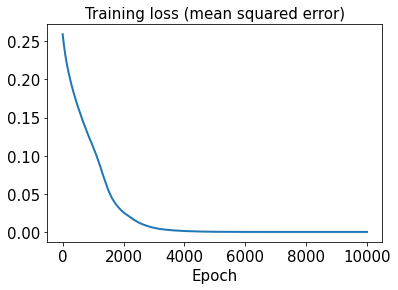

In [22]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

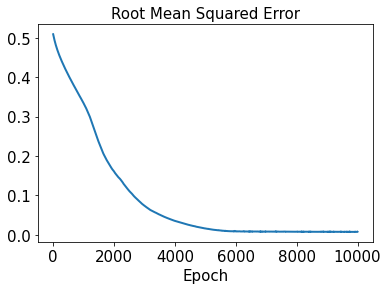

In [23]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [24]:
input_data = tf.keras.Input(shape=(n_sensors, 1))
reshape = tf.keras.layers.Reshape((n_sensors,))(input_data)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=101*101, activation=None, name='outputLayer')(x_)
output_img = tf.keras.layers.Reshape((101,101))(output_data)
# Shallow Decoder (SD)
sd1 = tf.keras.Model(input_data, output_img)
sd2 = tf.keras.Model(input_data, output_img)
sd3 = tf.keras.Model(input_data, output_img)

In [25]:
sd1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 reshape_2 (Reshape)         (None, 16)                0         
                                                                 
 firstHiddenLayer (Dense)    (None, 128)               2176      
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 secondHiddenLayer (Dense)   (None, 128)               16512     
                                                                 
 batch_normalization_1 (Batc  (None, 128)              512       
 hNormalization)                                           

In [26]:
sd1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [27]:
start1 = datetime.datetime.now()
history1 = sd1.fit(x_train1, y_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 17ms/step - loss: 0.5297 - rmse: 0.4945
Epoch 2/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5244 - rmse: 0.4902
Epoch 3/10000
2/2 [==============================] - 0s 66ms/step - loss: 0.5197 - rmse: 0.4864
Epoch 4/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5152 - rmse: 0.4829
Epoch 5/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5108 - rmse: 0.4794
Epoch 6/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5069 - rmse: 0.4763
Epoch 7/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5036 - rmse: 0.4739
Epoch 8/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4997 - rmse: 0.4709
Epoch 9/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4973 - rmse: 0.4693
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4935 - rmse: 0.4664
Epoch 11/10000
2/2 [==========================

2/2 [==============================] - 0s 6ms/step - loss: 0.3954 - rmse: 0.4320
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3965 - rmse: 0.4341
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3942 - rmse: 0.4323
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3928 - rmse: 0.4317
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3912 - rmse: 0.4306
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3899 - rmse: 0.4300
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3894 - rmse: 0.4303
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3884 - rmse: 0.4300
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3867 - rmse: 0.4289
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3877 - rmse: 0.4309
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 0.2802 - rmse: 0.3558
Epoch 171/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2792 - rmse: 0.3551
Epoch 172/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2769 - rmse: 0.3527
Epoch 173/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.2770 - rmse: 0.3536
Epoch 174/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2742 - rmse: 0.3503
Epoch 175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2731 - rmse: 0.3496
Epoch 176/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2701 - rmse: 0.3461
Epoch 177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2694 - rmse: 0.3458
Epoch 178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2671 - rmse: 0.3433
Epoch 179/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2659 - rmse: 0.3423
Epoch 180/10000
2/2 [==================

2/2 [==============================] - 0s 8ms/step - loss: 0.1542 - rmse: 0.1994
Epoch 255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1529 - rmse: 0.1971
Epoch 256/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1522 - rmse: 0.1964
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1513 - rmse: 0.1950
Epoch 258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1501 - rmse: 0.1930
Epoch 259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1505 - rmse: 0.1950
Epoch 260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1497 - rmse: 0.1938
Epoch 261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1466 - rmse: 0.1868
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1454 - rmse: 0.1846
Epoch 263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1451 - rmse: 0.1846
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0936 - rmse: 0.0822
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0938 - rmse: 0.0853
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0931 - rmse: 0.0830
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0926 - rmse: 0.0813
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0923 - rmse: 0.0811
Epoch 343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0928 - rmse: 0.0857
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0921 - rmse: 0.0833
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0908 - rmse: 0.0769
Epoch 346/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0923 - rmse: 0.0874
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0903 - rmse: 0.0768
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0689 - rmse: 0.0463
Epoch 423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0686 - rmse: 0.0453
Epoch 424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0676 - rmse: 0.0348
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0678 - rmse: 0.0407
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0673 - rmse: 0.0363
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0672 - rmse: 0.0385
Epoch 428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0667 - rmse: 0.0346
Epoch 429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0664 - rmse: 0.0327
Epoch 430/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0666 - rmse: 0.0380
Epoch 431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0679 - rmse: 0.0546
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0525 - rmse: 0.0198
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0533 - rmse: 0.0356
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0538 - rmse: 0.0437
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0526 - rmse: 0.0301
Epoch 510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0524 - rmse: 0.0287
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0523 - rmse: 0.0295
Epoch 512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0517 - rmse: 0.0215
Epoch 513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0518 - rmse: 0.0262
Epoch 514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0517 - rmse: 0.0272
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0526 - rmse: 0.0417
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0424 - rmse: 0.0329
Epoch 591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0419 - rmse: 0.0277
Epoch 592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0425 - rmse: 0.0377
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0416 - rmse: 0.0261
Epoch 594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0413 - rmse: 0.0211
Epoch 595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0411 - rmse: 0.0201
Epoch 596/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0410 - rmse: 0.0201
Epoch 597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0430 - rmse: 0.0495
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0417 - rmse: 0.0355
Epoch 599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0415 - rmse: 0.0342
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0333 - rmse: 0.0081
Epoch 675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0343 - rmse: 0.0342
Epoch 676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0336 - rmse: 0.0242
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0331 - rmse: 0.0113
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0335 - rmse: 0.0261
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0337 - rmse: 0.0303
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0334 - rmse: 0.0266
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0328 - rmse: 0.0140
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0344 - rmse: 0.0429
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0351 - rmse: 0.0514
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0282 - rmse: 0.0294
Epoch 759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0282 - rmse: 0.0302
Epoch 760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0276 - rmse: 0.0198
Epoch 761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0276 - rmse: 0.0220
Epoch 762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0274 - rmse: 0.0191
Epoch 763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0282 - rmse: 0.0345
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0277 - rmse: 0.0273
Epoch 765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0271 - rmse: 0.0158
Epoch 766/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0279 - rmse: 0.0325
Epoch 767/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0273 - rmse: 0.0240
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0241 - rmse: 0.0360
Epoch 843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0239 - rmse: 0.0333
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0239 - rmse: 0.0342
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0231 - rmse: 0.0204
Epoch 846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0238 - rmse: 0.0348
Epoch 847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0230 - rmse: 0.0216
Epoch 848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0246 - rmse: 0.0453
Epoch 849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0236 - rmse: 0.0334
Epoch 850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0227 - rmse: 0.0170
Epoch 851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0228 - rmse: 0.0212
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0201 - rmse: 0.0272
Epoch 927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0198 - rmse: 0.0201
Epoch 928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0197 - rmse: 0.0193
Epoch 929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0198 - rmse: 0.0230
Epoch 930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0194 - rmse: 0.0127
Epoch 931/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0203 - rmse: 0.0329
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0211 - rmse: 0.0443
Epoch 933/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0208 - rmse: 0.0408
Epoch 934/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0196 - rmse: 0.0224
Epoch 935/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0195 - rmse: 0.0201
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0178 - rmse: 0.0339
Epoch 1011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0172 - rmse: 0.0228
Epoch 1012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0169 - rmse: 0.0159
Epoch 1013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0176 - rmse: 0.0318
Epoch 1014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0172 - rmse: 0.0246
Epoch 1015/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0174 - rmse: 0.0298
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0180 - rmse: 0.0384
Epoch 1017/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0176 - rmse: 0.0329
Epoch 1018/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0170 - rmse: 0.0242
Epoch 1019/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0181 - rmse: 0.0413
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0146 - rmse: 0.0090
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0150 - rmse: 0.0230
Epoch 1095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0151 - rmse: 0.0254
Epoch 1096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0166 - rmse: 0.0459
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0158 - rmse: 0.0371
Epoch 1098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0148 - rmse: 0.0200
Epoch 1099/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0150 - rmse: 0.0253
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0154 - rmse: 0.0319
Epoch 1101/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0144 - rmse: 0.0090
Epoch 1102/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0146 - rmse: 0.0177
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0135 - rmse: 0.0281
Epoch 1177/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0137 - rmse: 0.0320
Epoch 1178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0141 - rmse: 0.0371
Epoch 1179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0133 - rmse: 0.0248
Epoch 1180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0128 - rmse: 0.0110
Epoch 1181/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0131 - rmse: 0.0209
Epoch 1182/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0143 - rmse: 0.0412
Epoch 1183/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0130 - rmse: 0.0204
Epoch 1184/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0147 - rmse: 0.0465
Epoch 1185/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0140 - rmse: 0.0373
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0124 - rmse: 0.0338
Epoch 1260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0117 - rmse: 0.0208
Epoch 1261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0115 - rmse: 0.0159
Epoch 1262/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0123 - rmse: 0.0337
Epoch 1263/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0123 - rmse: 0.0337
Epoch 1264/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0116 - rmse: 0.0209
Epoch 1265/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0116 - rmse: 0.0214
Epoch 1266/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0114 - rmse: 0.0177
Epoch 1267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.0281
Epoch 1268/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0114 - rmse: 0.0166
Epoch 1269/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0111 - rmse: 0.0340
Epoch 1343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0110 - rmse: 0.0318
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0117 - rmse: 0.0416
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0109 - rmse: 0.0311
Epoch 1346/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0102 - rmse: 0.0183
Epoch 1347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0103 - rmse: 0.0202
Epoch 1348/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.0443
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0102 - rmse: 0.0188
Epoch 1350/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0109 - rmse: 0.0321
Epoch 1351/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.0164
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0110 - rmse: 0.0458
Epoch 1426/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0089 - rmse: 0.0101
Epoch 1427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0097 - rmse: 0.0292
Epoch 1428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0147
Epoch 1429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0108
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0260
Epoch 1431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0268
Epoch 1432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0242
Epoch 1433/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0249
Epoch 1434/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0108
Epoch 1435/10000
2/2 [==============

2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0198
Epoch 1509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0189
Epoch 1510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0270
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0261
Epoch 1512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0090 - rmse: 0.0341
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0090 - rmse: 0.0340
Epoch 1514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0328
Epoch 1515/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0167
Epoch 1516/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0090 - rmse: 0.0341
Epoch 1517/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0252
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0295
Epoch 1592/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0090 - rmse: 0.0443
Epoch 1593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0119
Epoch 1594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0088 - rmse: 0.0428
Epoch 1595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0096
Epoch 1596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0319
Epoch 1597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0145
Epoch 1598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0325
Epoch 1599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0185
Epoch 1600/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0311
Epoch 1601/10000
2/2 [=============

2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0274
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0449
Epoch 1676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0341
Epoch 1677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0371
Epoch 1678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0363
Epoch 1679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0210
Epoch 1680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0247
Epoch 1681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0244
Epoch 1682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0482
Epoch 1683/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0167
Epoch 1684/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0300
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0427
Epoch 1759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0201
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0102
Epoch 1761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0299
Epoch 1762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0472
Epoch 1763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0332
Epoch 1764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0275
Epoch 1765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0302
Epoch 1766/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0066 - rmse: 0.0340
Epoch 1767/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0311
Epoch 1841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0198
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0256
Epoch 1843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0282
Epoch 1844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0429
Epoch 1845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0080
Epoch 1846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0425
Epoch 1847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0154
Epoch 1848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0339
Epoch 1849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0145
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0161
Epoch 1924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0310
Epoch 1925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0203
Epoch 1926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0186
Epoch 1927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0209
Epoch 1928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0159
Epoch 1929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0409
Epoch 1930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0314
Epoch 1931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0325
Epoch 1932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0208
Epoch 1933/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0153
Epoch 2007/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0107
Epoch 2008/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0254
Epoch 2009/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0098
Epoch 2010/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0283
Epoch 2011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0179
Epoch 2012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0310
Epoch 2013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0218
Epoch 2014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0414
Epoch 2015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0144
Epoch 2016/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0471
Epoch 2090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0337
Epoch 2091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0308
Epoch 2092/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0353
Epoch 2093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0153
Epoch 2094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0213
Epoch 2095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0100
Epoch 2096/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0334
Epoch 2097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0193
Epoch 2098/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0295
Epoch 2099/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0105
Epoch 2173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0297
Epoch 2174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0354
Epoch 2175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0345
Epoch 2176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0156
Epoch 2177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0202
Epoch 2178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0195
Epoch 2179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0290
Epoch 2180/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0214
Epoch 2181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0287
Epoch 2182/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0296
Epoch 2256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0212
Epoch 2257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0194
Epoch 2258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0170
Epoch 2259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0191
Epoch 2260/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0226
Epoch 2261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0216
Epoch 2262/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0164
Epoch 2263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0397
Epoch 2264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0292
Epoch 2265/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0326
Epoch 2339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0284
Epoch 2340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0428
Epoch 2341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0285
Epoch 2342/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0150
Epoch 2343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0224
Epoch 2344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0097
Epoch 2345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0191
Epoch 2346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0306
Epoch 2347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0370
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0137
Epoch 2422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0166
Epoch 2423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0207
Epoch 2424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0078
Epoch 2425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0329
Epoch 2426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0182
Epoch 2427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0182
Epoch 2428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0316
Epoch 2429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0308
Epoch 2430/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0304
Epoch 2431/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0327
Epoch 2505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0273
Epoch 2506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0499
Epoch 2507/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0368
Epoch 2508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0293
Epoch 2509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0234
Epoch 2510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0259
Epoch 2511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0273
Epoch 2512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0333
Epoch 2513/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0509
Epoch 2514/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0121
Epoch 2588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0153
Epoch 2589/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0238
Epoch 2590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0159
Epoch 2591/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0322
Epoch 2592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0220
Epoch 2593/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0255
Epoch 2594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0461
Epoch 2595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0244
Epoch 2596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0140
Epoch 2597/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0144
Epoch 2671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0304
Epoch 2672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0190
Epoch 2673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0315
Epoch 2674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0116
Epoch 2675/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0301
Epoch 2676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0195
Epoch 2677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0477
Epoch 2678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0226
Epoch 2679/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0160
Epoch 2680/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0300
Epoch 2754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0293
Epoch 2755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0383
Epoch 2756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0284
Epoch 2757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0281
Epoch 2758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0265
Epoch 2759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0120
Epoch 2760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0261
Epoch 2761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0226
Epoch 2762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0254
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0336
Epoch 2837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0229
Epoch 2838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0196
Epoch 2839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0177
Epoch 2840/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0215
Epoch 2841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0265
Epoch 2842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0156
Epoch 2843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0497
Epoch 2844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0357
Epoch 2845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0208
Epoch 2846/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0432
Epoch 2920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0121
Epoch 2921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0270
Epoch 2922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0260
Epoch 2923/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0436
Epoch 2924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0138
Epoch 2925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0187
Epoch 2926/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0438
Epoch 2927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0382
Epoch 2928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0133
Epoch 2929/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0164
Epoch 3003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0214
Epoch 3004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0214
Epoch 3005/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0332
Epoch 3006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0399
Epoch 3007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0290
Epoch 3008/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5442e-04 - rmse: 0.0106
Epoch 3009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0227
Epoch 3010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0170
Epoch 3011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0298
Epoch 3012/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0275
Epoch 3086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0299
Epoch 3087/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.6777e-04 - rmse: 0.0111
Epoch 3088/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0379
Epoch 3089/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0338
Epoch 3090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0325
Epoch 3091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0331
Epoch 3092/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0167
Epoch 3093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0209
Epoch 3094/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0271
Epoch 3095/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0302
Epoch 3168/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0476
Epoch 3169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0317
Epoch 3170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0206
Epoch 3171/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0292
Epoch 3172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0478
Epoch 3173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0400
Epoch 3174/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0263
Epoch 3175/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0018 - rmse: 0.0337
Epoch 3176/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0250
Epoch 3177/10000
2/2 [============

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0247
Epoch 3250/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0022e-04 - rmse: 0.0107
Epoch 3251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0305
Epoch 3252/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0270
Epoch 3253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0235
Epoch 3254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0383
Epoch 3255/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.6852e-04 - rmse: 0.0169
Epoch 3256/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4894e-04 - rmse: 0.0164
Epoch 3257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0290
Epoch 3258/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9969e-04 - rmse: 0.0205
Epoch 3259/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0267
Epoch 3332/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4572e-04 - rmse: 0.0049
Epoch 3333/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.1661e-04 - rmse: 0.0199
Epoch 3334/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0282
Epoch 3335/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7131e-04 - rmse: 0.0072
Epoch 3336/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3931e-04 - rmse: 0.0179
Epoch 3337/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4781e-04 - rmse: 0.0182
Epoch 3338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0368
Epoch 3339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0454
Epoch 3340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0257
Epoch 3341/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0434
Epoch 3413/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8556e-04 - rmse: 0.0180
Epoch 3414/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.0727e-04 - rmse: 0.0120
Epoch 3415/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.4264e-04 - rmse: 0.0090
Epoch 3416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0374
Epoch 3417/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7708e-04 - rmse: 0.0204
Epoch 3418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0319
Epoch 3419/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4230e-04 - rmse: 0.0091
Epoch 3420/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0854e-04 - rmse: 0.0187
Epoch 3421/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7448e-04 - rmse: 0.0227
Epoch 342

2/2 [==============================] - 0s 7ms/step - loss: 5.2291e-04 - rmse: 0.0104
Epoch 3494/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6283e-04 - rmse: 0.0122
Epoch 3495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0261
Epoch 3496/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5986e-04 - rmse: 0.0186
Epoch 3497/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6496e-04 - rmse: 0.0213
Epoch 3498/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3549e-04 - rmse: 0.0206
Epoch 3499/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0286
Epoch 3500/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0279
Epoch 3501/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0338
Epoch 3502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0358
Epoch 3503/10000


2/2 [==============================] - 0s 7ms/step - loss: 7.4987e-04 - rmse: 0.0196
Epoch 3576/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2547e-04 - rmse: 0.0236
Epoch 3577/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4055e-04 - rmse: 0.0132
Epoch 3578/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0293
Epoch 3579/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3401e-04 - rmse: 0.0238
Epoch 3580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0344
Epoch 3581/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2431e-04 - rmse: 0.0126
Epoch 3582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0285
Epoch 3583/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8295e-04 - rmse: 0.0108
Epoch 3584/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2231e-04 - rmse: 0.0189
Epoch 358

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0281
Epoch 3657/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3055e-04 - rmse: 0.0100
Epoch 3658/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8115e-04 - rmse: 0.0123
Epoch 3659/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.8982e-04 - rmse: 0.0257
Epoch 3660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0271
Epoch 3661/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0260
Epoch 3662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0309
Epoch 3663/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6628e-04 - rmse: 0.0253
Epoch 3664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0468
Epoch 3665/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0807e-04 - rmse: 0.0167
Epoch 3666/10000


2/2 [==============================] - 0s 7ms/step - loss: 6.4845e-04 - rmse: 0.0187
Epoch 3738/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.1704e-04 - rmse: 0.0205
Epoch 3739/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5044e-04 - rmse: 0.0073
Epoch 3740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0316
Epoch 3741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0310
Epoch 3742/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1324e-04 - rmse: 0.0178
Epoch 3743/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.3235e-04 - rmse: 0.0060
Epoch 3744/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0017 - rmse: 0.0368
Epoch 3745/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0014 - rmse: 0.0338
Epoch 3746/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.9056e-04 - rmse: 0.0244
Epoch 374

2/2 [==============================] - 0s 7ms/step - loss: 4.8887e-04 - rmse: 0.0148
Epoch 3819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0458
Epoch 3820/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0457
Epoch 3821/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0310
Epoch 3822/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.0396e-04 - rmse: 0.0154
Epoch 3823/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6490e-04 - rmse: 0.0172
Epoch 3824/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.4024e-04 - rmse: 0.0165
Epoch 3825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0283
Epoch 3826/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4594e-04 - rmse: 0.0219
Epoch 3827/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4562e-04 - rmse: 0.0089
Epoch 3828/10

2/2 [==============================] - 0s 7ms/step - loss: 4.6847e-04 - rmse: 0.0150
Epoch 3900/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7577e-04 - rmse: 0.0208
Epoch 3901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0472
Epoch 3902/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1443e-04 - rmse: 0.0239
Epoch 3903/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2580e-04 - rmse: 0.0168
Epoch 3904/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2162e-04 - rmse: 0.0241
Epoch 3905/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0024 - rmse: 0.0467
Epoch 3906/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.3544e-04 - rmse: 0.0171
Epoch 3907/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.3073e-04 - rmse: 0.0263
Epoch 3908/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.3110e-04 - rmse: 0.0197
E

2/2 [==============================] - 0s 7ms/step - loss: 5.6135e-04 - rmse: 0.0184
Epoch 3981/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6751e-04 - rmse: 0.0186
Epoch 3982/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5514e-04 - rmse: 0.0231
Epoch 3983/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.3719e-04 - rmse: 0.0268
Epoch 3984/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0395
Epoch 3985/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0317e-04 - rmse: 0.0168
Epoch 3986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0308
Epoch 3987/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0282
Epoch 3988/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7644e-04 - rmse: 0.0160
Epoch 3989/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.0854e-04 - rmse: 0.0243
Epoch 399

2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1502e-04 - rmse: 0.0177
Epoch 4063/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8917e-04 - rmse: 0.0262
Epoch 4064/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0310
Epoch 4065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0376
Epoch 4066/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7217e-04 - rmse: 0.0164
Epoch 4067/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0324
Epoch 4068/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.2057e-04 - rmse: 0.0205
Epoch 4069/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4193e-04 - rmse: 0.0272
Epoch 4070/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0020 - rmse: 0.0426
Epoch 4071/100

2/2 [==============================] - 0s 8ms/step - loss: 3.0381e-04 - rmse: 0.0109
Epoch 4143/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7420e-04 - rmse: 0.0170
Epoch 4144/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7579e-04 - rmse: 0.0197
Epoch 4145/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0316
Epoch 4146/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5021e-04 - rmse: 0.0216
Epoch 4147/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 4148/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2641e-04 - rmse: 0.0185
Epoch 4149/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0299
Epoch 4150/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3516e-04 - rmse: 0.0187
Epoch 4151/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.4888e-04 - rmse: 0.0238
Epoch 415

2/2 [==============================] - 0s 8ms/step - loss: 2.2888e-04 - rmse: 0.0076
Epoch 4224/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3113e-04 - rmse: 0.0190
Epoch 4225/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0410e-04 - rmse: 0.0152
Epoch 4226/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0300
Epoch 4227/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5508e-04 - rmse: 0.0280
Epoch 4228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0461
Epoch 4229/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8589e-04 - rmse: 0.0107
Epoch 4230/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9106e-04 - rmse: 0.0045
Epoch 4231/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0569e-04 - rmse: 0.0153
Epoch 4232/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0012 - rmse: 0.0315
Epoch 4

2/2 [==============================] - 0s 9ms/step - loss: 2.2812e-04 - rmse: 0.0084
Epoch 4305/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0375
Epoch 4306/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0134e-04 - rmse: 0.0120
Epoch 4307/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0369
Epoch 4308/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7705e-04 - rmse: 0.0228
Epoch 4309/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0167e-04 - rmse: 0.0254
Epoch 4310/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9784e-04 - rmse: 0.0064
Epoch 4311/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8390e-04 - rmse: 0.0151
Epoch 4312/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0455
Epoch 4313/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2197e-04 - rmse: 0.0216
Epoch 431

2/2 [==============================] - 0s 8ms/step - loss: 5.6070e-04 - rmse: 0.0204
Epoch 4386/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9226e-04 - rmse: 0.0254
Epoch 4387/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7814e-04 - rmse: 0.0208
Epoch 4388/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6117e-04 - rmse: 0.0227
Epoch 4389/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3580e-04 - rmse: 0.0095
Epoch 4390/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4482e-04 - rmse: 0.0245
Epoch 4391/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6455e-04 - rmse: 0.0179
Epoch 4392/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0552e-04 - rmse: 0.0190
Epoch 4393/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0300
Epoch 4394/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0339
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 3.2964e-04 - rmse: 0.0140
Epoch 4467/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0456
Epoch 4468/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0398
Epoch 4469/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 4470/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0463
Epoch 4471/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0340
Epoch 4472/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5394e-04 - rmse: 0.0149
Epoch 4473/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0334
Epoch 4474/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4552e-04 - rmse: 0.0203
Epoch 4475/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1607e-04 - rmse: 0.0196
Epoch 4476/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 9.2212e-04 - rmse: 0.0282
Epoch 4548/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0301
Epoch 4549/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0353
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7282e-04 - rmse: 0.0274
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6565e-04 - rmse: 0.0272
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0430
Epoch 4553/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9898e-04 - rmse: 0.0194
Epoch 4554/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0332
Epoch 4555/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7218e-04 - rmse: 0.0158
Epoch 4556/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7549e-04 - rmse: 0.0213
Epoch 4557/10

2/2 [==============================] - 0s 7ms/step - loss: 1.8031e-04 - rmse: 0.0081
Epoch 4629/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6155e-04 - rmse: 0.0157
Epoch 4630/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0366
Epoch 4631/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0456
Epoch 4632/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3590e-04 - rmse: 0.0110
Epoch 4633/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0395
Epoch 4634/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4681e-04 - rmse: 0.0153
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5788e-04 - rmse: 0.0156
Epoch 4636/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0448e-04 - rmse: 0.0281
Epoch 4637/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2701e-04 - rmse: 0.0267
Epoch 463

2/2 [==============================] - 0s 7ms/step - loss: 5.6265e-04 - rmse: 0.0213
Epoch 4710/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0432
Epoch 4711/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6607e-04 - rmse: 0.0126
Epoch 4712/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5559e-04 - rmse: 0.0158
Epoch 4713/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6404e-04 - rmse: 0.0256
Epoch 4714/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9010e-04 - rmse: 0.0280
Epoch 4715/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7363e-04 - rmse: 0.0295
Epoch 4716/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 4717/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0437e-04 - rmse: 0.0264
Epoch 4718/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0307
Epoch 471

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0454
Epoch 4791/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0553e-04 - rmse: 0.0175
Epoch 4792/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0401
Epoch 4793/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 4794/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6417e-04 - rmse: 0.0276
Epoch 4795/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 4796/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7095e-04 - rmse: 0.0217
Epoch 4797/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1260e-04 - rmse: 0.0203
Epoch 4798/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0333
Epoch 4799/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2150e-04 - rmse: 0.0249
Epoch 4800/10000


2/2 [==============================] - 0s 8ms/step - loss: 1.1753e-04 - rmse: 0.0049
Epoch 4872/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0454
Epoch 4873/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0362
Epoch 4874/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4616e-04 - rmse: 0.0073
Epoch 4875/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.5988e-04 - rmse: 0.0277
Epoch 4876/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0457
Epoch 4877/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6112e-04 - rmse: 0.0259
Epoch 4878/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0313
Epoch 4879/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4260e-04 - rmse: 0.0071
Epoch 4880/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1459e-04 - rmse: 0.0111
Epoch 4881/1

2/2 [==============================] - 0s 12ms/step - loss: 2.0554e-04 - rmse: 0.0109
Epoch 4953/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8408e-04 - rmse: 0.0099
Epoch 4954/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5438e-04 - rmse: 0.0082
Epoch 4955/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7245e-04 - rmse: 0.0169
Epoch 4956/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8107e-04 - rmse: 0.0097
Epoch 4957/10000
2/2 [==============================] - 0s 20ms/step - loss: 1.8821e-04 - rmse: 0.0101
Epoch 4958/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.7098e-04 - rmse: 0.0242
Epoch 4959/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4365e-04 - rmse: 0.0126
Epoch 4960/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0332
Epoch 4961/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.031

2/2 [==============================] - 0s 7ms/step - loss: 2.6363e-04 - rmse: 0.0135
Epoch 5034/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8946e-04 - rmse: 0.0176
Epoch 5035/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 5036/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 5037/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5842e-04 - rmse: 0.0088
Epoch 5038/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 5039/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5739e-04 - rmse: 0.0218
Epoch 5040/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6260e-04 - rmse: 0.0297
Epoch 5041/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7513e-04 - rmse: 0.0098
Epoch 5042/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3921e-04 - rmse: 0.0257
Epoch 504

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0307
Epoch 5115/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2819e-04 - rmse: 0.0256
Epoch 5116/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0830e-04 - rmse: 0.0058
Epoch 5117/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1417e-04 - rmse: 0.0184
Epoch 5118/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7537e-04 - rmse: 0.0265
Epoch 5119/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5453e-04 - rmse: 0.0089
Epoch 5120/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0309
Epoch 5121/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.1785e-04 - rmse: 0.0066
Epoch 5122/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0357e-04 - rmse: 0.0054
Epoch 5123/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6121e-04 - rmse: 0.0280
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0362
Epoch 5196/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6621e-04 - rmse: 0.0098
Epoch 5197/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0495e-04 - rmse: 0.0252
Epoch 5198/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5199/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4226e-04 - rmse: 0.0165
Epoch 5200/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 5201/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 5202/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4455e-04 - rmse: 0.0166
Epoch 5203/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6566e-04 - rmse: 0.0199
Epoch 5204/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3303e-04 - rmse: 0.0215
Epoch 5205/10

2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 5277/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2257e-04 - rmse: 0.0160
Epoch 5278/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2448e-04 - rmse: 0.0214
Epoch 5279/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 5280/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5373e-04 - rmse: 0.0137
Epoch 5281/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0214e-04 - rmse: 0.0154
Epoch 5282/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5480e-04 - rmse: 0.0281
Epoch 5283/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8963e-05 - rmse: 0.0048
Epoch 5284/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7916e-04 - rmse: 0.0203
Epoch 5285/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7075e-04 - rmse: 0.0201
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 5358/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0414
Epoch 5359/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5363e-04 - rmse: 0.0096
Epoch 5360/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4307e-04 - rmse: 0.0091
Epoch 5361/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5225e-04 - rmse: 0.0139
Epoch 5362/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 5363/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9481e-04 - rmse: 0.0208
Epoch 5364/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3159e-04 - rmse: 0.0084
Epoch 5365/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8044e-04 - rmse: 0.0249
Epoch 5366/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2493e-04 - rmse: 0.0294
Epoch 536

2/2 [==============================] - 0s 7ms/step - loss: 9.1856e-05 - rmse: 0.0059
Epoch 5439/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 5440/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 5441/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4437e-04 - rmse: 0.0281
Epoch 5442/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0701e-04 - rmse: 0.0255
Epoch 5443/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7714e-04 - rmse: 0.0205
Epoch 5444/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5926e-04 - rmse: 0.0101
Epoch 5445/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5387e-04 - rmse: 0.0172
Epoch 5446/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2783e-04 - rmse: 0.0131
Epoch 5447/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4890e-04 - rmse: 0.0263
Epoch

2/2 [==============================] - 0s 7ms/step - loss: 8.4306e-04 - rmse: 0.0281
Epoch 5520/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3459e-04 - rmse: 0.0090
Epoch 5521/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6714e-05 - rmse: 0.0066
Epoch 5522/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.6200e-04 - rmse: 0.0176
Epoch 5523/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 5524/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1225e-04 - rmse: 0.0077
Epoch 5525/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4794e-04 - rmse: 0.0199
Epoch 5526/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5527/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 5528/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.2580e-04 - rmse: 0.0278
Epoch 552

2/2 [==============================] - 0s 8ms/step - loss: 1.8140e-04 - rmse: 0.0115
Epoch 5601/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4230e-04 - rmse: 0.0222
Epoch 5602/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 5603/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9726e-04 - rmse: 0.0255
Epoch 5604/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3404e-04 - rmse: 0.0092
Epoch 5605/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7254e-04 - rmse: 0.0206
Epoch 5606/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5000e-04 - rmse: 0.0101
Epoch 5607/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6777e-05 - rmse: 0.0062
Epoch 5608/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1107e-04 - rmse: 0.0190
Epoch 5609/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0322
Epoch

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 5682/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8796e-05 - rmse: 0.0073
Epoch 5683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 5684/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7286e-04 - rmse: 0.0151
Epoch 5685/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4438e-04 - rmse: 0.0173
Epoch 5686/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0320
Epoch 5687/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3593e-04 - rmse: 0.0138
Epoch 5688/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2807e-04 - rmse: 0.0196
Epoch 5689/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 5690/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0694e-04 - rmse: 0.0257
Epoch 5691/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 5763/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4539e-04 - rmse: 0.0201
Epoch 5764/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9340e-04 - rmse: 0.0187
Epoch 5765/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2663e-04 - rmse: 0.0092
Epoch 5766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 5767/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8142e-04 - rmse: 0.0253
Epoch 5768/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2118e-04 - rmse: 0.0089
Epoch 5769/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0176e-04 - rmse: 0.0126
Epoch 5770/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3772e-04 - rmse: 0.0098
Epoch 5771/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.0163e-04 - rmse: 0.0237
Epoch

Epoch 5843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0459
Epoch 5844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 5845/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9128e-04 - rmse: 0.0159
Epoch 5846/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9456e-04 - rmse: 0.0213
Epoch 5847/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2761e-04 - rmse: 0.0243
Epoch 5848/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9273e-04 - rmse: 0.0188
Epoch 5849/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2475e-04 - rmse: 0.0196
Epoch 5850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 5851/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5744e-04 - rmse: 0.0148
Epoch 5852/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5831e-04 - rmse:

2/2 [==============================] - 0s 8ms/step - loss: 2.1102e-04 - rmse: 0.0132
Epoch 5924/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.1235e-04 - rmse: 0.0240
Epoch 5925/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5564e-04 - rmse: 0.0179
Epoch 5926/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2225e-04 - rmse: 0.0093
Epoch 5927/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2549e-04 - rmse: 0.0095
Epoch 5928/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2043e-04 - rmse: 0.0092
Epoch 5929/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6523e-04 - rmse: 0.0182
Epoch 5930/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6455e-04 - rmse: 0.0151
Epoch 5931/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9270e-04 - rmse: 0.0309
Epoch 5932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
E

Epoch 6004/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0103e-04 - rmse: 0.0082
Epoch 6005/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7431e-04 - rmse: 0.0210
Epoch 6006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6007/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9176e-04 - rmse: 0.0257
Epoch 6008/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.5580e-04 - rmse: 0.0180
Epoch 6009/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7895e-04 - rmse: 0.0186
Epoch 6010/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8364e-04 - rmse: 0.0255
Epoch 6011/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1678e-05 - rmse: 0.0054
Epoch 6012/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2342e-04 - rmse: 0.0298
Epoch 6013/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0836e-04

2/2 [==============================] - 0s 7ms/step - loss: 4.1373e-04 - rmse: 0.0196
Epoch 6086/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5313e-04 - rmse: 0.0269
Epoch 6087/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4293e-04 - rmse: 0.0106
Epoch 6088/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8718e-04 - rmse: 0.0214
Epoch 6089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 6091/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8402e-04 - rmse: 0.0256
Epoch 6092/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.5522e-05 - rmse: 0.0074
Epoch 6093/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0276e-04 - rmse: 0.0131
Epoch 6094/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2402e-05 - rmse: 0.0057
Epoch

2/2 [==============================] - 0s 10ms/step - loss: 2.6668e-04 - rmse: 0.0155
Epoch 6167/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1845e-04 - rmse: 0.0222
Epoch 6168/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1411e-04 - rmse: 0.0280
Epoch 6169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 6170/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5552e-04 - rmse: 0.0288
Epoch 6171/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4234e-04 - rmse: 0.0285
Epoch 6172/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7345e-04 - rmse: 0.0273
Epoch 6173/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2192e-04 - rmse: 0.0199
Epoch 6174/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1898e-04 - rmse: 0.0138
Epoch 6175/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1660e-04 - rmse: 0.0137


2/2 [==============================] - 0s 8ms/step - loss: 6.7266e-04 - rmse: 0.0254
Epoch 6248/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7163e-04 - rmse: 0.0186
Epoch 6249/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3330e-04 - rmse: 0.0175
Epoch 6250/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9123e-04 - rmse: 0.0191
Epoch 6251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 6252/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5446e-04 - rmse: 0.0181
Epoch 6253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 6254/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 6255/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.4181e-04 - rmse: 0.0147
Epoch 6256/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2167e-04 - rmse: 0.0140
Epoch 

Epoch 6328/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9285e-04 - rmse: 0.0311
Epoch 6329/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9239e-04 - rmse: 0.0238
Epoch 6330/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9316e-04 - rmse: 0.0295
Epoch 6331/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 6332/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3751e-04 - rmse: 0.0177
Epoch 6333/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6334/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5776e-04 - rmse: 0.0153
Epoch 6335/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 6336/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6337/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7449e-05 - rmse: 0.0

2/2 [==============================] - 0s 8ms/step - loss: 5.0411e-04 - rmse: 0.0220
Epoch 6409/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2708e-04 - rmse: 0.0225
Epoch 6410/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8541e-04 - rmse: 0.0276
Epoch 6411/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2200e-04 - rmse: 0.0224
Epoch 6412/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7268e-04 - rmse: 0.0292
Epoch 6413/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9760e-04 - rmse: 0.0194
Epoch 6414/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5437e-04 - rmse: 0.0289
Epoch 6415/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.9364e-04 - rmse: 0.0259
Epoch 6416/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9763e-04 - rmse: 0.0296
Epoch 6417/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7084e-05 - rmse: 0.00

Epoch 6489/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9499e-04 - rmse: 0.0218
Epoch 6490/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5164e-04 - rmse: 0.0182
Epoch 6491/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5645e-04 - rmse: 0.0117
Epoch 6492/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.4838e-04 - rmse: 0.0270
Epoch 6493/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3016e-04 - rmse: 0.0105
Epoch 6494/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7695e-04 - rmse: 0.0214
Epoch 6495/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0549e-04 - rmse: 0.0169
Epoch 6496/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5195e-04 - rmse: 0.0251
Epoch 6497/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8993e-04 - rmse: 0.0277
Epoch 6498/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014

2/2 [==============================] - 0s 8ms/step - loss: 5.7718e-04 - rmse: 0.0236
Epoch 6570/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5217e-04 - rmse: 0.0183
Epoch 6571/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0160e-04 - rmse: 0.0196
Epoch 6572/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0438e-04 - rmse: 0.0197
Epoch 6573/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5535e-04 - rmse: 0.0289
Epoch 6574/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 6575/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9195e-04 - rmse: 0.0193
Epoch 6576/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.2017e-04 - rmse: 0.0283
Epoch 6577/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7475e-05 - rmse: 0.0063
Epoch 6578/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8025e-05 - rmse: 0.0055
E

Epoch 6650/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 6651/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 6652/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9408e-04 - rmse: 0.0167
Epoch 6653/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4399e-04 - rmse: 0.0113
Epoch 6654/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3454e-04 - rmse: 0.0286
Epoch 6655/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3929e-04 - rmse: 0.0206
Epoch 6656/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7011e-04 - rmse: 0.0124
Epoch 6657/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0037e-04 - rmse: 0.0297
Epoch 6658/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2794e-04 - rmse: 0.0145
Epoch 6659/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1785e-04 - r

2/2 [==============================] - 0s 8ms/step - loss: 2.6857e-04 - rmse: 0.0159
Epoch 6732/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 6733/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5522e-04 - rmse: 0.0290
Epoch 6734/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 6735/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7260e-04 - rmse: 0.0214
Epoch 6736/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3720e-04 - rmse: 0.0205
Epoch 6737/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9959e-04 - rmse: 0.0136
Epoch 6738/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2753e-04 - rmse: 0.0267
Epoch 6739/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9455e-04 - rmse: 0.0219
Epoch 6740/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7624e-04 - rmse: 0.0276
Epoch

Epoch 6812/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0528e-04 - rmse: 0.0171
Epoch 6813/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9121e-04 - rmse: 0.0240
Epoch 6814/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.1911e-04 - rmse: 0.0265
Epoch 6815/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1001e-04 - rmse: 0.0098
Epoch 6816/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5054e-04 - rmse: 0.0209
Epoch 6817/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4687e-04 - rmse: 0.0251
Epoch 6818/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1109e-05 - rmse: 0.0061
Epoch 6819/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7726e-04 - rmse: 0.0257
Epoch 6820/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7419e-04 - rmse: 0.0161
Epoch 6821/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9481

2/2 [==============================] - 0s 8ms/step - loss: 3.2344e-05 - rmse: 0.0043
Epoch 6893/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3401e-04 - rmse: 0.0149
Epoch 6894/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5897e-04 - rmse: 0.0291
Epoch 6895/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3769e-05 - rmse: 0.0064
Epoch 6896/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.0912e-04 - rmse: 0.0223
Epoch 6897/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2548e-04 - rmse: 0.0177
Epoch 6898/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4799e-04 - rmse: 0.0208
Epoch 6899/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4261e-05 - rmse: 0.0046
Epoch 6900/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9403e-04 - rmse: 0.0279
Epoch 6901/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1743e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6974/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4170e-04 - rmse: 0.0305
Epoch 6975/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 6976/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2927e-04 - rmse: 0.0178
Epoch 6977/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7459e-04 - rmse: 0.0162
Epoch 6978/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 6979/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9274e-04 - rmse: 0.0279
Epoch 6980/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2896e-04 - rmse: 0.0178
Epoch 6981/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3708e-04 - rmse: 0.0150
Epoch 6982/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5748e-04 - rmse: 0.0157
Epoch 698

2/2 [==============================] - 0s 8ms/step - loss: 5.8949e-04 - rmse: 0.0240
Epoch 7055/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8823e-04 - rmse: 0.0166
Epoch 7056/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4547e-04 - rmse: 0.0153
Epoch 7057/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4734e-04 - rmse: 0.0154
Epoch 7058/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5103e-04 - rmse: 0.0184
Epoch 7059/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8022e-04 - rmse: 0.0130
Epoch 7060/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6454e-04 - rmse: 0.0188
Epoch 7061/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7443e-04 - rmse: 0.0128
Epoch 7062/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 7063/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1944e-04 - rmse: 0.0202
E

2/2 [==============================] - 0s 7ms/step - loss: 4.1973e-04 - rmse: 0.0202
Epoch 7135/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5500e-05 - rmse: 0.0021
Epoch 7136/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4497e-04 - rmse: 0.0306
Epoch 7137/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7679e-04 - rmse: 0.0238
Epoch 7138/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1396e-04 - rmse: 0.0201
Epoch 7139/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2860e-05 - rmse: 0.0013
Epoch 7140/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.8211e-04 - rmse: 0.0278
Epoch 7141/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1384e-04 - rmse: 0.0201
Epoch 7142/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5581e-05 - rmse: 0.0021
Epoch 7143/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0984e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 4.3150e-05 - rmse: 0.0057
Epoch 7215/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2011e-04 - rmse: 0.0247
Epoch 7216/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7664e-04 - rmse: 0.0216
Epoch 7217/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 7218/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 7219/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3129e-04 - rmse: 0.0179
Epoch 7220/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4267e-04 - rmse: 0.0251
Epoch 7221/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4698e-04 - rmse: 0.0252
Epoch 7222/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4020e-04 - rmse: 0.0305
Epoch 7223/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 722

Epoch 7295/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0358e-04 - rmse: 0.0282
Epoch 7296/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2825e-04 - rmse: 0.0268
Epoch 7297/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2456e-04 - rmse: 0.0107
Epoch 7298/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8316e-04 - rmse: 0.0165
Epoch 7299/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2729e-05 - rmse: 0.0066
Epoch 7300/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.5975e-04 - rmse: 0.0308
Epoch 7301/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3644e-04 - rmse: 0.0181
Epoch 7302/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 7303/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2888e-04 - rmse: 0.0303
Epoch 7304/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7673e-05

2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 7376/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1616e-05 - rmse: 0.0057
Epoch 7377/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7079e-05 - rmse: 0.0088
Epoch 7378/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8849e-04 - rmse: 0.0134
Epoch 7379/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4657e-04 - rmse: 0.0209
Epoch 7380/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5357e-05 - rmse: 0.0087
Epoch 7381/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9305e-05 - rmse: 0.0032
Epoch 7382/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8073e-04 - rmse: 0.0131
Epoch 7383/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7536e-05 - rmse: 0.0053
Epoch 7384/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3296e-04 - rmse: 0.0304
E

2/2 [==============================] - 0s 7ms/step - loss: 9.4025e-04 - rmse: 0.0305
Epoch 7456/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 7457/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2676e-04 - rmse: 0.0228
Epoch 7458/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9832e-04 - rmse: 0.0243
Epoch 7459/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7242e-04 - rmse: 0.0258
Epoch 7460/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7499e-04 - rmse: 0.0163
Epoch 7461/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0395e-04 - rmse: 0.0172
Epoch 7462/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9849e-04 - rmse: 0.0243
Epoch 7463/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6840e-04 - rmse: 0.0161
Epoch 7464/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7339e-04 - rmse: 0.0294
E

2/2 [==============================] - 0s 6ms/step - loss: 9.4932e-04 - rmse: 0.0307
Epoch 7537/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4548e-04 - rmse: 0.0306
Epoch 7538/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6412e-04 - rmse: 0.0256
Epoch 7539/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.9317e-04 - rmse: 0.0196
Epoch 7540/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5853e-04 - rmse: 0.0292
Epoch 7541/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5373e-05 - rmse: 0.0052
Epoch 7542/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5989e-04 - rmse: 0.0255
Epoch 7543/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6992e-04 - rmse: 0.0237
Epoch 7544/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7545/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4623e-04 - rmse: 0.0209
E

Epoch 7617/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0823e-04 - rmse: 0.0224
Epoch 7618/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3406e-04 - rmse: 0.0304
Epoch 7619/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.3423e-04 - rmse: 0.0304
Epoch 7620/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3497e-04 - rmse: 0.0207
Epoch 7621/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.2266e-04 - rmse: 0.0285
Epoch 7622/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.7517e-04 - rmse: 0.0258
Epoch 7623/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1316e-04 - rmse: 0.0284
Epoch 7624/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 7625/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3019e-04 - rmse: 0.0249
Epoch 7626/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3045e-05

2/2 [==============================] - 0s 11ms/step - loss: 2.8103e-04 - rmse: 0.0165
Epoch 7698/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3710e-05 - rmse: 0.0040
Epoch 7699/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 7700/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.6263e-04 - rmse: 0.0256
Epoch 7701/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 7702/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1263e-04 - rmse: 0.0102
Epoch 7703/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2605e-04 - rmse: 0.0178
Epoch 7704/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2976e-05 - rmse: 0.0081
Epoch 7705/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0697e-04 - rmse: 0.0100
Epoch 7706/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1973e-04 - rmse: 0.0302
E

Epoch 7778/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2487e-04 - rmse: 0.0178
Epoch 7779/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0616e-04 - rmse: 0.0264
Epoch 7780/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2986e-04 - rmse: 0.0180
Epoch 7781/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0044e-05 - rmse: 0.0073
Epoch 7782/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 7783/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2059e-05 - rmse: 0.0092
Epoch 7784/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5207e-04 - rmse: 0.0233
Epoch 7785/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5293e-04 - rmse: 0.0186
Epoch 7786/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 7787/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.6319e-04 - r

2/2 [==============================] - 0s 7ms/step - loss: 4.4581e-04 - rmse: 0.0209
Epoch 7859/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7363e-05 - rmse: 0.0045
Epoch 7860/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7224e-04 - rmse: 0.0238
Epoch 7861/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0856e-04 - rmse: 0.0224
Epoch 7862/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5020e-04 - rmse: 0.0254
Epoch 7863/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7864/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2007e-04 - rmse: 0.0267
Epoch 7865/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3314e-04 - rmse: 0.0304
Epoch 7866/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5489e-05 - rmse: 0.0070
Epoch 7867/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7577e-05 - rmse: 0.0071
E

2/2 [==============================] - 0s 7ms/step - loss: 3.5731e-04 - rmse: 0.0187
Epoch 7939/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7586e-04 - rmse: 0.0311
Epoch 7940/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9660e-04 - rmse: 0.0315
Epoch 7941/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7942/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7943/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5007e-04 - rmse: 0.0185
Epoch 7944/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.0402e-04 - rmse: 0.0282
Epoch 7945/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8246e-04 - rmse: 0.0194
Epoch 7946/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7254e-04 - rmse: 0.0191
Epoch 7947/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 794

2/2 [==============================] - 0s 7ms/step - loss: 4.7514e-04 - rmse: 0.0216
Epoch 8020/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 8021/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6815e-04 - rmse: 0.0162
Epoch 8022/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 8023/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 8024/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 8025/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 8026/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 8027/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5331e-04 - rmse: 0.0234
Epoch 8028/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3397e-04 - rmse: 0.0151
Epoch 8029/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 4.0086e-04 - rmse: 0.0199
Epoch 8101/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4804e-04 - rmse: 0.0253
Epoch 8102/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8103/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8300e-04 - rmse: 0.0194
Epoch 8104/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 8105/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2617e-04 - rmse: 0.0148
Epoch 8106/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0694e-04 - rmse: 0.0100
Epoch 8107/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8370e-04 - rmse: 0.0279
Epoch 8108/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3900e-04 - rmse: 0.0305
Epoch 8109/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4289e-04 - rmse: 0.0252
Epoch

2/2 [==============================] - 0s 9ms/step - loss: 4.0958e-05 - rmse: 0.0059
Epoch 8181/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3296e-05 - rmse: 0.0042
Epoch 8182/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.2053e-04 - rmse: 0.0146
Epoch 8183/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4032e-04 - rmse: 0.0306
Epoch 8184/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0807e-04 - rmse: 0.0201
Epoch 8185/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3947e-04 - rmse: 0.0306
Epoch 8186/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0802e-04 - rmse: 0.0224
Epoch 8187/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0231e-06 - rmse: 0.0010
Epoch 8188/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3986e-04 - rmse: 0.0252
Epoch 8189/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7413e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 7.4269e-05 - rmse: 0.0083
Epoch 8261/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0944e-06 - rmse: 0.0011
Epoch 8262/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7479e-04 - rmse: 0.0130
Epoch 8263/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4262e-04 - rmse: 0.0252
Epoch 8264/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6890e-04 - rmse: 0.0237
Epoch 8265/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 8266/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3129e-04 - rmse: 0.0150
Epoch 8267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 8268/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4185e-04 - rmse: 0.0252
Epoch 8269/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9473e-05 - rmse: 0.0086
Epoch

Epoch 8341/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9387e-04 - rmse: 0.0170
Epoch 8342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 8343/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3917e-05 - rmse: 0.0076
Epoch 8344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 8345/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.8512e-05 - rmse: 0.0096
Epoch 8346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 8347/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9412e-04 - rmse: 0.0170
Epoch 8348/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4532e-05 - rmse: 0.0054
Epoch 8349/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0300e-04 - rmse: 0.0244
Epoch 8350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0

2/2 [==============================] - 0s 7ms/step - loss: 6.3550e-04 - rmse: 0.0251
Epoch 8422/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3457e-04 - rmse: 0.0270
Epoch 8423/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2701e-04 - rmse: 0.0205
Epoch 8424/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.1512e-04 - rmse: 0.0285
Epoch 8425/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.9873e-04 - rmse: 0.0198
Epoch 8426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 8427/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 8428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 8429/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8430/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6477e-04 - rmse: 0.0214
Epoch 8431/10

2/2 [==============================] - 0s 7ms/step - loss: 1.0471e-04 - rmse: 0.0100
Epoch 8503/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6112e-04 - rmse: 0.0256
Epoch 8504/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.8887e-04 - rmse: 0.0242
Epoch 8505/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5939e-04 - rmse: 0.0159
Epoch 8506/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2022e-04 - rmse: 0.0107
Epoch 8507/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6168e-04 - rmse: 0.0214
Epoch 8508/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6509e-04 - rmse: 0.0257
Epoch 8509/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6601e-04 - rmse: 0.0215
Epoch 8510/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4898e-04 - rmse: 0.0307
Epoch 8511/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9681e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 3.8056e-04 - rmse: 0.0194
Epoch 8583/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3902e-04 - rmse: 0.0116
Epoch 8584/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.7572e-04 - rmse: 0.0295
Epoch 8585/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8460e-04 - rmse: 0.0134
Epoch 8586/10000
2/2 [==============================] - 0s 19ms/step - loss: 4.2327e-04 - rmse: 0.0204
Epoch 8587/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 8588/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9739e-04 - rmse: 0.0139
Epoch 8589/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 8590/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2218e-04 - rmse: 0.0108
Epoch 8591/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.9177e-04 - rmse: 0.022

2/2 [==============================] - 0s 7ms/step - loss: 9.9530e-04 - rmse: 0.0315
Epoch 8663/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3642e-04 - rmse: 0.0208
Epoch 8664/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7762e-04 - rmse: 0.0193
Epoch 8665/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.5356e-05 - rmse: 0.0071
Epoch 8666/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.0435e-05 - rmse: 0.0074
Epoch 8667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 8668/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7682e-04 - rmse: 0.0312
Epoch 8669/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4756e-05 - rmse: 0.0084
Epoch 8670/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.4365e-04 - rmse: 0.0154
Epoch 8671/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2482e-04 - rmse: 0.0228
E

2/2 [==============================] - 0s 12ms/step - loss: 3.2787e-04 - rmse: 0.0180
Epoch 8743/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3624e-04 - rmse: 0.0152
Epoch 8744/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1250e-04 - rmse: 0.0266
Epoch 8745/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0171e-04 - rmse: 0.0098
Epoch 8746/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3148e-04 - rmse: 0.0181
Epoch 8747/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9460e-04 - rmse: 0.0281
Epoch 8748/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5632e-04 - rmse: 0.0187
Epoch 8749/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4851e-04 - rmse: 0.0273
Epoch 8750/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0429
Epoch 8751/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6182e-05 - rmse: 0.0096

2/2 [==============================] - 0s 8ms/step - loss: 4.3090e-04 - rmse: 0.0206
Epoch 8823/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4324e-04 - rmse: 0.0154
Epoch 8824/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4451e-04 - rmse: 0.0307
Epoch 8825/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6218e-04 - rmse: 0.0214
Epoch 8826/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5227e-04 - rmse: 0.0186
Epoch 8827/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8765e-04 - rmse: 0.0297
Epoch 8828/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2689e-04 - rmse: 0.0179
Epoch 8829/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 8830/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5554e-04 - rmse: 0.0123
Epoch 8831/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1176e-04 - rmse: 0.0144
E

Epoch 8903/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3119e-04 - rmse: 0.0150
Epoch 8904/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9869e-05 - rmse: 0.0081
Epoch 8905/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3768e-05 - rmse: 0.0063
Epoch 8906/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3192e-04 - rmse: 0.0270
Epoch 8907/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9352e-04 - rmse: 0.0170
Epoch 8908/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9861e-05 - rmse: 0.0092
Epoch 8909/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2881e-04 - rmse: 0.0206
Epoch 8910/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 8911/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 8912/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4698e-04 - r

Epoch 8984/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0447e-05 - rmse: 0.0093
Epoch 8985/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2136e-04 - rmse: 0.0108
Epoch 8986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 8987/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 8988/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9117e-04 - rmse: 0.0314
Epoch 8989/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7978e-04 - rmse: 0.0132
Epoch 8990/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8871e-04 - rmse: 0.0196
Epoch 8991/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.9518e-04 - rmse: 0.0198
Epoch 8992/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 8993/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2570e-04 - rm

2/2 [==============================] - 0s 7ms/step - loss: 8.9304e-05 - rmse: 0.0092
Epoch 9065/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1398e-04 - rmse: 0.0202
Epoch 9066/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5636e-05 - rmse: 0.0034
Epoch 9067/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2636e-04 - rmse: 0.0179
Epoch 9068/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 9069/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4063e-04 - rmse: 0.0183
Epoch 9070/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0857e-04 - rmse: 0.0284
Epoch 9071/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3247e-04 - rmse: 0.0270
Epoch 9072/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3299e-04 - rmse: 0.0181
Epoch 9073/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9465e-04 - rmse: 0.0281
E

Epoch 9145/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1551e-05 - rmse: 0.0042
Epoch 9146/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2151e-04 - rmse: 0.0204
Epoch 9147/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1767e-04 - rmse: 0.0267
Epoch 9148/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3350e-04 - rmse: 0.0181
Epoch 9149/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3111e-04 - rmse: 0.0181
Epoch 9150/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1963e-04 - rmse: 0.0227
Epoch 9151/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3777e-05 - rmse: 0.0063
Epoch 9152/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 9153/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.0067e-04 - rmse: 0.0282
Epoch 9154/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.8847e

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 9226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 9227/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0476e-04 - rmse: 0.0142
Epoch 9228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9229/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3437e-04 - rmse: 0.0305
Epoch 9230/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2630e-04 - rmse: 0.0179
Epoch 9231/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7541e-04 - rmse: 0.0165
Epoch 9232/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3881e-04 - rmse: 0.0271
Epoch 9233/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4640e-04 - rmse: 0.0156
Epoch 9234/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7040e-05 - rmse: 0.0057
Epoch 923

2/2 [==============================] - 0s 7ms/step - loss: 3.6722e-04 - rmse: 0.0191
Epoch 9306/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.3460e-04 - rmse: 0.0251
Epoch 9307/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9967e-04 - rmse: 0.0264
Epoch 9308/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 9309/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.5922e-04 - rmse: 0.0125
Epoch 9310/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3449e-04 - rmse: 0.0114
Epoch 9311/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2546e-04 - rmse: 0.0228
Epoch 9312/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3029e-04 - rmse: 0.0112
Epoch 9313/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 9314/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5857e-04 - rmse: 0.0213
Epoch

Epoch 9386/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.3310e-05 - rmse: 0.0095
Epoch 9387/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7627e-04 - rmse: 0.0193
Epoch 9388/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1667e-05 - rmse: 0.0028
Epoch 9389/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0769e-04 - rmse: 0.0224
Epoch 9390/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 9391/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9339e-04 - rmse: 0.0170
Epoch 9392/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6659e-04 - rmse: 0.0162
Epoch 9393/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9350e-04 - rmse: 0.0138
Epoch 9394/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3800e-04 - rmse: 0.0153
Epoch 9395/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3491e-05

2/2 [==============================] - 0s 14ms/step - loss: 9.2534e-04 - rmse: 0.0304
Epoch 9467/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.3226e-05 - rmse: 0.0044
Epoch 9468/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8740e-04 - rmse: 0.0196
Epoch 9469/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.5822e-05 - rmse: 0.0079
Epoch 9470/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.4627e-04 - rmse: 0.0307
Epoch 9471/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.3256e-04 - rmse: 0.0230
Epoch 9472/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.5255e-04 - rmse: 0.0234
Epoch 9473/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 9474/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2025e-04 - rmse: 0.0108
Epoch 9475/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6833e-04 - rmse: 0.

2/2 [==============================] - 0s 7ms/step - loss: 9.6471e-05 - rmse: 0.0096
Epoch 9548/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4806e-04 - rmse: 0.0291
Epoch 9549/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.8276e-04 - rmse: 0.0279
Epoch 9550/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7708e-04 - rmse: 0.0278
Epoch 9551/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8616e-05 - rmse: 0.0067
Epoch 9552/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.7546e-04 - rmse: 0.0165
Epoch 9553/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 9554/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4512e-04 - rmse: 0.0155
Epoch 9555/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9071e-05 - rmse: 0.0092
Epoch 9556/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.4153e-04 - rmse: 0.0306
E

2/2 [==============================] - 0s 7ms/step - loss: 5.7178e-05 - rmse: 0.0073
Epoch 9628/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1298e-04 - rmse: 0.0247
Epoch 9629/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4351e-04 - rmse: 0.0118
Epoch 9630/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4807e-04 - rmse: 0.0120
Epoch 9631/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4046e-04 - rmse: 0.0252
Epoch 9632/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1558e-04 - rmse: 0.0106
Epoch 9633/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9405e-04 - rmse: 0.0263
Epoch 9634/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 9635/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4812e-04 - rmse: 0.0291
Epoch 9636/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch

Epoch 9708/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7762e-05 - rmse: 0.0066
Epoch 9709/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 9710/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9364e-04 - rmse: 0.0138
Epoch 9711/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 9712/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.0949e-04 - rmse: 0.0246
Epoch 9713/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 9714/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1378e-04 - rmse: 0.0302
Epoch 9715/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1364e-04 - rmse: 0.0105
Epoch 9716/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7949e-04 - rmse: 0.0279
Epoch 9717/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4729e-04 - rmse:

2/2 [==============================] - 0s 8ms/step - loss: 8.8578e-05 - rmse: 0.0092
Epoch 9789/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0532e-05 - rmse: 0.0082
Epoch 9790/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9942e-04 - rmse: 0.0172
Epoch 9791/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6687e-04 - rmse: 0.0162
Epoch 9792/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9888e-04 - rmse: 0.0244
Epoch 9793/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1308e-05 - rmse: 0.0061
Epoch 9794/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0105e-05 - rmse: 0.0068
Epoch 9795/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1407e-05 - rmse: 0.0053
Epoch 9796/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0083e-04 - rmse: 0.0199
Epoch 9797/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
E

2/2 [==============================] - 0s 7ms/step - loss: 9.1907e-04 - rmse: 0.0303
Epoch 9869/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3472e-04 - rmse: 0.0152
Epoch 9870/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9398e-04 - rmse: 0.0315
Epoch 9871/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3863e-04 - rmse: 0.0306
Epoch 9872/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3633e-04 - rmse: 0.0305
Epoch 9873/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3431e-04 - rmse: 0.0251
Epoch 9874/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7641e-04 - rmse: 0.0193
Epoch 9875/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4465e-05 - rmse: 0.0078
Epoch 9876/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3857e-04 - rmse: 0.0306
Epoch 9877/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7587e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 9949/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8397e-04 - rmse: 0.0297
Epoch 9950/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6713e-04 - rmse: 0.0310
Epoch 9951/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8367e-04 - rmse: 0.0195
Epoch 9952/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.0220e-04 - rmse: 0.0200
Epoch 9953/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 9954/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.4672e-04 - rmse: 0.0120
Epoch 9955/10000
2/2 [==============================] - 0s 20ms/step - loss: 1.2097e-04 - rmse: 0.0108
Epoch 9956/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 9957/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 9

In [28]:
time1 = end1 - start1
print("Training time (Case 1):", time1)

Training time (Case 1): 0:02:53.872760


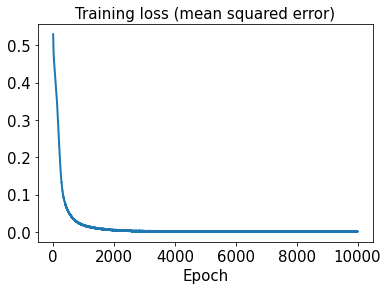

In [29]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

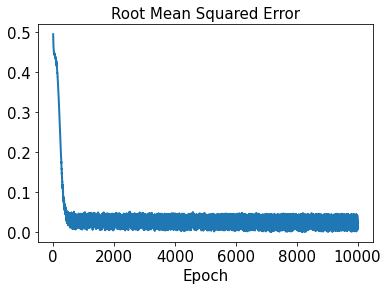

In [30]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [31]:
test_results1 = sd1.evaluate(x_test1)

1/1 [==============================] - 0s 110ms/step - loss: 3.5857e-06 - rmse: 0.0000e+00


In [32]:
decoded_sensor_train1 = sensor_pred1.predict(t_train)

In [33]:
error_train_sensor1 = np.abs(decoded_sensor_train1 - x_train1)

In [34]:
error_train_sensor1

array([[[9.07581493e-03],
        [1.81575258e-03],
        [7.50416380e-03],
        [6.57069546e-03],
        [1.93469365e-03],
        [8.13453838e-03],
        [2.92796035e-03],
        [6.98414307e-03],
        [5.63976031e-03],
        [2.15084989e-03],
        [7.42536232e-03],
        [4.72710920e-04],
        [6.51267033e-03],
        [7.24306565e-03],
        [2.17189033e-03],
        [6.55620739e-03]],

       [[5.73220054e-03],
        [1.26343689e-03],
        [4.41456658e-03],
        [4.08757549e-03],
        [1.24087654e-03],
        [5.48746387e-03],
        [1.05553589e-03],
        [4.26215750e-03],
        [3.84730917e-03],
        [1.14583693e-03],
        [5.03160754e-03],
        [1.02069698e-03],
        [3.72857672e-03],
        [3.92986160e-03],
        [1.17170535e-03],
        [4.80117599e-03]],

       [[2.03229641e-02],
        [3.27509911e-03],
        [1.65349796e-02],
        [1.40909210e-02],
        [3.48778339e-03],
        [1.80857634e-02],
        

In [35]:
l2_error_sensor_train1 = np.sqrt(np.sum((decoded_sensor_train1 - x_train1)**2) / np.sum(x_train1**2))
print(l2_error_sensor_train1)

0.01509264703206828


In [136]:
l2_error_sensor_test1 = np.sqrt(np.sum((decoded_sensor_test1 - x_test1)**2) / np.sum(x_test1**2))
print(l2_error_sensor_test1)

0.020305442308391763


In [36]:
decoded_sensor_test1 = sensor_pred1.predict(t_test)

In [37]:
decoded_train1 = sd1.predict(decoded_sensor_train1)

In [38]:
decoded_test1 = sd1.predict(decoded_sensor_test1)

In [39]:
error_train_abs1 = np.abs(decoded_train1 - y_train1)

In [40]:
error_test_abs1 = np.abs(decoded_test1 - y_test1)

In [41]:
l2_error_train1 = np.sqrt(np.sum((decoded_train1 - y_train1)**2) / np.sum(y_train1**2))
print(l2_error_train1)

0.020641944294030417


In [42]:
l2_error_test1 = np.sqrt(np.sum((decoded_test1 - y_test1)**2) / np.sum(y_test1**2))
print(l2_error_test1)

0.026716332415113564


In [43]:
l2_error_train_list1 = []
for i in range(0, len(x_train1)):
    l2_error_train_data1 = np.sqrt(np.sum((decoded_train1[i] - y_train1[i])**2) / np.sum(y_train1[i]**2))
    l2_error_train_list1.append(l2_error_train_data1)
print(l2_error_train_list1)

[0.03630049273391422, 0.00735212806131909, 0.04949140861771778, 0.010183332747347664, 0.006448712637237313, 0.011340150556697334, 0.0029063733033026784, 0.02682565511745864, 0.0018782154294352976, 0.02172494074737262, 0.022895854218430205, 0.015376927991273192, 0.04471925753249283, 0.005182003259535807, 0.0112201870364002, 0.01050339080504609, 0.032698362677065086, 0.035278446465520856, 0.006067017919044847, 0.02953185699050141, 0.0209344241714413, 0.0024578496627674453, 0.021120595025926503, 0.05594438849551259, 0.024605068841512746, 0.01159525360604742, 0.0450541597581497, 0.01218863554335355, 0.026575413373609115, 0.008959149787422767, 0.006012359470587332, 0.040315042741688394, 0.02096735223776188]


In [44]:
l2_error_test_list1 = []
for i in range(0, len(x_test1)):
    l2_error_test_data1 = np.sqrt(np.sum((decoded_test1[i] - y_test1[i])**2) / np.sum(y_test1[i]**2))
    l2_error_test_list1.append(l2_error_test_data1)
print(l2_error_test_list1)

[0.060056484685324193, 0.008454688067675502, 0.010487019867134207, 0.0546104408616947, 0.0023668148236969822, 0.02256455028521787, 0.018892393755800495, 0.021498808069050128]


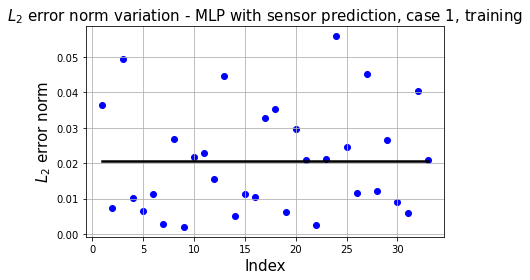

In [45]:
plt.plot(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train1*np.ones(x_train1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

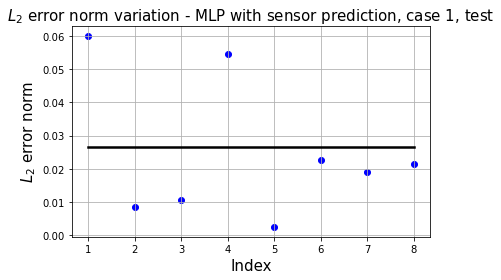

In [46]:
plt.plot(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test1*np.ones(x_test1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

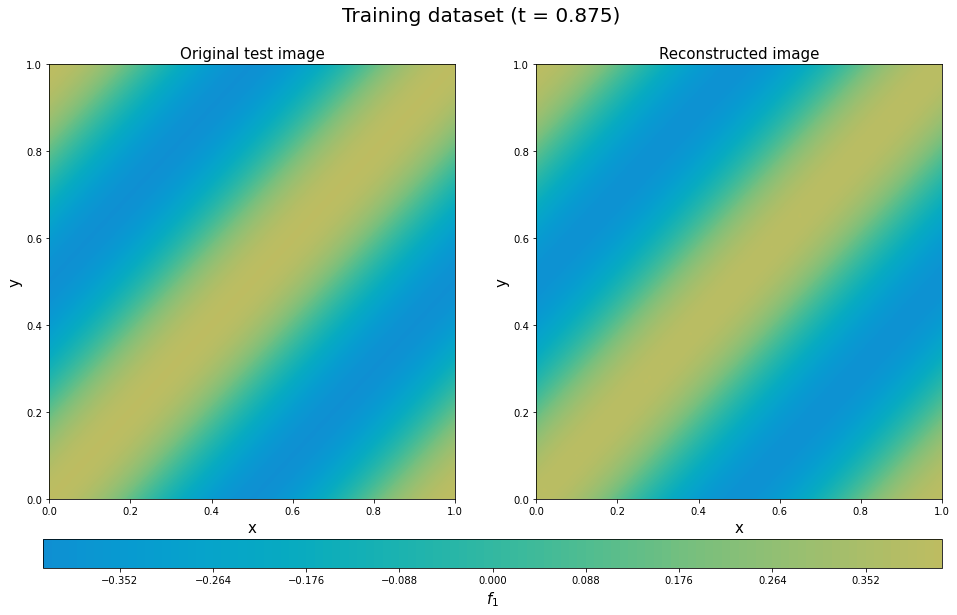

In [47]:
plt.figure(figsize=(16, 8))
y_train1_9_rotate = y_train1[9].T.reshape(101,101)
decoded_rotate1 = decoded_train1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_9_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[35]),fontsize=20)
plt.show()

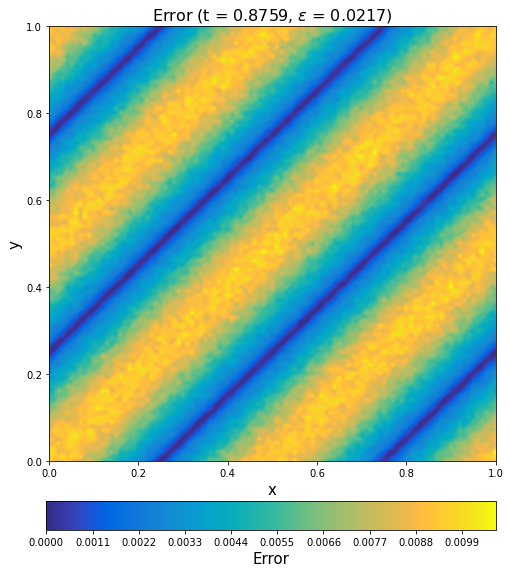

In [48]:
error_train_abs1_rotate9 = error_train_abs1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate9, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.8759, $\epsilon$ = %.4f)' %(l2_error_train_list1[9]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

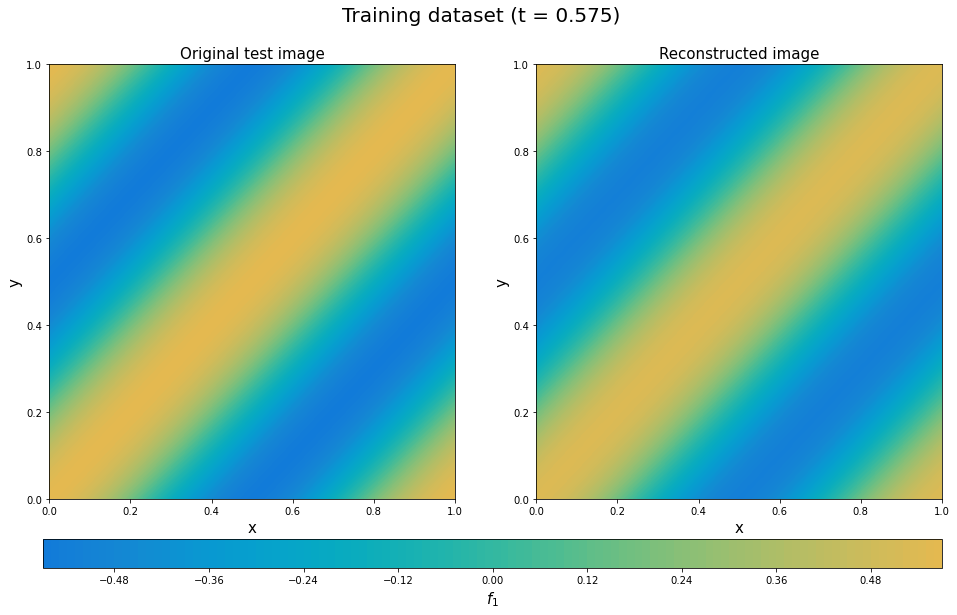

In [49]:
plt.figure(figsize=(16, 8))
y_train1_23_rotate = y_train1[23].T.reshape(101,101)
decoded_rotate1 = decoded_train1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_23_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[23]), fontsize=20)
plt.show()

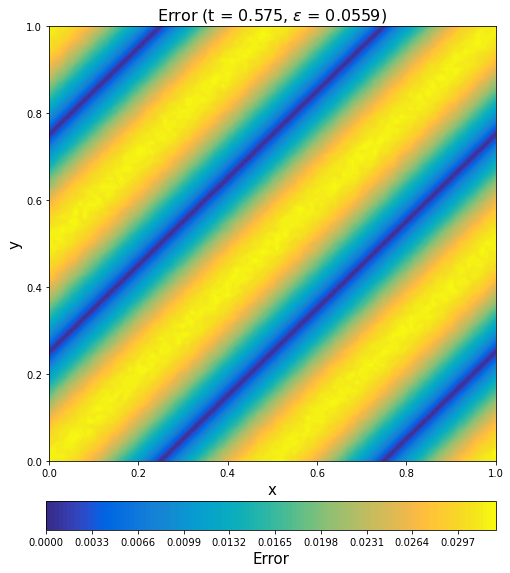

In [50]:
error_train_abs1_rotate23 = error_train_abs1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate23, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.575, $\epsilon$ = %.4f)' %(l2_error_train_list1[23]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

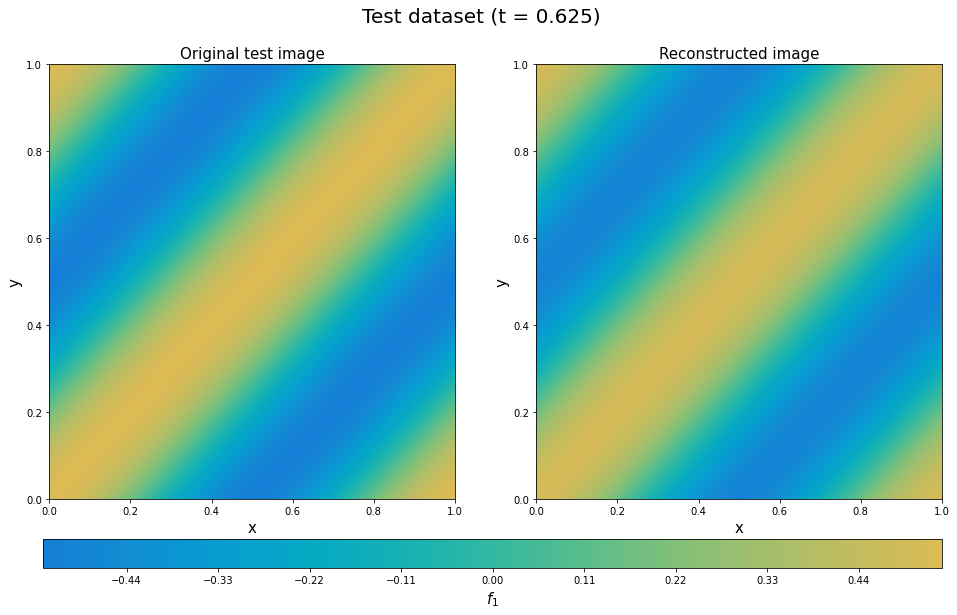

In [51]:
plt.figure(figsize=(16, 8))
y_test1_3_rotate = y_test1[3].T.reshape(101,101)
decoded_rotate1 = decoded_test1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_3_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[25]),fontsize=20)
plt.show()

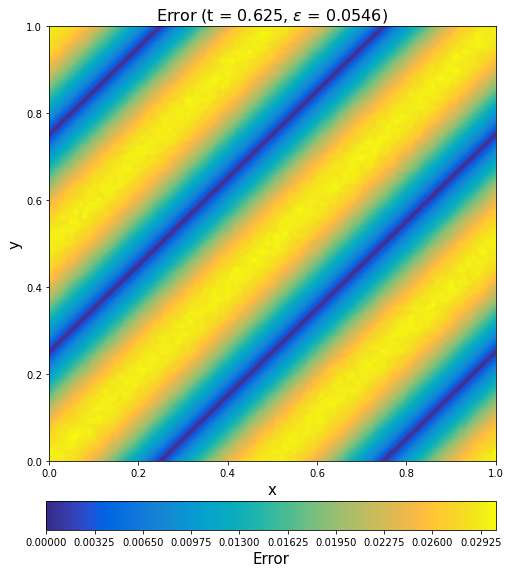

In [52]:
error_test_abs1_rotate3 = error_test_abs1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate3, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.625, $\epsilon$ = %.4f)' %(l2_error_test_list1[3]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

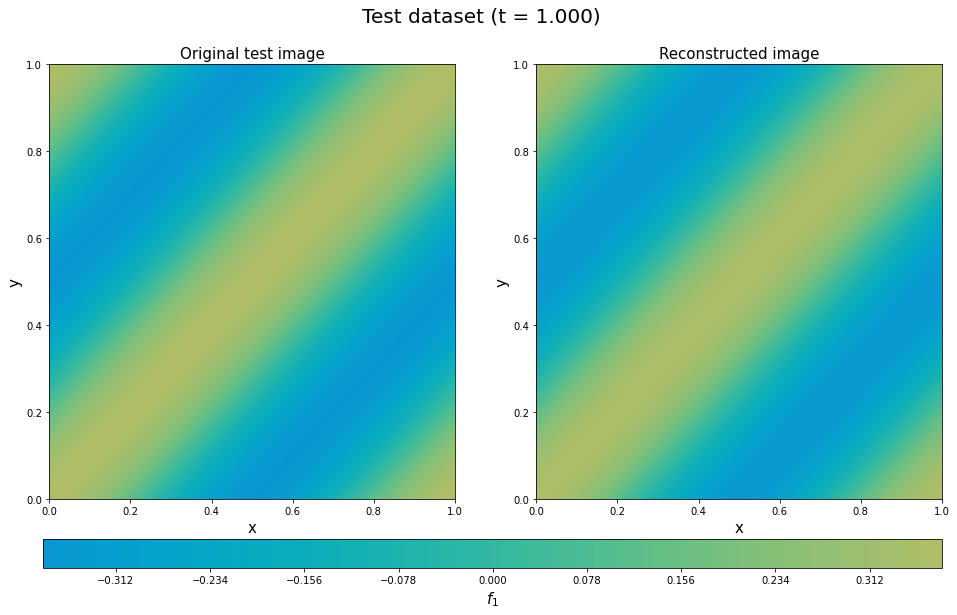

In [53]:
plt.figure(figsize=(16, 8))
y_test1_5_rotate = y_test1[5].T.reshape(101,101)
decoded_rotate1 = decoded_test1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_5_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[40]),fontsize=20)
plt.show()

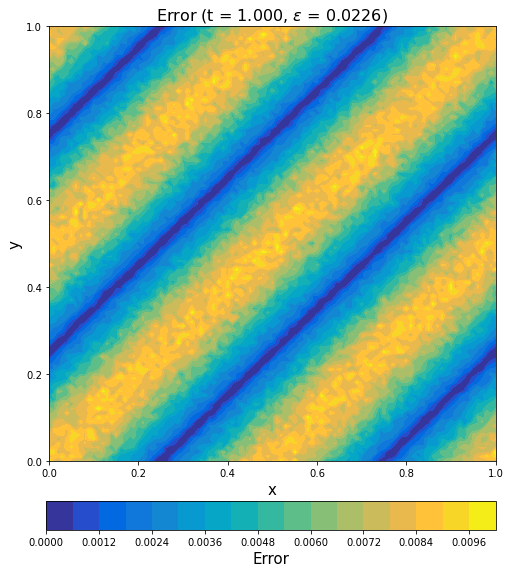

In [54]:
error_test_abs1_rotate5 = error_test_abs1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate5, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 1.000, $\epsilon$ = %.4f)' %(l2_error_test_list1[5]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 2: f2

In [55]:
out2 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out2[i, j, k] = x[j] + y[k] + t[i]

In [56]:
sensor2 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor2[i, j, k] = out2[i, 20*(j+1)+1, 20*(k+1)+1]

In [57]:
sensor2 = sensor2.reshape((41, 16, 1))

In [58]:
sensor2.shape

(41, 16, 1)

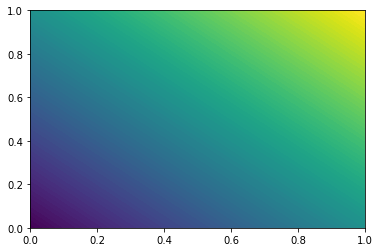

In [59]:
plt.contourf(xmesh, ymesh, out2[0,:,:], levels=128)

In [60]:
x_train2, x_test2, y_train2, y_test2, t_train, t_test = train_test_split(sensor2, out2, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [61]:
x_train2

array([[[1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945],
        [1.545],
        [1.745],
        [1.945],
        [2.145],
        [1.745],
        [1.945],
        [2.145],
        [2.345]],

       [[0.57 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.77 ]],

       [[1.07 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [2.27 ]],

       [[0.72 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [1.52 ],
        [1.12 ],
        [1.32 ],
        

In [62]:
x_test2

array([[[1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [2.22 ]],

       [[0.745],
        [0.945],
        [1.145],
        [1.345],
        [0.945],
        [1.145],
        [1.345],
        [1.545],
        [1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945]],

       [[0.62 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ]],

       [[1.045],
        [1.245],
        [1.445],
        [1.645],
        [1.245],
        [1.445],
        [1.645],
        [1.845],
        [1.445],
        [1.645],
        

In [63]:
sensor_pred2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [64]:
start2 = datetime.datetime.now()
history2 = sensor_pred2.fit(t_train, x_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.5873 - rmse: 1.6085
Epoch 2/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.5851 - rmse: 1.6078
Epoch 3/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.5830 - rmse: 1.6072
Epoch 4/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5809 - rmse: 1.6065
Epoch 5/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.5788 - rmse: 1.6059
Epoch 6/10000
2/2 [==============================] - 0s 22ms/step - loss: 2.5767 - rmse: 1.6052
Epoch 7/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.5746 - rmse: 1.6046
Epoch 8/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.5725 - rmse: 1.6039
Epoch 9/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.5705 - rmse: 1.6033
Epoch 10/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.5684 - rmse: 1.6026
Epoch 11/10000
2/2 [========================

2/2 [==============================] - 0s 3ms/step - loss: 2.4312 - rmse: 1.5592
Epoch 87/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.4297 - rmse: 1.5588
Epoch 88/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.4282 - rmse: 1.5583
Epoch 89/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.4268 - rmse: 1.5578
Epoch 90/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.4254 - rmse: 1.5574
Epoch 91/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.4240 - rmse: 1.5569
Epoch 92/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.4226 - rmse: 1.5565
Epoch 93/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.4212 - rmse: 1.5560
Epoch 94/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.4198 - rmse: 1.5556
Epoch 95/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.4185 - rmse: 1.5551
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 3ms/step - loss: 2.3181 - rmse: 1.5225
Epoch 171/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3168 - rmse: 1.5221
Epoch 172/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3155 - rmse: 1.5217
Epoch 173/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3142 - rmse: 1.5213
Epoch 174/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3129 - rmse: 1.5208
Epoch 175/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3116 - rmse: 1.5204
Epoch 176/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.3103 - rmse: 1.5200
Epoch 177/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.3090 - rmse: 1.5195
Epoch 178/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3077 - rmse: 1.5191
Epoch 179/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.3064 - rmse: 1.5187
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 2.2062 - rmse: 1.4853
Epoch 255/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.2048 - rmse: 1.4849
Epoch 256/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.2034 - rmse: 1.4844
Epoch 257/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.2020 - rmse: 1.4839
Epoch 258/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.2006 - rmse: 1.4834
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1992 - rmse: 1.4830
Epoch 260/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.1978 - rmse: 1.4825
Epoch 261/10000
2/2 [==============================] - 0s 5ms/step - loss: 2.1964 - rmse: 1.4820
Epoch 262/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.1950 - rmse: 1.4816
Epoch 263/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.1937 - rmse: 1.4811
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 2.0784 - rmse: 1.4417
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0768 - rmse: 1.4411
Epoch 340/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.0752 - rmse: 1.4405
Epoch 341/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0735 - rmse: 1.4400
Epoch 342/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0719 - rmse: 1.4394
Epoch 343/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0702 - rmse: 1.4388
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0685 - rmse: 1.4382
Epoch 345/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0668 - rmse: 1.4376
Epoch 346/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0651 - rmse: 1.4371
Epoch 347/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.0634 - rmse: 1.4365
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 1.9307 - rmse: 1.3895
Epoch 423/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9288 - rmse: 1.3888
Epoch 424/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9269 - rmse: 1.3881
Epoch 425/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9250 - rmse: 1.3874
Epoch 426/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9231 - rmse: 1.3867
Epoch 427/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9211 - rmse: 1.3860
Epoch 428/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9191 - rmse: 1.3853
Epoch 429/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9171 - rmse: 1.3846
Epoch 430/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9152 - rmse: 1.3839
Epoch 431/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9133 - rmse: 1.3832
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 1.7609 - rmse: 1.3270
Epoch 507/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7587 - rmse: 1.3262
Epoch 508/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7566 - rmse: 1.3254
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7544 - rmse: 1.3245
Epoch 510/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7523 - rmse: 1.3237
Epoch 511/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7502 - rmse: 1.3229
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7480 - rmse: 1.3221
Epoch 513/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7457 - rmse: 1.3212
Epoch 514/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7433 - rmse: 1.3204
Epoch 515/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7410 - rmse: 1.3195
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 1.5659 - rmse: 1.2514
Epoch 591/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5635 - rmse: 1.2504
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5611 - rmse: 1.2494
Epoch 593/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5588 - rmse: 1.2485
Epoch 594/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5564 - rmse: 1.2476
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5541 - rmse: 1.2466
Epoch 596/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5518 - rmse: 1.2457
Epoch 597/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5496 - rmse: 1.2448
Epoch 598/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5473 - rmse: 1.2439
Epoch 599/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5451 - rmse: 1.2430
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 1.3602 - rmse: 1.1663
Epoch 675/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3575 - rmse: 1.1651
Epoch 676/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3547 - rmse: 1.1639
Epoch 677/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3521 - rmse: 1.1628
Epoch 678/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3495 - rmse: 1.1617
Epoch 679/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3470 - rmse: 1.1606
Epoch 680/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3445 - rmse: 1.1595
Epoch 681/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3421 - rmse: 1.1585
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3398 - rmse: 1.1575
Epoch 683/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.3374 - rmse: 1.1564
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 1.1386 - rmse: 1.0671
Epoch 759/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.1356 - rmse: 1.0656
Epoch 760/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1326 - rmse: 1.0643
Epoch 761/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1296 - rmse: 1.0628
Epoch 762/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1267 - rmse: 1.0615
Epoch 763/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1239 - rmse: 1.0602
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1212 - rmse: 1.0589
Epoch 765/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.1185 - rmse: 1.0576
Epoch 766/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.1158 - rmse: 1.0563
Epoch 767/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1131 - rmse: 1.0550
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 0.9183 - rmse: 0.9583
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.9159 - rmse: 0.9570
Epoch 844/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.9135 - rmse: 0.9558
Epoch 845/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.9112 - rmse: 0.9545
Epoch 846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.9089 - rmse: 0.9534
Epoch 847/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.9067 - rmse: 0.9522
Epoch 848/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.9046 - rmse: 0.9511
Epoch 849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.9025 - rmse: 0.9500
Epoch 850/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.9003 - rmse: 0.9489
Epoch 851/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8982 - rmse: 0.9477
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 0.7249 - rmse: 0.8514
Epoch 927/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7228 - rmse: 0.8502
Epoch 928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7206 - rmse: 0.8489
Epoch 929/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7183 - rmse: 0.8475
Epoch 930/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.7161 - rmse: 0.8462
Epoch 931/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7139 - rmse: 0.8449
Epoch 932/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.7117 - rmse: 0.8436
Epoch 933/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7095 - rmse: 0.8423
Epoch 934/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7074 - rmse: 0.8411
Epoch 935/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7054 - rmse: 0.8399
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.5486 - rmse: 0.7407
Epoch 1011/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.5466 - rmse: 0.7393
Epoch 1012/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.5446 - rmse: 0.7379
Epoch 1013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5425 - rmse: 0.7366
Epoch 1014/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.5405 - rmse: 0.7352
Epoch 1015/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.5385 - rmse: 0.7338
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5365 - rmse: 0.7325
Epoch 1017/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.5346 - rmse: 0.7312
Epoch 1018/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.5328 - rmse: 0.7299
Epoch 1019/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5309 - rmse: 0.7286
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.3994 - rmse: 0.6320
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3979 - rmse: 0.6308
Epoch 1095/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3964 - rmse: 0.6296
Epoch 1096/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.3949 - rmse: 0.6284
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3934 - rmse: 0.6272
Epoch 1098/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3918 - rmse: 0.6260
Epoch 1099/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3902 - rmse: 0.6247
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3885 - rmse: 0.6233
Epoch 1101/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3868 - rmse: 0.6219
Epoch 1102/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3850 - rmse: 0.6205
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.2834 - rmse: 0.5324
Epoch 1177/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2823 - rmse: 0.5313
Epoch 1178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2811 - rmse: 0.5302
Epoch 1179/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2800 - rmse: 0.5291
Epoch 1180/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2789 - rmse: 0.5281
Epoch 1181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2778 - rmse: 0.5271
Epoch 1182/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2768 - rmse: 0.5261
Epoch 1183/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2757 - rmse: 0.5251
Epoch 1184/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2747 - rmse: 0.5241
Epoch 1185/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2737 - rmse: 0.5232
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.2020 - rmse: 0.4494
Epoch 1260/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2012 - rmse: 0.4486
Epoch 1261/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2004 - rmse: 0.4477
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1996 - rmse: 0.4468
Epoch 1263/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1988 - rmse: 0.4459
Epoch 1264/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1980 - rmse: 0.4450
Epoch 1265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1972 - rmse: 0.4441
Epoch 1266/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1964 - rmse: 0.4432
Epoch 1267/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1956 - rmse: 0.4423
Epoch 1268/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1949 - rmse: 0.4414
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1452 - rmse: 0.3811
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1446 - rmse: 0.3803
Epoch 1344/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1440 - rmse: 0.3795
Epoch 1345/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1435 - rmse: 0.3787
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1429 - rmse: 0.3780
Epoch 1347/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1423 - rmse: 0.3772
Epoch 1348/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1417 - rmse: 0.3765
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1412 - rmse: 0.3757
Epoch 1350/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1406 - rmse: 0.3749
Epoch 1351/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1400 - rmse: 0.3741
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.1068 - rmse: 0.3268
Epoch 1426/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1064 - rmse: 0.3262
Epoch 1427/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1060 - rmse: 0.3255
Epoch 1428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1056 - rmse: 0.3249
Epoch 1429/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1051 - rmse: 0.3242
Epoch 1430/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1047 - rmse: 0.3236
Epoch 1431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1043 - rmse: 0.3230
Epoch 1432/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1039 - rmse: 0.3224
Epoch 1433/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1035 - rmse: 0.3218
Epoch 1434/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1032 - rmse: 0.3212
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0797 - rmse: 0.2823
Epoch 1509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0794 - rmse: 0.2817
Epoch 1510/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0791 - rmse: 0.2813
Epoch 1511/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0788 - rmse: 0.2808
Epoch 1512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0786 - rmse: 0.2803
Epoch 1513/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0783 - rmse: 0.2799
Epoch 1514/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0781 - rmse: 0.2794
Epoch 1515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0778 - rmse: 0.2789
Epoch 1516/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0776 - rmse: 0.2785
Epoch 1517/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0773 - rmse: 0.2780
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0601 - rmse: 0.2452
Epoch 1592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0599 - rmse: 0.2447
Epoch 1593/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0597 - rmse: 0.2443
Epoch 1594/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0595 - rmse: 0.2439
Epoch 1595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0593 - rmse: 0.2434
Epoch 1596/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0591 - rmse: 0.2430
Epoch 1597/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0589 - rmse: 0.2426
Epoch 1598/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0587 - rmse: 0.2422
Epoch 1599/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0585 - rmse: 0.2418
Epoch 1600/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0582 - rmse: 0.2413
Epoch 1601/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0455 - rmse: 0.2134
Epoch 1675/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0454 - rmse: 0.2131
Epoch 1676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0453 - rmse: 0.2128
Epoch 1677/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0451 - rmse: 0.2125
Epoch 1678/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0450 - rmse: 0.2122
Epoch 1679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0449 - rmse: 0.2119
Epoch 1680/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0447 - rmse: 0.2115
Epoch 1681/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0446 - rmse: 0.2112
Epoch 1682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0445 - rmse: 0.2109
Epoch 1683/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0443 - rmse: 0.2106
Epoch 1684/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0360 - rmse: 0.1897
Epoch 1758/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0359 - rmse: 0.1895
Epoch 1759/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0358 - rmse: 0.1892
Epoch 1760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0357 - rmse: 0.1890
Epoch 1761/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0356 - rmse: 0.1887
Epoch 1762/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0355 - rmse: 0.1885
Epoch 1763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0354 - rmse: 0.1883
Epoch 1764/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0353 - rmse: 0.1880
Epoch 1765/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0353 - rmse: 0.1878
Epoch 1766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0352 - rmse: 0.1875
Epoch 1767/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0294 - rmse: 0.1715
Epoch 1841/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0293 - rmse: 0.1713
Epoch 1842/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0293 - rmse: 0.1711
Epoch 1843/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0292 - rmse: 0.1709
Epoch 1844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0292 - rmse: 0.1707
Epoch 1845/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0291 - rmse: 0.1706
Epoch 1846/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0290 - rmse: 0.1704
Epoch 1847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0290 - rmse: 0.1702
Epoch 1848/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0289 - rmse: 0.1700
Epoch 1849/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0288 - rmse: 0.1698
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0250 - rmse: 0.1581
Epoch 1924/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0249 - rmse: 0.1579
Epoch 1925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0249 - rmse: 0.1578
Epoch 1926/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0249 - rmse: 0.1577
Epoch 1927/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0248 - rmse: 0.1576
Epoch 1928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0248 - rmse: 0.1574
Epoch 1929/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0247 - rmse: 0.1573
Epoch 1930/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0247 - rmse: 0.1572
Epoch 1931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0247 - rmse: 0.1571
Epoch 1932/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0246 - rmse: 0.1570
Epoch 1933/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0219 - rmse: 0.1479
Epoch 2007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0219 - rmse: 0.1478
Epoch 2008/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0218 - rmse: 0.1477
Epoch 2009/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0218 - rmse: 0.1476
Epoch 2010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0217 - rmse: 0.1475
Epoch 2011/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0217 - rmse: 0.1473
Epoch 2012/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0217 - rmse: 0.1472
Epoch 2013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0216 - rmse: 0.1471
Epoch 2014/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0216 - rmse: 0.1470
Epoch 2015/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0216 - rmse: 0.1469
Epoch 2016/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0198 - rmse: 0.1407
Epoch 2090/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0198 - rmse: 0.1407
Epoch 2091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0198 - rmse: 0.1406
Epoch 2092/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0198 - rmse: 0.1406
Epoch 2093/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0197 - rmse: 0.1405
Epoch 2094/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0197 - rmse: 0.1405
Epoch 2095/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0197 - rmse: 0.1404
Epoch 2096/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0197 - rmse: 0.1403
Epoch 2097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0197 - rmse: 0.1403
Epoch 2098/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0197 - rmse: 0.1402
Epoch 2099/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0184 - rmse: 0.1355
Epoch 2173/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0183 - rmse: 0.1354
Epoch 2174/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0183 - rmse: 0.1354
Epoch 2175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0183 - rmse: 0.1354
Epoch 2176/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0183 - rmse: 0.1353
Epoch 2177/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0183 - rmse: 0.1353
Epoch 2178/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0183 - rmse: 0.1352
Epoch 2179/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0183 - rmse: 0.1352
Epoch 2180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0183 - rmse: 0.1351
Epoch 2181/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0182 - rmse: 0.1351
Epoch 2182/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0172 - rmse: 0.1311
Epoch 2256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0172 - rmse: 0.1310
Epoch 2257/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0172 - rmse: 0.1310
Epoch 2258/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0171 - rmse: 0.1309
Epoch 2259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0171 - rmse: 0.1309
Epoch 2260/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0171 - rmse: 0.1308
Epoch 2261/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0171 - rmse: 0.1308
Epoch 2262/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0171 - rmse: 0.1307
Epoch 2263/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0171 - rmse: 0.1307
Epoch 2264/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0171 - rmse: 0.1306
Epoch 2265/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0163 - rmse: 0.1276
Epoch 2339/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0163 - rmse: 0.1275
Epoch 2340/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0163 - rmse: 0.1275
Epoch 2341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0162 - rmse: 0.1274
Epoch 2342/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0162 - rmse: 0.1274
Epoch 2343/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0162 - rmse: 0.1273
Epoch 2344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0162 - rmse: 0.1273
Epoch 2345/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0162 - rmse: 0.1273
Epoch 2346/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0162 - rmse: 0.1272
Epoch 2347/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0162 - rmse: 0.1272
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0155 - rmse: 0.1247
Epoch 2422/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0155 - rmse: 0.1247
Epoch 2423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0155 - rmse: 0.1246
Epoch 2424/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0155 - rmse: 0.1246
Epoch 2425/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0155 - rmse: 0.1246
Epoch 2426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0155 - rmse: 0.1245
Epoch 2427/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0155 - rmse: 0.1245
Epoch 2428/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0155 - rmse: 0.1245
Epoch 2429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0155 - rmse: 0.1244
Epoch 2430/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0155 - rmse: 0.1244
Epoch 2431/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0150 - rmse: 0.1223
Epoch 2505/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0150 - rmse: 0.1223
Epoch 2506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0149 - rmse: 0.1223
Epoch 2507/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0149 - rmse: 0.1222
Epoch 2508/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0149 - rmse: 0.1222
Epoch 2509/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0149 - rmse: 0.1222
Epoch 2510/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0149 - rmse: 0.1221
Epoch 2511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0149 - rmse: 0.1221
Epoch 2512/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0149 - rmse: 0.1221
Epoch 2513/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0149 - rmse: 0.1221
Epoch 2514/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0144 - rmse: 0.1199
Epoch 2588/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0144 - rmse: 0.1199
Epoch 2589/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0144 - rmse: 0.1199
Epoch 2590/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0144 - rmse: 0.1199
Epoch 2591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0144 - rmse: 0.1198
Epoch 2592/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0144 - rmse: 0.1198
Epoch 2593/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0143 - rmse: 0.1198
Epoch 2594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0143 - rmse: 0.1198
Epoch 2595/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0143 - rmse: 0.1197
Epoch 2596/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0143 - rmse: 0.1197
Epoch 2597/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0139 - rmse: 0.1179
Epoch 2671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0139 - rmse: 0.1178
Epoch 2672/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0139 - rmse: 0.1178
Epoch 2673/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0139 - rmse: 0.1178
Epoch 2674/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0139 - rmse: 0.1177
Epoch 2675/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0139 - rmse: 0.1177
Epoch 2676/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0138 - rmse: 0.1176
Epoch 2677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0138 - rmse: 0.1176
Epoch 2678/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0138 - rmse: 0.1176
Epoch 2679/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0138 - rmse: 0.1175
Epoch 2680/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0133 - rmse: 0.1155
Epoch 2754/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0133 - rmse: 0.1155
Epoch 2755/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0133 - rmse: 0.1154
Epoch 2756/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0133 - rmse: 0.1154
Epoch 2757/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0133 - rmse: 0.1154
Epoch 2758/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0133 - rmse: 0.1153
Epoch 2759/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0133 - rmse: 0.1153
Epoch 2760/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0133 - rmse: 0.1153
Epoch 2761/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0133 - rmse: 0.1153
Epoch 2762/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0133 - rmse: 0.1153
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0129 - rmse: 0.1135
Epoch 2837/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0129 - rmse: 0.1135
Epoch 2838/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0129 - rmse: 0.1135
Epoch 2839/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0129 - rmse: 0.1134
Epoch 2840/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0129 - rmse: 0.1134
Epoch 2841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0129 - rmse: 0.1134
Epoch 2842/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0129 - rmse: 0.1134
Epoch 2843/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0129 - rmse: 0.1134
Epoch 2844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0128 - rmse: 0.1133
Epoch 2845/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0128 - rmse: 0.1133
Epoch 2846/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0124 - rmse: 0.1113
Epoch 2920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0124 - rmse: 0.1113
Epoch 2921/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0124 - rmse: 0.1113
Epoch 2922/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0124 - rmse: 0.1112
Epoch 2923/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0124 - rmse: 0.1112
Epoch 2924/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0124 - rmse: 0.1112
Epoch 2925/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0124 - rmse: 0.1112
Epoch 2926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0124 - rmse: 0.1111
Epoch 2927/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0123 - rmse: 0.1111
Epoch 2928/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0123 - rmse: 0.1111
Epoch 2929/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0119 - rmse: 0.1092
Epoch 3003/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0119 - rmse: 0.1092
Epoch 3004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.1091
Epoch 3005/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0119 - rmse: 0.1091
Epoch 3006/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0119 - rmse: 0.1091
Epoch 3007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.1090
Epoch 3008/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0119 - rmse: 0.1090
Epoch 3009/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0119 - rmse: 0.1090
Epoch 3010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0119 - rmse: 0.1089
Epoch 3011/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0119 - rmse: 0.1089
Epoch 3012/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0115 - rmse: 0.1071
Epoch 3086/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0115 - rmse: 0.1071
Epoch 3087/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0115 - rmse: 0.1070
Epoch 3088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0115 - rmse: 0.1070
Epoch 3089/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0115 - rmse: 0.1070
Epoch 3090/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0115 - rmse: 0.1070
Epoch 3091/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0114 - rmse: 0.1070
Epoch 3092/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0114 - rmse: 0.1069
Epoch 3093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0114 - rmse: 0.1069
Epoch 3094/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0114 - rmse: 0.1068
Epoch 3095/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0109 - rmse: 0.1046
Epoch 3169/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0109 - rmse: 0.1045
Epoch 3170/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0109 - rmse: 0.1045
Epoch 3171/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0109 - rmse: 0.1045
Epoch 3172/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0109 - rmse: 0.1044
Epoch 3173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0109 - rmse: 0.1044
Epoch 3174/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0109 - rmse: 0.1044
Epoch 3175/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0109 - rmse: 0.1043
Epoch 3176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0109 - rmse: 0.1043
Epoch 3177/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0109 - rmse: 0.1043
Epoch 3178/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0105 - rmse: 0.1023
Epoch 3252/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0105 - rmse: 0.1023
Epoch 3253/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0105 - rmse: 0.1022
Epoch 3254/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0105 - rmse: 0.1022
Epoch 3255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0105 - rmse: 0.1022
Epoch 3256/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0104 - rmse: 0.1022
Epoch 3257/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0104 - rmse: 0.1022
Epoch 3258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0104 - rmse: 0.1022
Epoch 3259/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0104 - rmse: 0.1022
Epoch 3260/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0104 - rmse: 0.1022
Epoch 3261/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0100 - rmse: 0.1000
Epoch 3335/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0100 - rmse: 0.0999
Epoch 3336/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0999
Epoch 3337/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0100 - rmse: 0.0999
Epoch 3338/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0100 - rmse: 0.0998
Epoch 3339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0100 - rmse: 0.0998
Epoch 3340/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0100 - rmse: 0.0998
Epoch 3341/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0099 - rmse: 0.0997
Epoch 3342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0997
Epoch 3343/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0099 - rmse: 0.0997
Epoch 3344/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 3418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 3419/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0096 - rmse: 0.0978
Epoch 3420/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0096 - rmse: 0.0977
Epoch 3421/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0977
Epoch 3422/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0095 - rmse: 0.0977
Epoch 3423/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0095 - rmse: 0.0977
Epoch 3424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0976
Epoch 3425/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0095 - rmse: 0.0976
Epoch 3426/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0095 - rmse: 0.0976
Epoch 3427/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0954
Epoch 3501/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0091 - rmse: 0.0954
Epoch 3502/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0091 - rmse: 0.0954
Epoch 3503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0954
Epoch 3504/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 3505/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 3506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 3507/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 3508/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 3509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0091 - rmse: 0.0952
Epoch 3510/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 3584/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 3585/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 3586/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 3587/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 3588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 3589/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 3590/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 3591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 3592/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 3593/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 3667/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 3668/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3670/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3671/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3672/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3673/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3674/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3675/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3676/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 3750/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 3751/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 3752/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 3753/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 3754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 3755/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 3756/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0079 - rmse: 0.0886
Epoch 3757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0886
Epoch 3758/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0078 - rmse: 0.0886
Epoch 3759/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 3833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 3834/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 3835/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 3836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 3837/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 3838/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 3839/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 3840/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0075 - rmse: 0.0864
Epoch 3841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0864
Epoch 3842/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0072 - rmse: 0.0849
Epoch 3916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 3917/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 3918/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 3919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 3920/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 3921/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 3922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 3923/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 3924/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 3925/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 3999/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 4000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 4001/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 4002/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 4003/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 4004/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 4005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 4006/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 4007/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 4008/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0065 - rmse: 0.0809
Epoch 4082/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 4083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 4084/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 4085/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 4086/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 4087/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 4088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 4089/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 4090/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 4091/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 4165/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 4166/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 4167/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 4168/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 4169/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 4170/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 4171/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 4172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 4173/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 4174/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4249/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4250/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4252/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4253/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 4254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0771
Epoch 4255/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 4256/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 4257/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 4331/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4332/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4334/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4335/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4336/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4337/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4338/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 4339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 4340/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 4414/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 4415/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 4416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 4417/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 4418/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 4419/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 4420/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 4421/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 4422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 4423/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0710
Epoch 4497/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0050 - rmse: 0.0710
Epoch 4498/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0050 - rmse: 0.0710
Epoch 4499/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 4500/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 4501/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 4502/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0050 - rmse: 0.0708
Epoch 4503/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0050 - rmse: 0.0708
Epoch 4504/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0708
Epoch 4505/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0050 - rmse: 0.0707
Epoch 4506/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 4580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 4581/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 4582/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 4583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 4584/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 4585/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 4586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 4587/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 4588/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 4589/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 4663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 4664/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 4665/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 4666/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 4667/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 4668/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 4669/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 4670/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 4671/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 4672/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 4746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 4747/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 4748/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 4749/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 4750/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 4751/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 4752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 4753/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 4754/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 4755/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 4829/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4831/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4832/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4833/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4834/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4835/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4836/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 4837/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 4838/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0628
Epoch 4912/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 4913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 4914/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 4915/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 4916/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 4917/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 4918/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 4919/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 4920/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 4921/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 4995/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 4996/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 4997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 4998/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 4999/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 5000/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 5001/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 5002/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0612
Epoch 5003/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0037 - rmse: 0.0612
Epoch 5004/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5078/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5079/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5080/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5081/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5083/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5084/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5086/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 5087/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 5161/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 5162/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 5163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 5164/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 5165/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 5166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5167/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5168/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5170/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0032 - rmse: 0.0570
Epoch 5244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0570
Epoch 5245/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 5246/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 5247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 5248/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 5249/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 5250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 5251/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 5252/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 5253/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5328/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5329/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5331/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5332/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5333/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5334/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5335/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5336/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 5410/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 5411/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 5412/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5413/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5414/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5415/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5416/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 5417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 5418/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 5419/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0534
Epoch 5493/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5494/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5496/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5497/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5498/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5499/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 5500/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 5501/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5502/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 5576/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 5577/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 5578/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 5579/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 5580/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 5581/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 5582/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 5583/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 5584/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 5585/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0514
Epoch 5659/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0514
Epoch 5661/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5662/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5664/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5665/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 5667/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 5668/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 5742/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 5743/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5744/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5745/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5746/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5747/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5748/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5749/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5750/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 5751/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 5825/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 5826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 5827/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 5828/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 5829/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 5830/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 5831/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 5832/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 5833/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 5834/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5908/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5909/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5910/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5911/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5912/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5913/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 5914/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 5915/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5916/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5917/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 5991/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 5992/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 5993/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 5994/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5995/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5996/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5997/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5998/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 5999/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 6000/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0464
Epoch 6074/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6075/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6076/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6077/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6078/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6079/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6081/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 6082/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 6083/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 6157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6158/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6159/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6161/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6162/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6163/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6164/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6165/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6166/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6240/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6241/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6242/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6243/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6244/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6245/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6246/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 6247/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 6248/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 6249/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 6323/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 6324/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 6325/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 6326/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 6327/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 6328/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 6329/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 6330/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 6331/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 6332/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 6406/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6408/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6409/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6410/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6411/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6412/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6413/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6414/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6415/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6489/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6490/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6492/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6493/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6494/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6495/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6496/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6497/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 6498/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6572/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6573/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6574/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6575/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6576/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6577/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6578/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6579/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6580/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6581/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6655/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6656/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6657/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6658/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6660/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6661/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 6662/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 6663/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 6664/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6738/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6739/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6741/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6742/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6743/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6744/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6746/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6747/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6821/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6823/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6824/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6826/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6827/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6828/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6829/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 6830/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 6904/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 6905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 6906/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6907/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6908/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6909/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6910/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6911/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6912/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 6913/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6987/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6989/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6990/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6991/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6992/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6993/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6994/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6995/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6996/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 7070/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 7071/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 7072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 7073/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 7074/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7075/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7076/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7077/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7079/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7154/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7155/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7156/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7157/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7158/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 7159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 7160/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 7161/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 7162/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 7236/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 7237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 7238/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 7239/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7240/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7241/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7242/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7243/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 7244/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 7245/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7319/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7320/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7321/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7323/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7324/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7325/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7326/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7327/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7328/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7402/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7403/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7404/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7405/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7407/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 7408/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 7409/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 7410/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 7411/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7485/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7486/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7487/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7488/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7489/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7490/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7491/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7492/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7493/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7494/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7568/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7569/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7570/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7571/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7572/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7573/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7574/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7575/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7576/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0338
Epoch 7577/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7651/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7652/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7653/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7654/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7655/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7656/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7657/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7658/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 7659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 7660/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 7734/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 7735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 7736/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 7737/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 7738/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7739/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7740/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7741/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7742/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 7743/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 7817/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 7818/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 7819/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 7820/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 7821/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 7822/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 7823/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 7824/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 7825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 7826/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 9.9241e-04 - rmse: 0.0315
Epoch 7900/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9283e-04 - rmse: 0.0315
Epoch 7901/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.9387e-04 - rmse: 0.0315
Epoch 7902/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.9413e-04 - rmse: 0.0315
Epoch 7903/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.9362e-04 - rmse: 0.0315
Epoch 7904/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.9287e-04 - rmse: 0.0315
Epoch 7905/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.9205e-04 - rmse: 0.0315
Epoch 7906/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.9202e-04 - rmse: 0.0315
Epoch 7907/10000
2/2 [==============================] - 0s 5ms/step - loss: 9.9223e-04 - rmse: 0.0315
Epoch 7908/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9201e-04 - rmse: 0.03

2/2 [==============================] - 0s 4ms/step - loss: 9.6834e-04 - rmse: 0.0311
Epoch 7980/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6713e-04 - rmse: 0.0311
Epoch 7981/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6639e-04 - rmse: 0.0311
Epoch 7982/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6579e-04 - rmse: 0.0311
Epoch 7983/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6606e-04 - rmse: 0.0311
Epoch 7984/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6645e-04 - rmse: 0.0311
Epoch 7985/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6605e-04 - rmse: 0.0311
Epoch 7986/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6527e-04 - rmse: 0.0311
Epoch 7987/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.6404e-04 - rmse: 0.0310
Epoch 7988/10000
2/2 [==============================] - 0s 5ms/step - loss: 9.6252e-04 - rmse: 0.03

2/2 [==============================] - 0s 5ms/step - loss: 9.2395e-04 - rmse: 0.0304
Epoch 8060/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2375e-04 - rmse: 0.0304
Epoch 8061/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.2355e-04 - rmse: 0.0304
Epoch 8062/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.2353e-04 - rmse: 0.0304
Epoch 8063/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.2418e-04 - rmse: 0.0304
Epoch 8064/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.2476e-04 - rmse: 0.0304
Epoch 8065/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2505e-04 - rmse: 0.0304
Epoch 8066/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.2582e-04 - rmse: 0.0304
Epoch 8067/10000
2/2 [==============================] - 0s 4ms/step - loss: 9.2580e-04 - rmse: 0.0304
Epoch 8068/10000
2/2 [==============================] - 0s 3ms/step - loss: 9.2499e-04 - rmse: 0.03

2/2 [==============================] - 0s 3ms/step - loss: 9.0040e-04 - rmse: 0.0300
Epoch 8140/10000
2/2 [==============================] - 0s 5ms/step - loss: 8.9949e-04 - rmse: 0.0300
Epoch 8141/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9818e-04 - rmse: 0.0300
Epoch 8142/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.9639e-04 - rmse: 0.0299
Epoch 8143/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.9473e-04 - rmse: 0.0299
Epoch 8144/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9320e-04 - rmse: 0.0299
Epoch 8145/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.9238e-04 - rmse: 0.0299
Epoch 8146/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.9117e-04 - rmse: 0.0299
Epoch 8147/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.9055e-04 - rmse: 0.0298
Epoch 8148/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.9020e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 8.5928e-04 - rmse: 0.0293
Epoch 8220/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5929e-04 - rmse: 0.0293
Epoch 8221/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.5878e-04 - rmse: 0.0293
Epoch 8222/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.5803e-04 - rmse: 0.0293
Epoch 8223/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5774e-04 - rmse: 0.0293
Epoch 8224/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.5744e-04 - rmse: 0.0293
Epoch 8225/10000
2/2 [==============================] - 0s 5ms/step - loss: 8.5717e-04 - rmse: 0.0293
Epoch 8226/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5710e-04 - rmse: 0.0293
Epoch 8227/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.5639e-04 - rmse: 0.0293
Epoch 8228/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.5523e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 8.2629e-04 - rmse: 0.0287
Epoch 8300/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2604e-04 - rmse: 0.0287
Epoch 8301/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.2587e-04 - rmse: 0.0287
Epoch 8302/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.2661e-04 - rmse: 0.0288
Epoch 8303/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2676e-04 - rmse: 0.0288
Epoch 8304/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.2724e-04 - rmse: 0.0288
Epoch 8305/10000
2/2 [==============================] - 0s 4ms/step - loss: 8.2768e-04 - rmse: 0.0288
Epoch 8306/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2872e-04 - rmse: 0.0288
Epoch 8307/10000
2/2 [==============================] - 0s 3ms/step - loss: 8.2885e-04 - rmse: 0.0288
Epoch 8308/10000
2/2 [==============================] - 0s 5ms/step - loss: 8.2801e-04 - rmse: 0.02

2/2 [==============================] - 0s 3ms/step - loss: 7.9399e-04 - rmse: 0.0282
Epoch 8380/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.9357e-04 - rmse: 0.0282
Epoch 8381/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9310e-04 - rmse: 0.0282
Epoch 8382/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.9267e-04 - rmse: 0.0282
Epoch 8383/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.9232e-04 - rmse: 0.0281
Epoch 8384/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9204e-04 - rmse: 0.0281
Epoch 8385/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.9231e-04 - rmse: 0.0281
Epoch 8386/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.9371e-04 - rmse: 0.0282
Epoch 8387/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9409e-04 - rmse: 0.0282
Epoch 8388/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.9470e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 7.6473e-04 - rmse: 0.0277
Epoch 8460/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6413e-04 - rmse: 0.0276
Epoch 8461/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.6377e-04 - rmse: 0.0276
Epoch 8462/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.6330e-04 - rmse: 0.0276
Epoch 8463/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6290e-04 - rmse: 0.0276
Epoch 8464/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.6258e-04 - rmse: 0.0276
Epoch 8465/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.6216e-04 - rmse: 0.0276
Epoch 8466/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6192e-04 - rmse: 0.0276
Epoch 8467/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.6148e-04 - rmse: 0.0276
Epoch 8468/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.6116e-04 - rmse: 0.02

2/2 [==============================] - 0s 4ms/step - loss: 7.3585e-04 - rmse: 0.0271
Epoch 8540/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3495e-04 - rmse: 0.0271
Epoch 8541/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.3421e-04 - rmse: 0.0271
Epoch 8542/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.3410e-04 - rmse: 0.0271
Epoch 8543/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3445e-04 - rmse: 0.0271
Epoch 8544/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.3397e-04 - rmse: 0.0271
Epoch 8545/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.3348e-04 - rmse: 0.0271
Epoch 8546/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3304e-04 - rmse: 0.0271
Epoch 8547/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.3271e-04 - rmse: 0.0271
Epoch 8548/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.3241e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 7.4663e-04 - rmse: 0.0273
Epoch 8620/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.4953e-04 - rmse: 0.0274
Epoch 8621/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5208e-04 - rmse: 0.0274
Epoch 8622/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.5478e-04 - rmse: 0.0275
Epoch 8623/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5611e-04 - rmse: 0.0275
Epoch 8624/10000
2/2 [==============================] - 0s 3ms/step - loss: 7.5522e-04 - rmse: 0.0275
Epoch 8625/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5343e-04 - rmse: 0.0274
Epoch 8626/10000
2/2 [==============================] - 0s 4ms/step - loss: 7.5112e-04 - rmse: 0.0274
Epoch 8627/10000
2/2 [==============================] - 0s 5ms/step - loss: 7.4765e-04 - rmse: 0.0273
Epoch 8628/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4389e-04 - rmse: 0.02

2/2 [==============================] - 0s 3ms/step - loss: 6.8406e-04 - rmse: 0.0262
Epoch 8700/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.8312e-04 - rmse: 0.0261
Epoch 8701/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8247e-04 - rmse: 0.0261
Epoch 8702/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8209e-04 - rmse: 0.0261
Epoch 8703/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.8126e-04 - rmse: 0.0261
Epoch 8704/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8087e-04 - rmse: 0.0261
Epoch 8705/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8025e-04 - rmse: 0.0261
Epoch 8706/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.8000e-04 - rmse: 0.0261
Epoch 8707/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7945e-04 - rmse: 0.0261
Epoch 8708/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.7899e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 6.5938e-04 - rmse: 0.0257
Epoch 8780/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5904e-04 - rmse: 0.0257
Epoch 8781/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5837e-04 - rmse: 0.0257
Epoch 8782/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5738e-04 - rmse: 0.0256
Epoch 8783/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.5642e-04 - rmse: 0.0256
Epoch 8784/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5539e-04 - rmse: 0.0256
Epoch 8785/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.5481e-04 - rmse: 0.0256
Epoch 8786/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5450e-04 - rmse: 0.0256
Epoch 8787/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.5400e-04 - rmse: 0.0256
Epoch 8788/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5361e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 6.3274e-04 - rmse: 0.0252
Epoch 8860/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.3237e-04 - rmse: 0.0251
Epoch 8861/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.3176e-04 - rmse: 0.0251
Epoch 8862/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3138e-04 - rmse: 0.0251
Epoch 8863/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.3096e-04 - rmse: 0.0251
Epoch 8864/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.3066e-04 - rmse: 0.0251
Epoch 8865/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.3075e-04 - rmse: 0.0251
Epoch 8866/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.3082e-04 - rmse: 0.0251
Epoch 8867/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3140e-04 - rmse: 0.0251
Epoch 8868/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.3192e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 6.0746e-04 - rmse: 0.0246
Epoch 8940/10000
2/2 [==============================] - 0s 3ms/step - loss: 6.0684e-04 - rmse: 0.0246
Epoch 8941/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0651e-04 - rmse: 0.0246
Epoch 8942/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0623e-04 - rmse: 0.0246
Epoch 8943/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0595e-04 - rmse: 0.0246
Epoch 8944/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0556e-04 - rmse: 0.0246
Epoch 8945/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0522e-04 - rmse: 0.0246
Epoch 8946/10000
2/2 [==============================] - 0s 4ms/step - loss: 6.0488e-04 - rmse: 0.0246
Epoch 8947/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.0463e-04 - rmse: 0.0246
Epoch 8948/10000
2/2 [==============================] - 0s 5ms/step - loss: 6.0430e-04 - rmse: 0.02

2/2 [==============================] - 0s 4ms/step - loss: 5.8503e-04 - rmse: 0.0242
Epoch 9020/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8485e-04 - rmse: 0.0242
Epoch 9021/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.8474e-04 - rmse: 0.0242
Epoch 9022/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8438e-04 - rmse: 0.0242
Epoch 9023/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8395e-04 - rmse: 0.0242
Epoch 9024/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8342e-04 - rmse: 0.0242
Epoch 9025/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.8275e-04 - rmse: 0.0241
Epoch 9026/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8219e-04 - rmse: 0.0241
Epoch 9027/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.8187e-04 - rmse: 0.0241
Epoch 9028/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.8135e-04 - rmse: 0.02

2/2 [==============================] - 0s 3ms/step - loss: 5.6411e-04 - rmse: 0.0238
Epoch 9100/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6426e-04 - rmse: 0.0238
Epoch 9101/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6402e-04 - rmse: 0.0237
Epoch 9102/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6370e-04 - rmse: 0.0237
Epoch 9103/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6394e-04 - rmse: 0.0237
Epoch 9104/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6432e-04 - rmse: 0.0238
Epoch 9105/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6406e-04 - rmse: 0.0237
Epoch 9106/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.6352e-04 - rmse: 0.0237
Epoch 9107/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6259e-04 - rmse: 0.0237
Epoch 9108/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.6158e-04 - rmse: 0.02

2/2 [==============================] - 0s 8ms/step - loss: 5.4702e-04 - rmse: 0.0234
Epoch 9180/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4464e-04 - rmse: 0.0233
Epoch 9181/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.4319e-04 - rmse: 0.0233
Epoch 9182/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4188e-04 - rmse: 0.0233
Epoch 9183/10000
2/2 [==============================] - 0s 3ms/step - loss: 5.4122e-04 - rmse: 0.0233
Epoch 9184/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4062e-04 - rmse: 0.0233
Epoch 9185/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4037e-04 - rmse: 0.0232
Epoch 9186/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.4011e-04 - rmse: 0.0232
Epoch 9187/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.3980e-04 - rmse: 0.0232
Epoch 9188/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.3974e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 5.1980e-04 - rmse: 0.0228
Epoch 9260/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1930e-04 - rmse: 0.0228
Epoch 9261/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1858e-04 - rmse: 0.0228
Epoch 9262/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1811e-04 - rmse: 0.0228
Epoch 9263/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1787e-04 - rmse: 0.0228
Epoch 9264/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1757e-04 - rmse: 0.0228
Epoch 9265/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1739e-04 - rmse: 0.0227
Epoch 9266/10000
2/2 [==============================] - 0s 4ms/step - loss: 5.1755e-04 - rmse: 0.0227
Epoch 9267/10000
2/2 [==============================] - 0s 5ms/step - loss: 5.1794e-04 - rmse: 0.0228
Epoch 9268/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1777e-04 - rmse: 0.02

2/2 [==============================] - 0s 4ms/step - loss: 4.9711e-04 - rmse: 0.0223
Epoch 9340/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.9691e-04 - rmse: 0.0223
Epoch 9341/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9666e-04 - rmse: 0.0223
Epoch 9342/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9626e-04 - rmse: 0.0223
Epoch 9343/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9598e-04 - rmse: 0.0223
Epoch 9344/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9585e-04 - rmse: 0.0223
Epoch 9345/10000
2/2 [==============================] - 0s 3ms/step - loss: 4.9556e-04 - rmse: 0.0223
Epoch 9346/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.9534e-04 - rmse: 0.0223
Epoch 9347/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9537e-04 - rmse: 0.0223
Epoch 9348/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.9516e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 4.7721e-04 - rmse: 0.0218
Epoch 9420/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.7688e-04 - rmse: 0.0218
Epoch 9421/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.7653e-04 - rmse: 0.0218
Epoch 9422/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7612e-04 - rmse: 0.0218
Epoch 9423/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.7578e-04 - rmse: 0.0218
Epoch 9424/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.7566e-04 - rmse: 0.0218
Epoch 9425/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7587e-04 - rmse: 0.0218
Epoch 9426/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.7570e-04 - rmse: 0.0218
Epoch 9427/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.7541e-04 - rmse: 0.0218
Epoch 9428/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7512e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 4.5813e-04 - rmse: 0.0214
Epoch 9500/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5781e-04 - rmse: 0.0214
Epoch 9501/10000
2/2 [==============================] - 0s 3ms/step - loss: 4.5769e-04 - rmse: 0.0214
Epoch 9502/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.5799e-04 - rmse: 0.0214
Epoch 9503/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5786e-04 - rmse: 0.0214
Epoch 9504/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.5761e-04 - rmse: 0.0214
Epoch 9505/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.5722e-04 - rmse: 0.0214
Epoch 9506/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5677e-04 - rmse: 0.0214
Epoch 9507/10000
2/2 [==============================] - 0s 3ms/step - loss: 4.5622e-04 - rmse: 0.0214
Epoch 9508/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.5577e-04 - rmse: 0.02

2/2 [==============================] - 0s 3ms/step - loss: 4.3909e-04 - rmse: 0.0210
Epoch 9580/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.3910e-04 - rmse: 0.0210
Epoch 9581/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3918e-04 - rmse: 0.0210
Epoch 9582/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.3936e-04 - rmse: 0.0210
Epoch 9583/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.4002e-04 - rmse: 0.0210
Epoch 9584/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4072e-04 - rmse: 0.0210
Epoch 9585/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.4054e-04 - rmse: 0.0210
Epoch 9586/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.4022e-04 - rmse: 0.0210
Epoch 9587/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4022e-04 - rmse: 0.0210
Epoch 9588/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.4058e-04 - rmse: 0.02

2/2 [==============================] - 0s 7ms/step - loss: 4.1901e-04 - rmse: 0.0205
Epoch 9660/10000
2/2 [==============================] - 0s 3ms/step - loss: 4.1868e-04 - rmse: 0.0205
Epoch 9661/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.1856e-04 - rmse: 0.0205
Epoch 9662/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1825e-04 - rmse: 0.0205
Epoch 9663/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.1812e-04 - rmse: 0.0204
Epoch 9664/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.1799e-04 - rmse: 0.0204
Epoch 9665/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1820e-04 - rmse: 0.0204
Epoch 9666/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.1795e-04 - rmse: 0.0204
Epoch 9667/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.1776e-04 - rmse: 0.0204
Epoch 9668/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1768e-04 - rmse: 0.02

2/2 [==============================] - 0s 5ms/step - loss: 4.0187e-04 - rmse: 0.0200
Epoch 9740/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0216e-04 - rmse: 0.0201
Epoch 9741/10000
2/2 [==============================] - 0s 3ms/step - loss: 4.0219e-04 - rmse: 0.0201
Epoch 9742/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.0197e-04 - rmse: 0.0200
Epoch 9743/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0182e-04 - rmse: 0.0200
Epoch 9744/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.0212e-04 - rmse: 0.0201
Epoch 9745/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.0205e-04 - rmse: 0.0201
Epoch 9746/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0195e-04 - rmse: 0.0200
Epoch 9747/10000
2/2 [==============================] - 0s 4ms/step - loss: 4.0204e-04 - rmse: 0.0201
Epoch 9748/10000
2/2 [==============================] - 0s 5ms/step - loss: 4.0270e-04 - rmse: 0.02

2/2 [==============================] - 0s 3ms/step - loss: 3.8585e-04 - rmse: 0.0196
Epoch 9820/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.8567e-04 - rmse: 0.0196
Epoch 9821/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8534e-04 - rmse: 0.0196
Epoch 9822/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.8506e-04 - rmse: 0.0196
Epoch 9823/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.8500e-04 - rmse: 0.0196
Epoch 9824/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8500e-04 - rmse: 0.0196
Epoch 9825/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.8514e-04 - rmse: 0.0196
Epoch 9826/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.8562e-04 - rmse: 0.0196
Epoch 9827/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8601e-04 - rmse: 0.0196
Epoch 9828/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.8653e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 3.7236e-04 - rmse: 0.0193
Epoch 9900/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.7239e-04 - rmse: 0.0193
Epoch 9901/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7257e-04 - rmse: 0.0193
Epoch 9902/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.7297e-04 - rmse: 0.0193
Epoch 9903/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.7395e-04 - rmse: 0.0193
Epoch 9904/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7441e-04 - rmse: 0.0193
Epoch 9905/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.7499e-04 - rmse: 0.0194
Epoch 9906/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.7507e-04 - rmse: 0.0194
Epoch 9907/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.7488e-04 - rmse: 0.0194
Epoch 9908/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.7501e-04 - rmse: 0.01

2/2 [==============================] - 0s 4ms/step - loss: 3.5282e-04 - rmse: 0.0188
Epoch 9980/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5267e-04 - rmse: 0.0188
Epoch 9981/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.5230e-04 - rmse: 0.0188
Epoch 9982/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.5237e-04 - rmse: 0.0188
Epoch 9983/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5214e-04 - rmse: 0.0188
Epoch 9984/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.5210e-04 - rmse: 0.0188
Epoch 9985/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.5196e-04 - rmse: 0.0188
Epoch 9986/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.5189e-04 - rmse: 0.0188
Epoch 9987/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.5182e-04 - rmse: 0.0188
Epoch 9988/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.5206e-04 - rmse: 0.01

In [65]:
time2_sensor = end2 - start2
print("Training time (Case 2, sensor prediction):", time2_sensor)

Training time (Case 2, sensor prediction): 0:01:48.163211


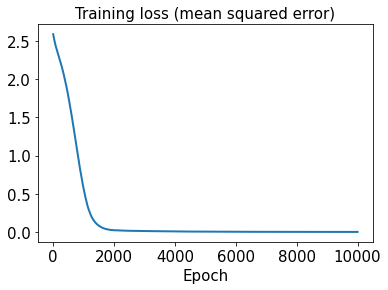

In [66]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

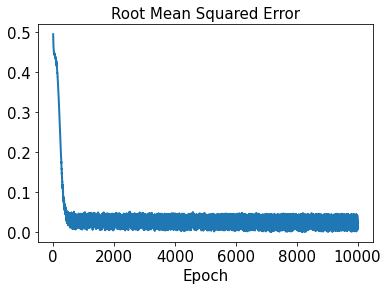

In [67]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [68]:
sd2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [69]:
start2 = datetime.datetime.now()
history2 = sd2.fit(x_train2, y_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 12ms/step - loss: 2.6843 - rmse: 1.6384
Epoch 2/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.6752 - rmse: 1.6356
Epoch 3/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.6668 - rmse: 1.6330
Epoch 4/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.6585 - rmse: 1.6305
Epoch 5/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.6502 - rmse: 1.6279
Epoch 6/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.6419 - rmse: 1.6254
Epoch 7/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6335 - rmse: 1.6228
Epoch 8/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.6251 - rmse: 1.6202
Epoch 9/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.6167 - rmse: 1.6176
Epoch 10/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6084 - rmse: 1.6150
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 8ms/step - loss: 2.0169 - rmse: 1.4201
Epoch 87/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0089 - rmse: 1.4172
Epoch 88/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0036 - rmse: 1.4154
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0003 - rmse: 1.4142
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9887 - rmse: 1.4101
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9833 - rmse: 1.4082
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9760 - rmse: 1.4056
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9743 - rmse: 1.4050
Epoch 94/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9676 - rmse: 1.4026
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9571 - rmse: 1.3989
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 1.4229 - rmse: 1.1928
Epoch 171/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4091 - rmse: 1.1870
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4040 - rmse: 1.1848
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3967 - rmse: 1.1818
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3872 - rmse: 1.1777
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3780 - rmse: 1.1738
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3743 - rmse: 1.1723
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3639 - rmse: 1.1678
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3596 - rmse: 1.1660
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3470 - rmse: 1.1605
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.8266 - rmse: 0.9091
Epoch 255/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8210 - rmse: 0.9060
Epoch 256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8206 - rmse: 0.9058
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8132 - rmse: 0.9017
Epoch 258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8028 - rmse: 0.8959
Epoch 259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8050 - rmse: 0.8971
Epoch 260/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7914 - rmse: 0.8896
Epoch 261/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7924 - rmse: 0.8901
Epoch 262/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7864 - rmse: 0.8867
Epoch 263/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7801 - rmse: 0.8832
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.4068 - rmse: 0.6378
Epoch 339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4029 - rmse: 0.6347
Epoch 340/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3988 - rmse: 0.6315
Epoch 341/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3984 - rmse: 0.6311
Epoch 342/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3896 - rmse: 0.6241
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3841 - rmse: 0.6197
Epoch 344/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3832 - rmse: 0.6190
Epoch 345/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3782 - rmse: 0.6149
Epoch 346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3742 - rmse: 0.6116
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3760 - rmse: 0.6131
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.1824 - rmse: 0.4270
Epoch 423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1864 - rmse: 0.4316
Epoch 424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1823 - rmse: 0.4268
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1766 - rmse: 0.4201
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1751 - rmse: 0.4184
Epoch 427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1771 - rmse: 0.4208
Epoch 428/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1740 - rmse: 0.4170
Epoch 429/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1701 - rmse: 0.4124
Epoch 430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1700 - rmse: 0.4122
Epoch 431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1651 - rmse: 0.4062
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0773 - rmse: 0.2778
Epoch 507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0704 - rmse: 0.2652
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0725 - rmse: 0.2690
Epoch 509/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0733 - rmse: 0.2706
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0739 - rmse: 0.2716
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0665 - rmse: 0.2577
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0661 - rmse: 0.2569
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0700 - rmse: 0.2644
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0665 - rmse: 0.2578
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0691 - rmse: 0.2627
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 6ms/step - loss: 0.0267 - rmse: 0.1632
Epoch 591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0263 - rmse: 0.1619
Epoch 592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0260 - rmse: 0.1610
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0291 - rmse: 0.1704
Epoch 594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0277 - rmse: 0.1663
Epoch 595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0255 - rmse: 0.1594
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0248 - rmse: 0.1572
Epoch 597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0245 - rmse: 0.1564
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0226 - rmse: 0.1502
Epoch 599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0224 - rmse: 0.1494
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0137 - rmse: 0.1169
Epoch 676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0103 - rmse: 0.1010
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0879
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0113 - rmse: 0.1058
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0143 - rmse: 0.1193
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0102 - rmse: 0.1008
Epoch 759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0718
Epoch 760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0721
Epoch 761/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 762/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0663
Epoch 763/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0656
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 765/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 766/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 768/10000
2/2 [========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0794
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0922
Epoch 846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0844
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0550
Epoch 849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 850/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 4.0995e-04 - rmse: 0.0188
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9743e-04 - rmse: 0.0210
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9209e-04 - rmse: 0.0231
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 931/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0064 - rmse: 0.0794
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0403
Epoch 933/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 935/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8007e-04 - rmse: 0.0269
Epoch 936/10000
2/2 [=========

2/2 [==============================] - 0s 7ms/step - loss: 9.0784e-04 - rmse: 0.0292
Epoch 1010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 1011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0782
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2048e-04 - rmse: 0.0191
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 1014/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5244e-04 - rmse: 0.0245
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 1017/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 1019/10000
2/2 [===

Epoch 1092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 1093/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4731e-04 - rmse: 0.0172
Epoch 1094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6003e-04 - rmse: 0.0301
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7669e-04 - rmse: 0.0150
Epoch 1098/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5382e-04 - rmse: 0.0174
Epoch 1099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 1100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 1101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoc

2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0749
Epoch 1175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0520
Epoch 1176/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8331e-04 - rmse: 0.0152
Epoch 1177/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 1178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 1179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 1180/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0617
Epoch 1181/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 1182/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 1183/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0729
Epoch 1184/10000
2/2 [===========

Epoch 1257/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0866
Epoch 1258/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8803e-04 - rmse: 0.0306
Epoch 1259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 1260/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9033e-04 - rmse: 0.0272
Epoch 1261/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 1262/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4342e-04 - rmse: 0.0282
Epoch 1263/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7614e-04 - rmse: 0.0229
Epoch 1264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 1265/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3526e-04 - rmse: 0.0196
Epoch 1266/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8030e-04 - rmse: 0.0

2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0531
Epoch 1340/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.9132e-04 - rmse: 0.0233
Epoch 1341/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 1342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0879
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0448
Epoch 1346/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 1347/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 1348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 1349/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 7.8268e-04 - rmse: 0.0271
Epoch 1423/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0558
Epoch 1424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 1425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 1426/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 1427/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5985e-04 - rmse: 0.0146
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0769
Epoch 1431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 1432/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 1506/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.2761e-04 - rmse: 0.0280
Epoch 1507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0490
Epoch 1508/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.0573e-04 - rmse: 0.0276
Epoch 1509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 1510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 1511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 1512/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 1513/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 1514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0723
Epoch 1515/10000
2/2 [==

2/2 [==============================] - 0s 9ms/step - loss: 7.7900e-05 - rmse: 0.0058
Epoch 1588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 1589/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 1590/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1345e-04 - rmse: 0.0164
Epoch 1591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 1592/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 1593/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8892e-04 - rmse: 0.0120
Epoch 1594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 1595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0788
Epoch 1596/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 1597/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 1670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 1671/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5346e-04 - rmse: 0.0105
Epoch 1672/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8260e-04 - rmse: 0.0184
Epoch 1673/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.2243e-04 - rmse: 0.0296
Epoch 1674/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5342e-04 - rmse: 0.0176
Epoch 1676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0789
Epoch 1677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 1678/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3356e-04 - rmse: 0.0198
Epoch 1679/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 1752/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1875e-04 - rmse: 0.0133
Epoch 1753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 1754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 1755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 1756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 1757/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.7178e-04 - rmse: 0.0230
Epoch 1758/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0049 - rmse: 0.0695
Epoch 1759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0858
Epoch 1760/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 1761/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 1834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 1835/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 1836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 1837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0813
Epoch 1838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 1839/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0596e-04 - rmse: 0.0128
Epoch 1840/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 1841/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0055 - rmse: 0.0736
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8847e-04 - rmse: 0.0211
Epoch 1843/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 8.0002e-05 - rmse: 0.0063
Epoch 1916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 1917/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.9433e-05 - rmse: 0.0077
Epoch 1918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 1919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0680
Epoch 1920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 1921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 1922/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0558
Epoch 1923/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0841e-04 - rmse: 0.0082
Epoch 1924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 1925/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 1998/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 1999/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3639e-04 - rmse: 0.0299
Epoch 2000/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 2001/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4970e-04 - rmse: 0.0302
Epoch 2002/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 2003/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7317e-04 - rmse: 0.0231
Epoch 2004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0626
Epoch 2005/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 2006/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0708
Epoch 2007/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 2080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0799
Epoch 2081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 2082/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 2083/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 2084/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0530
Epoch 2085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 2086/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 2087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0721
Epoch 2088/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 2089/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 3.8030e-04 - rmse: 0.0185
Epoch 2163/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9362e-04 - rmse: 0.0160
Epoch 2164/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5467e-04 - rmse: 0.0303
Epoch 2165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 2166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 2167/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 2168/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4651e-04 - rmse: 0.0266
Epoch 2169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 2170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 2171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 2172/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 2245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 2246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 2248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 2249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 2250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 2251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 2252/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5295e-04 - rmse: 0.0204
Epoch 2253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 2254/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 2327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 2328/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 2329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 2330/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4626e-04 - rmse: 0.0145
Epoch 2331/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0665
Epoch 2332/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9203e-04 - rmse: 0.0214
Epoch 2333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 2334/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0687
Epoch 2335/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0063e-04 - rmse: 0.0080
Epoch 2336/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 2409/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 2410/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 2411/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3292e-04 - rmse: 0.0223
Epoch 2412/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 2413/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 2414/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 2415/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 2417/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 2418/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 2.8564e-04 - rmse: 0.0159
Epoch 2492/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 2493/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1492e-04 - rmse: 0.0297
Epoch 2494/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 2495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 2496/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 2497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 2498/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 2499/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2050e-04 - rmse: 0.0262
Epoch 2500/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 2501/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 2575/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 2576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 2577/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 2578/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 2579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 2580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 2581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 2582/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 2583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 2584/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 2.9967e-04 - rmse: 0.0163
Epoch 2657/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 2658/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 2659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 2660/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 2661/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7461e-04 - rmse: 0.0233
Epoch 2662/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 2663/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 2664/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 2665/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7111e-04 - rmse: 0.0306
Epoch 2666/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 2740/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 2741/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 2742/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 2743/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 2744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 2745/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1193e-04 - rmse: 0.0279
Epoch 2746/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2747/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.8150e-04 - rmse: 0.0308
Epoch 2748/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 2749/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 5.3312e-04 - rmse: 0.0224
Epoch 2823/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.7631e-04 - rmse: 0.0254
Epoch 2824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 2825/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0072e-04 - rmse: 0.0277
Epoch 2826/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8254e-04 - rmse: 0.0235
Epoch 2827/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 2828/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 2829/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5052e-04 - rmse: 0.0228
Epoch 2830/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6188e-04 - rmse: 0.0182
Epoch 2831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0700
Epoch 2832/10

Epoch 2905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 2906/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7866e-04 - rmse: 0.0212
Epoch 2907/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 2908/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 2909/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 2910/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8021e-04 - rmse: 0.0234
Epoch 2911/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 2912/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 2913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 2914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 2915/1

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 2989/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0642
Epoch 2990/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0511e-04 - rmse: 0.0194
Epoch 2991/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5202e-04 - rmse: 0.0111
Epoch 2992/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0056 - rmse: 0.0749
Epoch 2993/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 2994/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0322e-04 - rmse: 0.0165
Epoch 2995/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.2909e-04 - rmse: 0.0100
Epoch 2996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 2997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 2998/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 3071/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4871e-04 - rmse: 0.0286
Epoch 3073/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 3074/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 3075/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 3076/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 3077/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0256e-05 - rmse: 0.0033
Epoch 3078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 3079/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1233e-04 - rmse: 0.0168
Epoch 3080/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 5.2166e-04 - rmse: 0.0222
Epoch 3153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 3154/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 3155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 3156/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 3157/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2451e-04 - rmse: 0.0172
Epoch 3158/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 3159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 3160/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 3161/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 3162/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 9.3794e-04 - rmse: 0.0302
Epoch 3235/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 3236/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 3237/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 3238/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0802
Epoch 3239/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 3240/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 3241/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 3242/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 3243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 3244/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 3318/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 3319/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3337e-04 - rmse: 0.0284
Epoch 3320/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6938e-04 - rmse: 0.0253
Epoch 3321/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 3322/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 3323/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 3324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0084 - rmse: 0.0914
Epoch 3325/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 3326/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 3327/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 3.1501e-04 - rmse: 0.0170
Epoch 3400/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 3401/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 3402/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 3403/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9270e-04 - rmse: 0.0258
Epoch 3404/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 3405/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6589e-04 - rmse: 0.0184
Epoch 3406/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 3407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 3408/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 3409/10000
2/2 [==

2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 3482/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3363e-04 - rmse: 0.0284
Epoch 3483/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0595e-04 - rmse: 0.0134
Epoch 3484/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 3485/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 3486/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 3487/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 3488/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0642
Epoch 3489/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 3490/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 3491/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 1.8620e-04 - rmse: 0.0127
Epoch 3564/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 3565/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 3566/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 3567/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 3568/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 3569/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 3570/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 3571/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 3572/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 3573/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 1.8495e-04 - rmse: 0.0127
Epoch 3647/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 3648/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4615e-04 - rmse: 0.0110
Epoch 3649/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 3650/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 3651/10000
2/2 [==============================] - 0s 21ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 3652/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 3653/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 3654/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0775e-04 - rmse: 0.0091
Epoch 3655/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 3656/10000
2/2

2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 3730/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 3731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 3732/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 3733/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 3734/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4702e-04 - rmse: 0.0250
Epoch 3735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 3736/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 3737/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 3738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 3739/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6540e-04 - rmse: 0.0156
Epoch 3813/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 3814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 3815/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.8967e-04 - rmse: 0.0311
Epoch 3816/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 3817/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0988e-04 - rmse: 0.0221
Epoch 3818/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 3819/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4449e-04 - rmse: 0.0110
Epoch 3820/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7854e-05 - rmse: 0.0074
Epoch 3821/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 3894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 3895/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 3896/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 3897/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 3898/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 3899/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 3900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 3901/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 3902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 3903/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 3976/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 3977/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 3978/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 3979/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 3980/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8194e-04 - rmse: 0.0126
Epoch 3981/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 3982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 3983/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 3984/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3464e-04 - rmse: 0.0106
Epoch 3985/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 4.9395e-04 - rmse: 0.0217
Epoch 4059/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 4060/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0257e-05 - rmse: 0.0083
Epoch 4061/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4619e-05 - rmse: 0.0079
Epoch 4062/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8565e-04 - rmse: 0.0162
Epoch 4063/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 4064/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 4065/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 4066/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4067/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 4068/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 4141/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 4142/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 4143/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0692e-04 - rmse: 0.0169
Epoch 4144/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0842e-04 - rmse: 0.0281
Epoch 4145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 4146/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 4147/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 4148/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 4149/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 4150/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 4223/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2563e-04 - rmse: 0.0103
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1699e-04 - rmse: 0.0264
Epoch 4226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 4227/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 4228/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 4229/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 4230/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 4231/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0048e-05 - rmse: 0.0044
Epoch 4232/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 4306/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 4307/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 4308/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0885
Epoch 4309/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 4310/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 4311/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 4312/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 4313/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 4314/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3959e-04 - rmse: 0.0286
Epoch 4315/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 8.6596e-05 - rmse: 0.0082
Epoch 4388/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7572e-04 - rmse: 0.0125
Epoch 4389/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 4390/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 4391/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 4392/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6230e-04 - rmse: 0.0290
Epoch 4393/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 4394/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 4395/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 4396/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 4397/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 4470/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6043e-04 - rmse: 0.0155
Epoch 4471/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 4472/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 4473/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 4474/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 4475/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 4476/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9757e-04 - rmse: 0.0167
Epoch 4477/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4870e-04 - rmse: 0.0251
Epoch 4478/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 4479/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 5.0191e-04 - rmse: 0.0220
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 4553/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 4554/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 4555/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4930e-04 - rmse: 0.0270
Epoch 4556/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4557/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 4558/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 4559/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 4560/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 4561/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.7226e-04 - rmse: 0.0213
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 4636/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 4637/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 4638/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 4639/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 4640/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7094e-04 - rmse: 0.0309
Epoch 4641/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7593e-04 - rmse: 0.0126
Epoch 4642/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 4643/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5120e-04 - rmse: 0.0153
Epoch 4644/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 4717/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5459e-04 - rmse: 0.0209
Epoch 4718/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5389e-04 - rmse: 0.0183
Epoch 4719/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 4720/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 4721/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 4722/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 4723/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 4724/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 4725/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7342e-04 - rmse: 0.0256
Epoch 4726/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 4800/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 4801/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 4802/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 4803/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7505e-04 - rmse: 0.0275
Epoch 4804/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 4805/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 4806/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5466e-04 - rmse: 0.0306
Epoch 4807/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 4808/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 4809/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.1645e-04 - rmse: 0.0141
Epoch 4883/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 4884/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 4885/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 4886/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0814
Epoch 4887/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 4888/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 4889/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7108e-04 - rmse: 0.0256
Epoch 4890/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 4891/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 4892/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 9.1703e-04 - rmse: 0.0300
Epoch 4966/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4701e-04 - rmse: 0.0270
Epoch 4967/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 4968/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 4969/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 4970/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 4971/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2725e-04 - rmse: 0.0203
Epoch 4972/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0935e-04 - rmse: 0.0198
Epoch 4973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 4974/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 4975/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 5048/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1783e-04 - rmse: 0.0174
Epoch 5049/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.0962e-04 - rmse: 0.0244
Epoch 5050/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2322e-04 - rmse: 0.0144
Epoch 5051/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 5052/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 5053/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0726
Epoch 5054/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7441e-04 - rmse: 0.0257
Epoch 5055/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5007e-04 - rmse: 0.0153
Epoch 5056/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 5057/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 5130/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 5131/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.8017e-04 - rmse: 0.0258
Epoch 5132/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0796
Epoch 5133/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.2906e-04 - rmse: 0.0248
Epoch 5134/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 5135/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 5136/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 5137/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 5138/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 5139/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 4.9160e-04 - rmse: 0.0218
Epoch 5213/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 5214/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 5215/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 5216/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 5217/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9801e-04 - rmse: 0.0135
Epoch 5218/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0544e-04 - rmse: 0.0138
Epoch 5219/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 5220/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 5221/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9383e-04 - rmse: 0.0195
Epoch 5222/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 5296/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4357e-04 - rmse: 0.0288
Epoch 5297/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0764
Epoch 5298/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 5299/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5300/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.0659e-04 - rmse: 0.0263
Epoch 5301/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 5302/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9941e-04 - rmse: 0.0136
Epoch 5303/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0038e-04 - rmse: 0.0196
Epoch 5304/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 5305/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 6.8999e-04 - rmse: 0.0260
Epoch 5378/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 5379/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 5380/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0544e-04 - rmse: 0.0138
Epoch 5381/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 5382/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 5383/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 5384/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 5385/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 5386/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 5387/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 1.3247e-04 - rmse: 0.0109
Epoch 5460/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 5461/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 5462/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 5463/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9523e-04 - rmse: 0.0261
Epoch 5464/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 5465/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 5466/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 5467/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4868e-04 - rmse: 0.0208
Epoch 5468/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 5469/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 5542/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 5543/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2405e-04 - rmse: 0.0176
Epoch 5544/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 5545/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 5546/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3074e-04 - rmse: 0.0204
Epoch 5547/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 5548/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0705
Epoch 5549/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0078 - rmse: 0.0885
Epoch 5550/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5551/10000
2/2 [======

2/2 [==============================] - 0s 8ms/step - loss: 5.2943e-04 - rmse: 0.0227
Epoch 5624/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2219e-04 - rmse: 0.0144
Epoch 5625/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3802e-04 - rmse: 0.0206
Epoch 5626/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 5627/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2831e-04 - rmse: 0.0107
Epoch 5628/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5502e-04 - rmse: 0.0155
Epoch 5629/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5913e-04 - rmse: 0.0121
Epoch 5630/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 5631/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1333e-04 - rmse: 0.0100
Epoch 5632/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 563

2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 5706/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 5707/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0657
Epoch 5708/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 5709/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7419e-04 - rmse: 0.0310
Epoch 5710/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 5711/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 5712/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 5713/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6202e-04 - rmse: 0.0291
Epoch 5714/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 5715/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 5789/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 5790/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 5791/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5792/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 5793/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3767e-04 - rmse: 0.0287
Epoch 5794/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5324e-04 - rmse: 0.0253
Epoch 5795/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5899e-05 - rmse: 0.0047
Epoch 5796/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 5797/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 5798/10000
2/2 [=

2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0696
Epoch 5872/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 5873/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 5874/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 5875/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 5876/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 5877/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 5878/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 5879/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 5880/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 5881/10000
2/2 [===============

Epoch 5954/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7584e-05 - rmse: 0.0092
Epoch 5955/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 5956/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 5957/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 5958/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 5959/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0687
Epoch 5960/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 5961/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 5962/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3121e-04 - rmse: 0.0228
Epoch 5963/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 5964/1

2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 6038/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 6039/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 6040/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 6041/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6868e-04 - rmse: 0.0125
Epoch 6042/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 6043/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 6044/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 6045/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 6046/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 6047/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6120/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 6121/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 6122/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6411e-04 - rmse: 0.0255
Epoch 6123/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 6124/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 6125/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 6126/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2754e-04 - rmse: 0.0227
Epoch 6127/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 6128/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 6129/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.6579e-04 - rmse: 0.0213
Epoch 6202/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0793
Epoch 6203/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 6204/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 6205/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 6206/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0666
Epoch 6207/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8716e-04 - rmse: 0.0166
Epoch 6208/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9792e-04 - rmse: 0.0136
Epoch 6209/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 6210/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 6211/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 6284/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4204e-04 - rmse: 0.0251
Epoch 6285/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 6286/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 6287/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 6288/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1206e-04 - rmse: 0.0173
Epoch 6289/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2488e-04 - rmse: 0.0106
Epoch 6290/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6291/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6292/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 6293/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 5.0202e-04 - rmse: 0.0221
Epoch 6366/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 6367/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 6368/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 6369/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 6370/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 6371/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 6372/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 6373/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.0038e-04 - rmse: 0.0197
Epoch 6374/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 6375/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 6448/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 6449/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 6450/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 6451/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 6452/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 6453/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0703
Epoch 6454/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 6455/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5535e-04 - rmse: 0.0273
Epoch 6456/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4330e-04 - rmse: 0.0288
Epoch 6457/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6530/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 6531/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 6532/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 6533/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 6534/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 6535/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7256e-05 - rmse: 0.0081
Epoch 6536/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 6537/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 6538/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0514e-04 - rmse: 0.0096
Epoch 6539/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 6612/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3928e-04 - rmse: 0.0113
Epoch 6613/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4976e-04 - rmse: 0.0117
Epoch 6614/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 6615/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 6616/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 6617/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 6618/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 6619/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6620/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1641e-04 - rmse: 0.0225
Epoch 6621/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 6694/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2181e-04 - rmse: 0.0202
Epoch 6695/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 6696/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3891e-04 - rmse: 0.0151
Epoch 6697/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 6698/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6804e-04 - rmse: 0.0125
Epoch 6699/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 6700/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9982e-05 - rmse: 0.0082
Epoch 6701/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6461e-04 - rmse: 0.0159
Epoch 6702/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.0014e-05 - rmse: 0.0082
Epoch 6703/10

2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 6776/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 6777/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3348e-04 - rmse: 0.0110
Epoch 6778/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 6779/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6780/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6781/10000
2/2 [==============================] - 0s 18ms/step - loss: 6.6856e-04 - rmse: 0.0256
Epoch 6782/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 6783/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 6784/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 6785/10000
2/2 [

2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 6858/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 6859/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 6860/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4704e-04 - rmse: 0.0153
Epoch 6861/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6862/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 6863/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 6864/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 6865/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 6866/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 6867/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 6941/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3268e-04 - rmse: 0.0228
Epoch 6942/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 6943/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 6944/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 6945/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0272e-04 - rmse: 0.0138
Epoch 6946/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6947/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 6948/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0595e-04 - rmse: 0.0097
Epoch 6949/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 6950/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 7023/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 7024/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0444e-04 - rmse: 0.0139
Epoch 7025/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 7026/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 7027/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 7028/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5666e-04 - rmse: 0.0254
Epoch 7029/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0087e-04 - rmse: 0.0094
Epoch 7030/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 7031/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0779e-04 - rmse: 0.0098
Epoch 7032/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 7105/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 7106/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 7107/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 7108/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 7109/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 7110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7111/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 7112/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0922
Epoch 7113/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 7114/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 7188/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 7189/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 7190/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7191/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 7192/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7360e-04 - rmse: 0.0215
Epoch 7193/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 7194/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 7195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 7196/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 7197/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 7270/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 7271/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 7272/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2403e-04 - rmse: 0.0203
Epoch 7273/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 7274/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8655e-04 - rmse: 0.0194
Epoch 7275/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3256e-04 - rmse: 0.0179
Epoch 7276/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 7277/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5524e-04 - rmse: 0.0185
Epoch 7278/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7653e-04 - rmse: 0.0216
Epoch 7279/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 7352/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 7353/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5045e-04 - rmse: 0.0118
Epoch 7354/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 7355/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 7356/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6004e-04 - rmse: 0.0158
Epoch 7357/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 7358/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7359/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 7360/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 7361/10000
2/2 [==

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7434/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0717
Epoch 7435/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 7436/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 7437/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0796
Epoch 7438/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 7439/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 7440/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 7441/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 7442/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 7443/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 7.2178e-04 - rmse: 0.0267
Epoch 7516/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1864e-04 - rmse: 0.0175
Epoch 7517/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 7518/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 7519/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7520/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7521/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 7522/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7959e-04 - rmse: 0.0216
Epoch 7523/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 7524/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0716e-04 - rmse: 0.0140
Epoch 7525/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 7598/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9289e-04 - rmse: 0.0297
Epoch 7599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 7600/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 7601/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 7602/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 7603/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 7604/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 7605/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 7606/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5727e-04 - rmse: 0.0254
Epoch 7607/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 7680/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8238e-04 - rmse: 0.0131
Epoch 7681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 7682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0750
Epoch 7683/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 7684/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0886
Epoch 7685/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 7686/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 7687/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0073 - rmse: 0.0856
Epoch 7688/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7497e-04 - rmse: 0.0310
Epoch 7689/10000
2/2 [==

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 7762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0833
Epoch 7763/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.0562e-04 - rmse: 0.0244
Epoch 7764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 7765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0884
Epoch 7766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 7767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 7768/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 7769/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 7770/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0960e-04 - rmse: 0.0223
Epoch 7771/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 7844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 7845/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0704e-04 - rmse: 0.0199
Epoch 7846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 7847/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 7848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 7849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 7850/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 7851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0716
Epoch 7852/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 7853/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 7926/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6999e-04 - rmse: 0.0257
Epoch 7927/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3958e-04 - rmse: 0.0181
Epoch 7928/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 7929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 7930/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 7931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 7932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 7933/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3059e-04 - rmse: 0.0205
Epoch 7934/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 7935/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 8008/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 8009/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 8010/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 8011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 8012/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 8013/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 8014/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 8015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 8016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 8017/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 8091/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.7818e-05 - rmse: 0.0068
Epoch 8092/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9129e-04 - rmse: 0.0219
Epoch 8093/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 8094/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3851e-04 - rmse: 0.0181
Epoch 8095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 8097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 8098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 8099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 8100/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 4.8081e-04 - rmse: 0.0217
Epoch 8173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 8174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 8175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 8176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 8177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 8178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 8180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 8182/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 6.6951e-04 - rmse: 0.0257
Epoch 8255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0578
Epoch 8256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 8257/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9980e-04 - rmse: 0.0243
Epoch 8258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 8259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 8260/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2436e-04 - rmse: 0.0177
Epoch 8261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 8262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0798
Epoch 8263/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 8264/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 8338/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5549e-04 - rmse: 0.0120
Epoch 8339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 8342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 8343/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7519e-04 - rmse: 0.0163
Epoch 8344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 8345/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9522e-04 - rmse: 0.0136
Epoch 8346/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4361e-04 - rmse: 0.0252
Epoch 8347/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 8420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 8421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 8423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 8424/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 8425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 8426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 8427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 8429/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 8502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 8503/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 8504/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2373e-05 - rmse: 0.0046
Epoch 8505/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5647e-04 - rmse: 0.0254
Epoch 8506/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3487e-04 - rmse: 0.0206
Epoch 8507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 8508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 8509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8510/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.3056e-04 - rmse: 0.0286
Epoch 8511/10000
2/2 

2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 8584/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5323e-04 - rmse: 0.0253
Epoch 8585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 8586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 8587/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 8588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 8589/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.4940e-04 - rmse: 0.0209
Epoch 8590/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1735e-05 - rmse: 0.0064
Epoch 8591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 8592/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 8593/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 6.9423e-04 - rmse: 0.0261
Epoch 8667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 8668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 8669/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9066e-04 - rmse: 0.0219
Epoch 8670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8671/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.4994e-04 - rmse: 0.0184
Epoch 8672/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4194e-04 - rmse: 0.0230
Epoch 8673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 8675/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 8676/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 9.4924e-04 - rmse: 0.0306
Epoch 8749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 8750/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4707e-04 - rmse: 0.0154
Epoch 8751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8752/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.3912e-04 - rmse: 0.0181
Epoch 8753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 8755/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4155e-04 - rmse: 0.0114
Epoch 8756/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9038e-04 - rmse: 0.0134
Epoch 8757/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.9840e-04 - rmse: 0.0262
Epoch 8758/10

2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 8831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8832/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4217e-04 - rmse: 0.0305
Epoch 8833/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 8834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 8835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 8836/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.3461e-04 - rmse: 0.0111
Epoch 8837/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4045e-04 - rmse: 0.0207
Epoch 8838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 8839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 8840/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 8913/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1917e-04 - rmse: 0.0301
Epoch 8914/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 8915/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4690e-05 - rmse: 0.0066
Epoch 8916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8917/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 8919/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 8920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 8921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 8922/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 8995/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 8996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8997/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 8998/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 8999/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 9000/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5992e-04 - rmse: 0.0122
Epoch 9001/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 9002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9003/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0111e-04 - rmse: 0.0170
Epoch 9004/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 9.9939e-05 - rmse: 0.0094
Epoch 9077/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 9078/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0721
Epoch 9079/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0765
Epoch 9080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 9081/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3181e-04 - rmse: 0.0269
Epoch 9082/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 9083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 9084/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 9085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 9086/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 9159/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 9160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9161/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 9162/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 9163/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 9164/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 9165/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 9166/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9323e-04 - rmse: 0.0261
Epoch 9167/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 9168/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 5.6477e-04 - rmse: 0.0235
Epoch 9242/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 9243/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 9244/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 9245/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.0034e-04 - rmse: 0.0298
Epoch 9246/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9247/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 9248/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 9249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 9250/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9251/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 9324/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3867e-04 - rmse: 0.0181
Epoch 9325/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 9326/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0928e-04 - rmse: 0.0223
Epoch 9327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 9328/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 9329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 9330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 9331/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 9332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 9333/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 9407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 9408/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 9409/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 9410/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 9411/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 9412/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 9413/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 9414/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9415/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 9416/10000
2/2 [===========

Epoch 9489/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 9490/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1768e-04 - rmse: 0.0225
Epoch 9491/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3847e-04 - rmse: 0.0288
Epoch 9492/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 9494/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9558e-04 - rmse: 0.0169
Epoch 9495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 9496/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1913e-04 - rmse: 0.0284
Epoch 9497/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 9498/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4528e-04 - rmse: 0.0116


2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 9572/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 9573/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 9574/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 9575/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 9576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0821
Epoch 9577/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 9578/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 9579/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.4781e-04 - rmse: 0.0272
Epoch 9580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 9581/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 9655/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 9656/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 9657/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 9658/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 9659/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4714e-05 - rmse: 0.0074
Epoch 9660/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6115e-04 - rmse: 0.0123
Epoch 9661/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 9662/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2054e-05 - rmse: 0.0065
Epoch 9663/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 9664/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 8.1359e-04 - rmse: 0.0283
Epoch 9737/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9628e-04 - rmse: 0.0169
Epoch 9738/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 9739/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 9740/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 9742/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 9743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 9744/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9745/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3588e-04 - rmse: 0.0250
Epoch 9746/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 9820/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 9821/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 9822/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 9823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 9824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 9825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 9826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 9827/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 9828/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2473e-04 - rmse: 0.0227
Epoch 9829/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 8.1404e-04 - rmse: 0.0283
Epoch 9902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0814
Epoch 9903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 9904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 9905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 9906/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7493e-04 - rmse: 0.0163
Epoch 9907/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4331e-04 - rmse: 0.0252
Epoch 9908/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 9909/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 9910/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 9911/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 9984/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5294e-04 - rmse: 0.0290
Epoch 9985/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9986/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2842e-04 - rmse: 0.0286
Epoch 9987/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1084e-04 - rmse: 0.0283
Epoch 9988/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0429
Epoch 9989/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6047e-05 - rmse: 0.0024
Epoch 9990/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3359e-04 - rmse: 0.0206
Epoch 9991/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 9992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 9993/10000


In [70]:
time2 = end2 - start2
print("Training time (Case 2):", time2)

Training time (Case 2): 0:02:52.641318


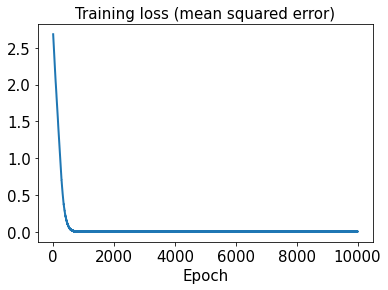

In [71]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

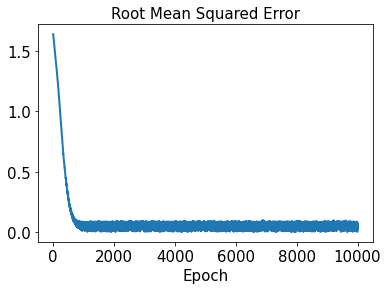

In [72]:
plt.plot(hist2['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [73]:
test_results2 = sd2.evaluate(x_test2)

1/1 [==============================] - 0s 81ms/step - loss: 1.0270e-05 - rmse: 0.0000e+00


In [74]:
decoded_sensor_train2 = sensor_pred2.predict(t_train)

In [75]:
decoded_sensor_test2 = sensor_pred2.predict(t_test)

In [76]:
decoded_train2 = sd2.predict(decoded_sensor_train2)

In [77]:
decoded_test2 = sd2.predict(decoded_sensor_test2)

In [78]:
error_train_abs2 = np.abs(decoded_train2 - y_train2)

In [79]:
error_test_abs2 = np.abs(decoded_test2 - y_test2)

In [138]:
l2_error_sensor_train2 = np.sqrt(np.sum((decoded_sensor_train2 - x_train2)**2) / np.sum(x_train2**2))
print(l2_error_sensor_train2)

0.011889220865575185


In [139]:
l2_error_sensor_test2 = np.sqrt(np.sum((decoded_sensor_test2 - x_test2)**2) / np.sum(x_test2**2))
print(l2_error_sensor_test2)

0.012089066091682834


In [80]:
l2_error_train2 = np.sqrt(np.sum((decoded_train2 - y_train2)**2) / np.sum(y_train2**2))
print(l2_error_train2)

0.019888572124111194


In [81]:
l2_error_test2 = np.sqrt(np.sum((decoded_test2 - y_test2)**2) / np.sum(y_test2**2))
print(l2_error_test2)

0.01851666421804495


In [82]:
l2_error_train_list2 = []
for i in range(0, len(x_train2)):
    l2_error_train_data2 = np.sqrt(np.sum((decoded_train2[i] - y_train2[i])**2) / np.sum(y_train2[i]**2))
    l2_error_train_list2.append(l2_error_train_data2)
print(l2_error_train_list2)

[0.005350951911675098, 0.03912747990876209, 0.0015491670440680796, 0.024145436202230558, 0.013856297027247982, 0.0312288008977205, 0.01776503421506059, 0.009126279847480122, 0.015778114112012152, 0.012791948573380205, 0.01179484548594969, 0.049688300238957005, 0.0027397925451949426, 0.04210299064579476, 0.02642325719901196, 0.050673272672465915, 0.006637316441033505, 0.006778799880772437, 0.050995255953335275, 0.007896401723092262, 0.01411137884880807, 0.047954238928341386, 0.013591664087699426, 0.003615119167510865, 0.010326577904885757, 0.028783050734182726, 0.005160341193805589, 0.0119971719775292, 0.00845912353663628, 0.03639609810591832, 0.01981964663273116, 0.004043997780301275, 0.014389677872130253]


In [83]:
l2_error_test_list2 = []
for i in range(0, len(x_test2)):
    l2_error_test_data2 = np.sqrt(np.sum((decoded_test2[i] - y_test2[i])**2) / np.sum(y_test2[i]**2))
    l2_error_test_list2.append(l2_error_test_data2)
print(l2_error_test_list2)

[0.0021899536319368246, 0.02194544974297692, 0.033764901527900334, 0.0011720061307763643, 0.045045412688656784, 0.011895562830194757, 0.01019858624296888, 0.014025380074481333]


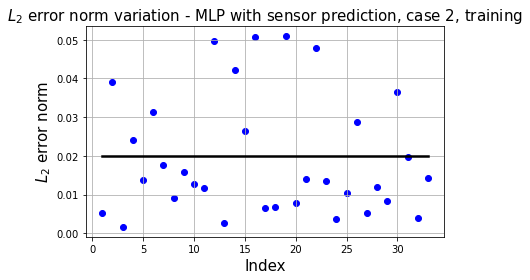

In [84]:
plt.plot(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train2*np.ones(x_train2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

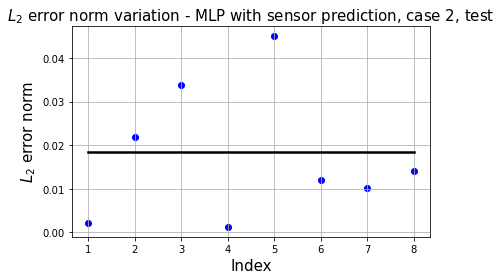

In [85]:
plt.plot(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test2*np.ones(x_test2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

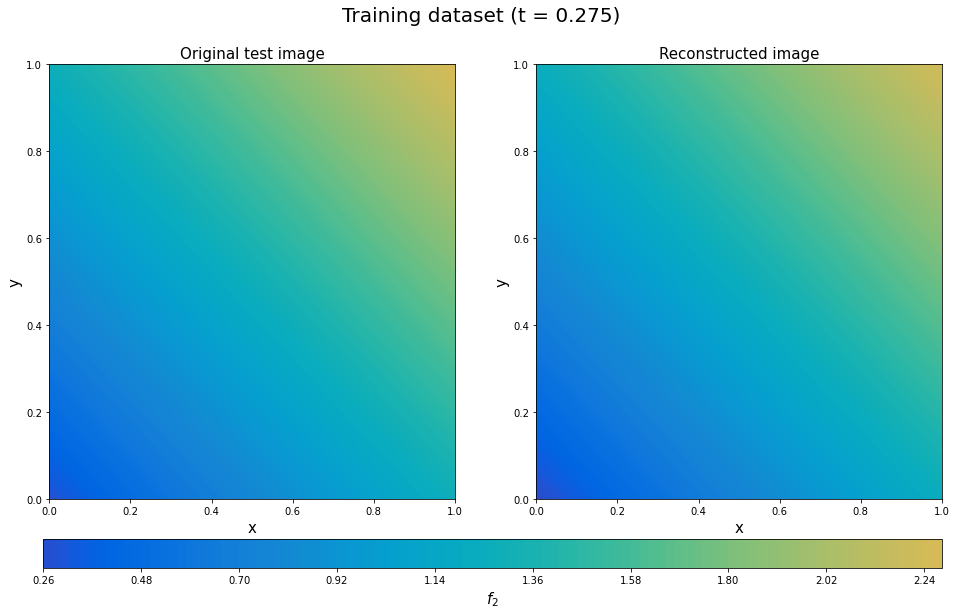

In [86]:
plt.figure(figsize=(16, 8))
y_train2_14_rotate = y_train2[14].T.reshape(101,101)
decoded_rotate2 = decoded_train2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_14_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[11]),fontsize=20)
plt.show()

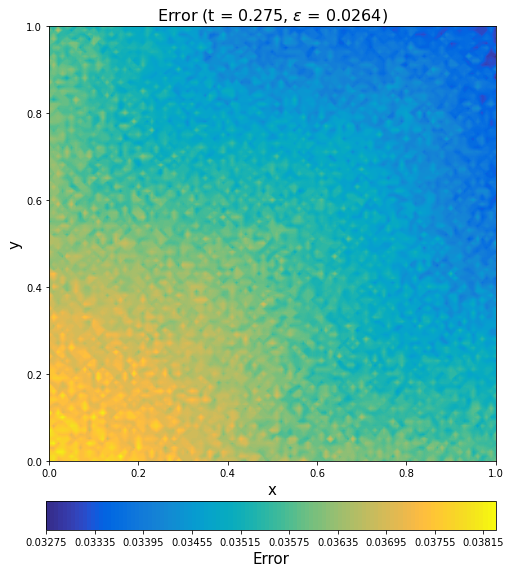

In [87]:
error_train_abs2_rotate14 = error_train_abs2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate14, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.275, $\epsilon$ = %.4f)' %(l2_error_train_list2[14]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

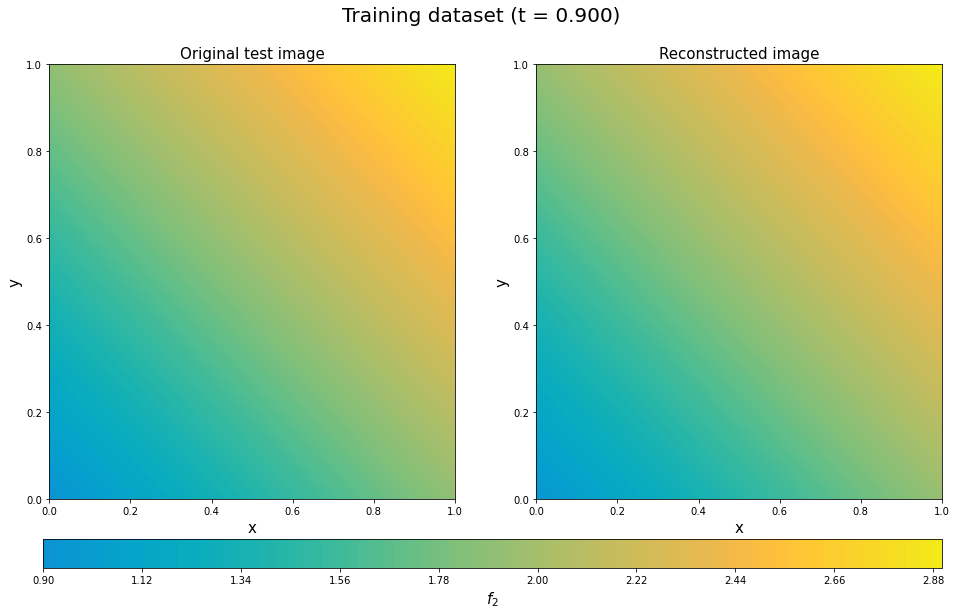

In [88]:
plt.figure(figsize=(16, 8))
y_train2_22_rotate = y_train2[22].T.reshape(101,101)
decoded_rotate2 = decoded_train2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_22_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[36]), fontsize=20)
plt.show()

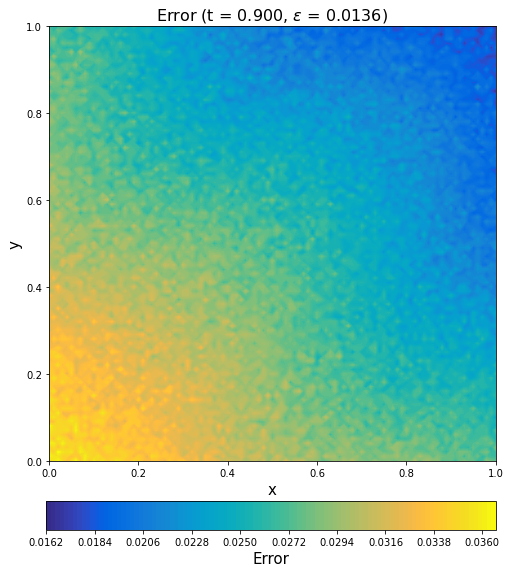

In [89]:
error_train_abs2_rotate22 = error_train_abs2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate22, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.900, $\epsilon$ = %.4f)' %(l2_error_train_list2[22]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

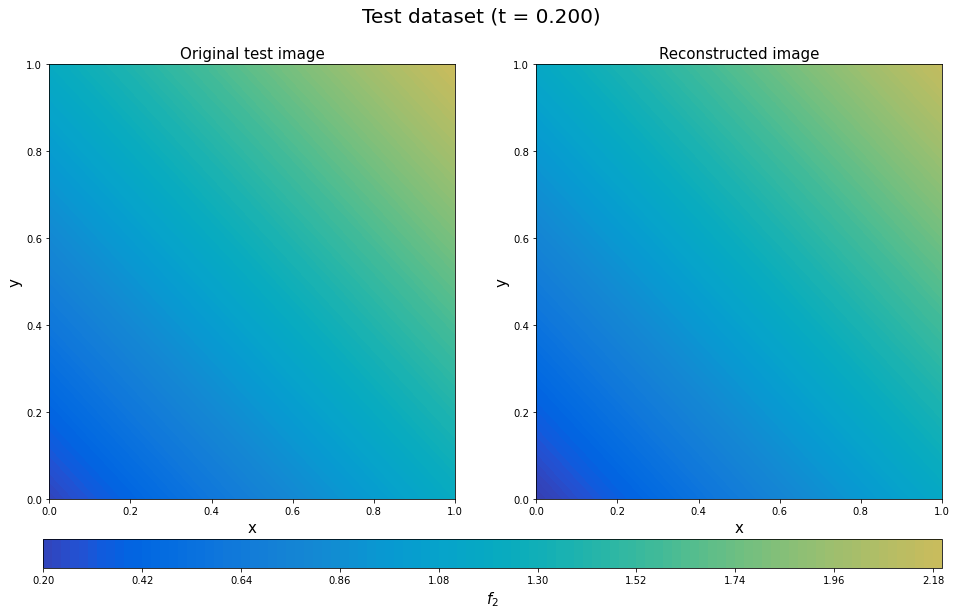

In [90]:
plt.figure(figsize=(16, 8))
y_test2_2_rotate = y_test2[2].T.reshape(101,101)
decoded_rotate2 = decoded_test2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

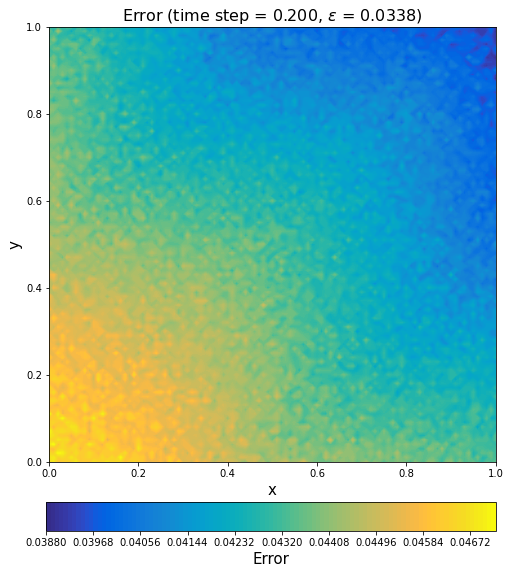

In [91]:
error_test_abs2_rotate2 = error_test_abs2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (time step = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list2[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

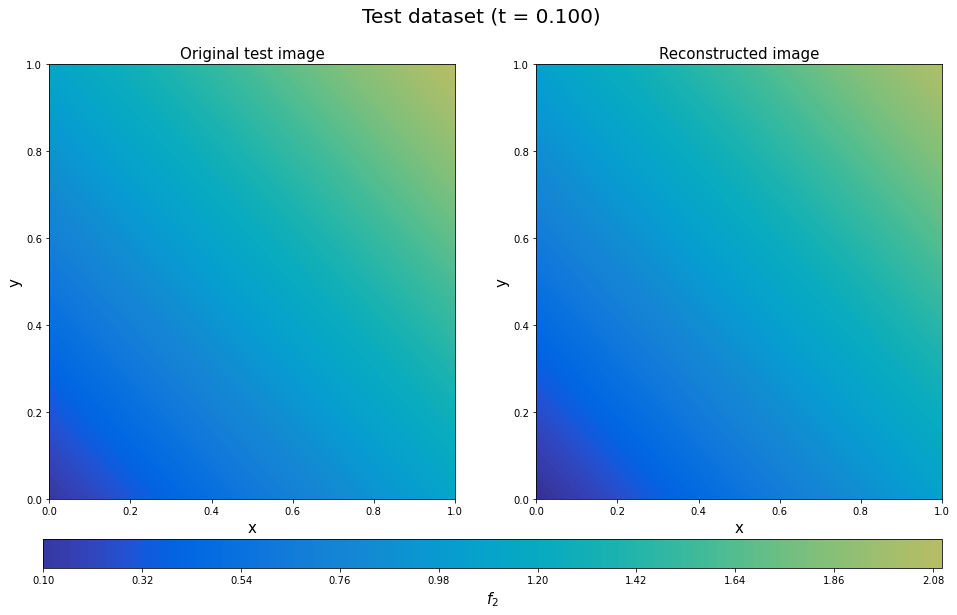

In [92]:
plt.figure(figsize=(16, 8))
y_test2_4_rotate = y_test2[4].T.reshape(101,101)
decoded_rotate2 = decoded_test2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_4_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[4]),fontsize=20)
plt.show()

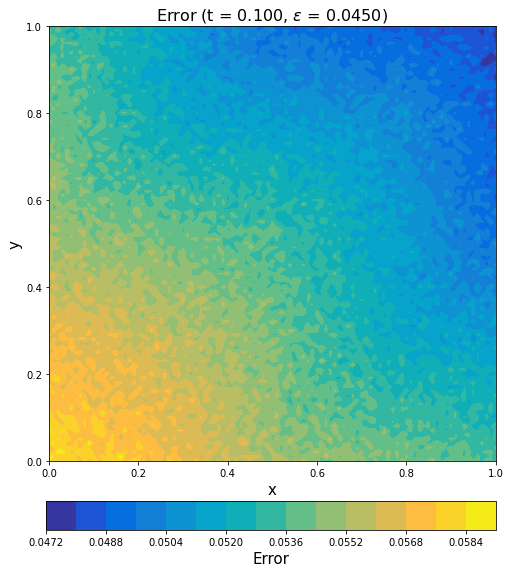

In [93]:
error_test_abs2_rotate4 = error_test_abs2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate4, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.100, $\epsilon$ = %.4f)' %(l2_error_test_list2[4]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 3: f3

In [94]:
out3 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out3[i, j, k] = np.exp(-t[i])*(2*np.sin(2*np.pi*x[j]) + np.sin(2*np.pi*x[j])*np.cos(2*np.pi*y[k]))

In [95]:
sensor3 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor3[i, j, k] = out3[i, 20*(j+1)+1, 20*(k+1)+1]

In [96]:
sensor3 = sensor3.reshape((41, 16, 1))

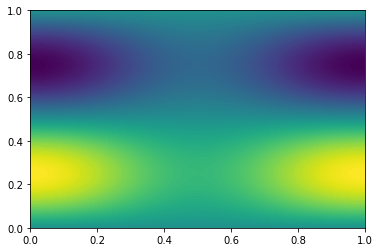

In [97]:
plt.contourf(xmesh, ymesh, out3[0,:,:], levels=128)

In [98]:
x_train3, x_test3, y_train3, y_test3, t_train, t_test = train_test_split(sensor3, out3, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [99]:
x_test3

array([[[ 1.19533543],
        [ 0.61432027],
        [ 0.65355792],
        [ 1.25882328],
        [ 0.66126769],
        [ 0.33984615],
        [ 0.36155269],
        [ 0.6963896 ],
        [-0.78664952],
        [-0.4042838 ],
        [-0.43010607],
        [-0.82843084],
        [-1.14744383],
        [-0.58970728],
        [-0.62737286],
        [-1.20838802]],

       [[ 1.57369576],
        [ 0.80877148],
        [ 0.86042905],
        [ 1.65727946],
        [ 0.8705792 ],
        [ 0.44741788],
        [ 0.4759952 ],
        [ 0.91681827],
        [-1.03564822],
        [-0.53225202],
        [-0.56624783],
        [-1.09065461],
        [-1.510645  ],
        [-0.77636772],
        [-0.82595561],
        [-1.59087989]],

       [[ 1.78323092],
        [ 0.91645815],
        [ 0.97499384],
        [ 1.87794366],
        [ 0.98649548],
        [ 0.50699088],
        [ 0.53937323],
        [ 1.03889121],
        [-1.17354318],
        [-0.60312055],
        [-0.64164286],
       

In [100]:
sensor_pred3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [101]:
start3 = datetime.datetime.now()
history3 = sensor_pred3.fit(t_train, x_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.8230 - rmse: 1.9553
Epoch 2/10000
2/2 [==============================] - 0s 25ms/step - loss: 3.8145 - rmse: 1.9531
Epoch 3/10000
2/2 [==============================] - 0s 44ms/step - loss: 3.8060 - rmse: 1.9509
Epoch 4/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.7977 - rmse: 1.9488
Epoch 5/10000
2/2 [==============================] - 0s 17ms/step - loss: 3.7891 - rmse: 1.9466
Epoch 6/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.7807 - rmse: 1.9444
Epoch 7/10000
2/2 [==============================] - 0s 5ms/step - loss: 3.7723 - rmse: 1.9422
Epoch 8/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.7640 - rmse: 1.9401
Epoch 9/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.7558 - rmse: 1.9380
Epoch 10/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.7478 - rmse: 1.9359
Epoch 11/10000
2/2 [==========================

2/2 [==============================] - 0s 4ms/step - loss: 3.2079 - rmse: 1.7911
Epoch 87/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.2015 - rmse: 1.7893
Epoch 88/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.1949 - rmse: 1.7874
Epoch 89/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.1884 - rmse: 1.7856
Epoch 90/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.1820 - rmse: 1.7838
Epoch 91/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.1759 - rmse: 1.7821
Epoch 92/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.1699 - rmse: 1.7804
Epoch 93/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.1642 - rmse: 1.7788
Epoch 94/10000
2/2 [==============================] - 0s 3ms/step - loss: 3.1585 - rmse: 1.7772
Epoch 95/10000
2/2 [==============================] - 0s 4ms/step - loss: 3.1530 - rmse: 1.7757
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 3ms/step - loss: 2.7569 - rmse: 1.6604
Epoch 171/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7522 - rmse: 1.6590
Epoch 172/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7474 - rmse: 1.6575
Epoch 173/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7425 - rmse: 1.6561
Epoch 174/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7377 - rmse: 1.6546
Epoch 175/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7327 - rmse: 1.6531
Epoch 176/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7279 - rmse: 1.6516
Epoch 177/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.7230 - rmse: 1.6502
Epoch 178/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7183 - rmse: 1.6487
Epoch 179/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.7137 - rmse: 1.6473
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 2.4191 - rmse: 1.5553
Epoch 255/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.4153 - rmse: 1.5541
Epoch 256/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.4115 - rmse: 1.5529
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4077 - rmse: 1.5517
Epoch 258/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4039 - rmse: 1.5505
Epoch 259/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.4000 - rmse: 1.5492
Epoch 260/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.3962 - rmse: 1.5480
Epoch 261/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3923 - rmse: 1.5467
Epoch 262/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.3886 - rmse: 1.5455
Epoch 263/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.3848 - rmse: 1.5443
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 2.1528 - rmse: 1.4672
Epoch 339/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.1501 - rmse: 1.4663
Epoch 340/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.1475 - rmse: 1.4654
Epoch 341/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.1448 - rmse: 1.4645
Epoch 342/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.1421 - rmse: 1.4636
Epoch 343/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.1393 - rmse: 1.4626
Epoch 344/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.1365 - rmse: 1.4617
Epoch 345/10000
2/2 [==============================] - 0s 4ms/step - loss: 2.1338 - rmse: 1.4607
Epoch 346/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.1310 - rmse: 1.4598
Epoch 347/10000
2/2 [==============================] - 0s 3ms/step - loss: 2.1282 - rmse: 1.4588
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 1.9337 - rmse: 1.3906
Epoch 423/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9313 - rmse: 1.3897
Epoch 424/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.9289 - rmse: 1.3888
Epoch 425/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9264 - rmse: 1.3880
Epoch 426/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9240 - rmse: 1.3871
Epoch 427/10000
2/2 [==============================] - 0s 2ms/step - loss: 1.9215 - rmse: 1.3862
Epoch 428/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9192 - rmse: 1.3853
Epoch 429/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9168 - rmse: 1.3845
Epoch 430/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9146 - rmse: 1.3837
Epoch 431/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.9123 - rmse: 1.3829
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 1.7528 - rmse: 1.3239
Epoch 507/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7508 - rmse: 1.3232
Epoch 508/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7488 - rmse: 1.3224
Epoch 509/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7468 - rmse: 1.3217
Epoch 510/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7448 - rmse: 1.3209
Epoch 511/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7429 - rmse: 1.3202
Epoch 512/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7409 - rmse: 1.3194
Epoch 513/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7390 - rmse: 1.3187
Epoch 514/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.7371 - rmse: 1.3180
Epoch 515/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.7352 - rmse: 1.3173
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 1.5992 - rmse: 1.2646
Epoch 591/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.5975 - rmse: 1.2639
Epoch 592/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5959 - rmse: 1.2633
Epoch 593/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5942 - rmse: 1.2626
Epoch 594/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5926 - rmse: 1.2620
Epoch 595/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5910 - rmse: 1.2613
Epoch 596/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5893 - rmse: 1.2607
Epoch 597/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5877 - rmse: 1.2600
Epoch 598/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5860 - rmse: 1.2594
Epoch 599/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.5844 - rmse: 1.2587
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 1.4679 - rmse: 1.2116
Epoch 675/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.4664 - rmse: 1.2110
Epoch 676/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.4650 - rmse: 1.2104
Epoch 677/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.4635 - rmse: 1.2097
Epoch 678/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.4620 - rmse: 1.2091
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4606 - rmse: 1.2085
Epoch 680/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.4592 - rmse: 1.2080
Epoch 681/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.4577 - rmse: 1.2074
Epoch 682/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.4563 - rmse: 1.2068
Epoch 683/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.4549 - rmse: 1.2062
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 1.3545 - rmse: 1.1638
Epoch 759/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3532 - rmse: 1.1633
Epoch 760/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3519 - rmse: 1.1627
Epoch 761/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3506 - rmse: 1.1622
Epoch 762/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3494 - rmse: 1.1616
Epoch 763/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3481 - rmse: 1.1611
Epoch 764/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3469 - rmse: 1.1605
Epoch 765/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3456 - rmse: 1.1600
Epoch 766/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3443 - rmse: 1.1594
Epoch 767/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.3431 - rmse: 1.1589
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 4ms/step - loss: 1.2546 - rmse: 1.1201
Epoch 843/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.2535 - rmse: 1.1196
Epoch 844/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2524 - rmse: 1.1191
Epoch 845/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.2513 - rmse: 1.1186
Epoch 846/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2502 - rmse: 1.1181
Epoch 847/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.2491 - rmse: 1.1176
Epoch 848/10000
2/2 [==============================] - 0s 5ms/step - loss: 1.2480 - rmse: 1.1171
Epoch 849/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2469 - rmse: 1.1166
Epoch 850/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.2458 - rmse: 1.1162
Epoch 851/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.2447 - rmse: 1.1157
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 1.1657 - rmse: 1.0797
Epoch 927/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1647 - rmse: 1.0792
Epoch 928/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.1637 - rmse: 1.0787
Epoch 929/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1627 - rmse: 1.0783
Epoch 930/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1617 - rmse: 1.0778
Epoch 931/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1607 - rmse: 1.0773
Epoch 932/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1597 - rmse: 1.0769
Epoch 933/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1587 - rmse: 1.0764
Epoch 934/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.1577 - rmse: 1.0760
Epoch 935/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1567 - rmse: 1.0755
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 3ms/step - loss: 1.0849 - rmse: 1.0416
Epoch 1011/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0840 - rmse: 1.0411
Epoch 1012/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.0830 - rmse: 1.0407
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0821 - rmse: 1.0402
Epoch 1014/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.0812 - rmse: 1.0398
Epoch 1015/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.0803 - rmse: 1.0394
Epoch 1016/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0793 - rmse: 1.0389
Epoch 1017/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.0784 - rmse: 1.0385
Epoch 1018/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.0775 - rmse: 1.0380
Epoch 1019/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.0766 - rmse: 1.0376
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 1.0051 - rmse: 1.0025
Epoch 1094/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.0040 - rmse: 1.0020
Epoch 1095/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.0029 - rmse: 1.0014
Epoch 1096/10000
2/2 [==============================] - 0s 4ms/step - loss: 1.0018 - rmse: 1.0009
Epoch 1097/10000
2/2 [==============================] - 0s 3ms/step - loss: 1.0007 - rmse: 1.0003
Epoch 1098/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.9995 - rmse: 0.9998
Epoch 1099/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.9984 - rmse: 0.9992
Epoch 1100/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.9973 - rmse: 0.9986
Epoch 1101/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.9961 - rmse: 0.9980
Epoch 1102/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.9949 - rmse: 0.9974
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.8932 - rmse: 0.9451
Epoch 1177/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8919 - rmse: 0.9444
Epoch 1178/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8906 - rmse: 0.9437
Epoch 1179/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8893 - rmse: 0.9430
Epoch 1180/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8880 - rmse: 0.9424
Epoch 1181/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8867 - rmse: 0.9417
Epoch 1182/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8855 - rmse: 0.9410
Epoch 1183/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.8842 - rmse: 0.9403
Epoch 1184/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.8829 - rmse: 0.9396
Epoch 1185/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.8816 - rmse: 0.9389
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.7904 - rmse: 0.8890
Epoch 1260/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.7893 - rmse: 0.8884
Epoch 1261/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7881 - rmse: 0.8878
Epoch 1262/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7870 - rmse: 0.8871
Epoch 1263/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.7858 - rmse: 0.8864
Epoch 1264/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.7846 - rmse: 0.8858
Epoch 1265/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.7835 - rmse: 0.8851
Epoch 1266/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.7823 - rmse: 0.8845
Epoch 1267/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7812 - rmse: 0.8839
Epoch 1268/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.7801 - rmse: 0.8832
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.6990 - rmse: 0.8361
Epoch 1343/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.6980 - rmse: 0.8354
Epoch 1344/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.6969 - rmse: 0.8348
Epoch 1345/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.6959 - rmse: 0.8342
Epoch 1346/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6948 - rmse: 0.8336
Epoch 1347/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.6938 - rmse: 0.8329
Epoch 1348/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.6928 - rmse: 0.8323
Epoch 1349/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6917 - rmse: 0.8317
Epoch 1350/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.6907 - rmse: 0.8311
Epoch 1351/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.6897 - rmse: 0.8305
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.6165 - rmse: 0.7852
Epoch 1426/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.6156 - rmse: 0.7846
Epoch 1427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6148 - rmse: 0.7841
Epoch 1428/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.6139 - rmse: 0.7835
Epoch 1429/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.6131 - rmse: 0.7830
Epoch 1430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6123 - rmse: 0.7825
Epoch 1431/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.6114 - rmse: 0.7819
Epoch 1432/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.6106 - rmse: 0.7814
Epoch 1433/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.6097 - rmse: 0.7808
Epoch 1434/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.6088 - rmse: 0.7802
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.5433 - rmse: 0.7371
Epoch 1509/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.5424 - rmse: 0.7365
Epoch 1510/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.5416 - rmse: 0.7359
Epoch 1511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5407 - rmse: 0.7353
Epoch 1512/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.5399 - rmse: 0.7348
Epoch 1513/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.5390 - rmse: 0.7342
Epoch 1514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5381 - rmse: 0.7336
Epoch 1515/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.5372 - rmse: 0.7330
Epoch 1516/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.5363 - rmse: 0.7323
Epoch 1517/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5354 - rmse: 0.7317
Epoch 1518/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.4771 - rmse: 0.6907
Epoch 1592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4763 - rmse: 0.6902
Epoch 1593/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.4756 - rmse: 0.6896
Epoch 1594/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.4748 - rmse: 0.6891
Epoch 1595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4741 - rmse: 0.6885
Epoch 1596/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.4733 - rmse: 0.6880
Epoch 1597/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.4726 - rmse: 0.6875
Epoch 1598/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4718 - rmse: 0.6869
Epoch 1599/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.4711 - rmse: 0.6864
Epoch 1600/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.4704 - rmse: 0.6858
Epoch 1601/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.4190 - rmse: 0.6473
Epoch 1675/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.4184 - rmse: 0.6468
Epoch 1676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4177 - rmse: 0.6463
Epoch 1677/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4171 - rmse: 0.6458
Epoch 1678/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.4165 - rmse: 0.6453
Epoch 1679/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.4159 - rmse: 0.6449
Epoch 1680/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.4153 - rmse: 0.6444
Epoch 1681/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4147 - rmse: 0.6439
Epoch 1682/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4141 - rmse: 0.6435
Epoch 1683/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4135 - rmse: 0.6430
Epoch 1684/10000
2/2 [=============

2/2 [==============================] - 0s 4ms/step - loss: 0.3706 - rmse: 0.6088
Epoch 1758/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3701 - rmse: 0.6083
Epoch 1759/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3696 - rmse: 0.6079
Epoch 1760/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3690 - rmse: 0.6075
Epoch 1761/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.3685 - rmse: 0.6070
Epoch 1762/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3679 - rmse: 0.6066
Epoch 1763/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3674 - rmse: 0.6061
Epoch 1764/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3668 - rmse: 0.6057
Epoch 1765/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.3663 - rmse: 0.6052
Epoch 1766/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.3657 - rmse: 0.6048
Epoch 1767/10000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.3283 - rmse: 0.5730
Epoch 1841/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3277 - rmse: 0.5725
Epoch 1842/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3272 - rmse: 0.5720
Epoch 1843/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3267 - rmse: 0.5716
Epoch 1844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3262 - rmse: 0.5711
Epoch 1845/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3257 - rmse: 0.5707
Epoch 1846/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.3252 - rmse: 0.5702
Epoch 1847/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.3247 - rmse: 0.5698
Epoch 1848/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.3241 - rmse: 0.5693
Epoch 1849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3237 - rmse: 0.5689
Epoch 1850/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.2897 - rmse: 0.5382
Epoch 1924/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2893 - rmse: 0.5379
Epoch 1925/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2890 - rmse: 0.5375
Epoch 1926/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2886 - rmse: 0.5372
Epoch 1927/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2883 - rmse: 0.5369
Epoch 1928/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2879 - rmse: 0.5366
Epoch 1929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2876 - rmse: 0.5362
Epoch 1930/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2872 - rmse: 0.5359
Epoch 1931/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2868 - rmse: 0.5355
Epoch 1932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2864 - rmse: 0.5352
Epoch 1933/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.2592 - rmse: 0.5091
Epoch 2007/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2588 - rmse: 0.5087
Epoch 2008/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2584 - rmse: 0.5083
Epoch 2009/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2581 - rmse: 0.5080
Epoch 2010/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2577 - rmse: 0.5077
Epoch 2011/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2574 - rmse: 0.5073
Epoch 2012/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.2571 - rmse: 0.5070
Epoch 2013/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2568 - rmse: 0.5067
Epoch 2014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2564 - rmse: 0.5064
Epoch 2015/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2561 - rmse: 0.5060
Epoch 2016/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.2341 - rmse: 0.4838
Epoch 2090/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2338 - rmse: 0.4835
Epoch 2091/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.2334 - rmse: 0.4832
Epoch 2092/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2331 - rmse: 0.4828
Epoch 2093/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2328 - rmse: 0.4825
Epoch 2094/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2325 - rmse: 0.4822
Epoch 2095/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2323 - rmse: 0.4819
Epoch 2096/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2320 - rmse: 0.4817
Epoch 2097/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2317 - rmse: 0.4814
Epoch 2098/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2315 - rmse: 0.4811
Epoch 2099/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.2144 - rmse: 0.4630
Epoch 2173/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2141 - rmse: 0.4627
Epoch 2174/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2139 - rmse: 0.4625
Epoch 2175/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.2137 - rmse: 0.4623
Epoch 2176/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2135 - rmse: 0.4621
Epoch 2177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2133 - rmse: 0.4619
Epoch 2178/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2132 - rmse: 0.4617
Epoch 2179/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2130 - rmse: 0.4615
Epoch 2180/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2128 - rmse: 0.4613
Epoch 2181/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.2126 - rmse: 0.4610
Epoch 2182/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.1964 - rmse: 0.4432
Epoch 2256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1963 - rmse: 0.4430
Epoch 2257/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1961 - rmse: 0.4428
Epoch 2258/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1959 - rmse: 0.4426
Epoch 2259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1957 - rmse: 0.4424
Epoch 2260/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1956 - rmse: 0.4422
Epoch 2261/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1954 - rmse: 0.4420
Epoch 2262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1952 - rmse: 0.4418
Epoch 2263/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1950 - rmse: 0.4416
Epoch 2264/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1947 - rmse: 0.4413
Epoch 2265/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1829 - rmse: 0.4276
Epoch 2339/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1827 - rmse: 0.4274
Epoch 2340/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1826 - rmse: 0.4273
Epoch 2341/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1824 - rmse: 0.4271
Epoch 2342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1822 - rmse: 0.4269
Epoch 2343/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1821 - rmse: 0.4267
Epoch 2344/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1819 - rmse: 0.4265
Epoch 2345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1818 - rmse: 0.4264
Epoch 2346/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1816 - rmse: 0.4262
Epoch 2347/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1815 - rmse: 0.4260
Epoch 2348/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.1727 - rmse: 0.4156
Epoch 2422/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1726 - rmse: 0.4154
Epoch 2423/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1725 - rmse: 0.4153
Epoch 2424/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1723 - rmse: 0.4151
Epoch 2425/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1722 - rmse: 0.4150
Epoch 2426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1721 - rmse: 0.4149
Epoch 2427/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1720 - rmse: 0.4147
Epoch 2428/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1719 - rmse: 0.4146
Epoch 2429/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1718 - rmse: 0.4145
Epoch 2430/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1717 - rmse: 0.4144
Epoch 2431/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.1652 - rmse: 0.4065
Epoch 2505/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1651 - rmse: 0.4063
Epoch 2506/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1650 - rmse: 0.4062
Epoch 2507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1649 - rmse: 0.4061
Epoch 2508/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1648 - rmse: 0.4060
Epoch 2509/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1647 - rmse: 0.4058
Epoch 2510/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1646 - rmse: 0.4057
Epoch 2511/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1645 - rmse: 0.4056
Epoch 2512/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1645 - rmse: 0.4055
Epoch 2513/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1644 - rmse: 0.4054
Epoch 2514/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1588 - rmse: 0.3985
Epoch 2588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1587 - rmse: 0.3984
Epoch 2589/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1586 - rmse: 0.3983
Epoch 2590/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1585 - rmse: 0.3981
Epoch 2591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1584 - rmse: 0.3980
Epoch 2592/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1583 - rmse: 0.3979
Epoch 2593/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1583 - rmse: 0.3978
Epoch 2594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1582 - rmse: 0.3977
Epoch 2595/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1581 - rmse: 0.3976
Epoch 2596/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1580 - rmse: 0.3976
Epoch 2597/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.1521 - rmse: 0.3900
Epoch 2671/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1521 - rmse: 0.3900
Epoch 2672/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1520 - rmse: 0.3899
Epoch 2673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1519 - rmse: 0.3898
Epoch 2674/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1518 - rmse: 0.3897
Epoch 2675/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1518 - rmse: 0.3896
Epoch 2676/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1517 - rmse: 0.3895
Epoch 2677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1516 - rmse: 0.3894
Epoch 2678/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1516 - rmse: 0.3893
Epoch 2679/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1515 - rmse: 0.3892
Epoch 2680/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.1478 - rmse: 0.3845
Epoch 2754/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1478 - rmse: 0.3844
Epoch 2755/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1477 - rmse: 0.3843
Epoch 2756/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1477 - rmse: 0.3843
Epoch 2757/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1476 - rmse: 0.3842
Epoch 2758/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1476 - rmse: 0.3841
Epoch 2759/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1475 - rmse: 0.3841
Epoch 2760/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1475 - rmse: 0.3840
Epoch 2761/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1475 - rmse: 0.3840
Epoch 2762/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1474 - rmse: 0.3840
Epoch 2763/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1434 - rmse: 0.3787
Epoch 2837/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1434 - rmse: 0.3787
Epoch 2838/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1434 - rmse: 0.3786
Epoch 2839/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1433 - rmse: 0.3786
Epoch 2840/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1433 - rmse: 0.3786
Epoch 2841/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1433 - rmse: 0.3785
Epoch 2842/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1432 - rmse: 0.3785
Epoch 2843/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1432 - rmse: 0.3784
Epoch 2844/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1432 - rmse: 0.3784
Epoch 2845/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1431 - rmse: 0.3783
Epoch 2846/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1398 - rmse: 0.3739
Epoch 2920/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1398 - rmse: 0.3739
Epoch 2921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1398 - rmse: 0.3739
Epoch 2922/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1397 - rmse: 0.3738
Epoch 2923/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1397 - rmse: 0.3738
Epoch 2924/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1396 - rmse: 0.3737
Epoch 2925/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1396 - rmse: 0.3736
Epoch 2926/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1396 - rmse: 0.3736
Epoch 2927/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1395 - rmse: 0.3735
Epoch 2928/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1394 - rmse: 0.3734
Epoch 2929/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.1363 - rmse: 0.3692
Epoch 3003/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1363 - rmse: 0.3692
Epoch 3004/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1363 - rmse: 0.3691
Epoch 3005/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1362 - rmse: 0.3691
Epoch 3006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1362 - rmse: 0.3690
Epoch 3007/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1361 - rmse: 0.3690
Epoch 3008/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1361 - rmse: 0.3689
Epoch 3009/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1361 - rmse: 0.3689
Epoch 3010/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1360 - rmse: 0.3688
Epoch 3011/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1360 - rmse: 0.3687
Epoch 3012/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.1333 - rmse: 0.3650
Epoch 3086/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1332 - rmse: 0.3650
Epoch 3087/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1332 - rmse: 0.3649
Epoch 3088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1332 - rmse: 0.3649
Epoch 3089/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1331 - rmse: 0.3649
Epoch 3090/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1331 - rmse: 0.3648
Epoch 3091/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1331 - rmse: 0.3648
Epoch 3092/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1330 - rmse: 0.3647
Epoch 3093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1330 - rmse: 0.3647
Epoch 3094/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1330 - rmse: 0.3647
Epoch 3095/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1303 - rmse: 0.3610
Epoch 3169/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1303 - rmse: 0.3609
Epoch 3170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1302 - rmse: 0.3609
Epoch 3171/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1302 - rmse: 0.3608
Epoch 3172/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1301 - rmse: 0.3607
Epoch 3173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1301 - rmse: 0.3607
Epoch 3174/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1300 - rmse: 0.3606
Epoch 3175/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1300 - rmse: 0.3606
Epoch 3176/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1299 - rmse: 0.3605
Epoch 3177/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1299 - rmse: 0.3604
Epoch 3178/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.1274 - rmse: 0.3570
Epoch 3252/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1274 - rmse: 0.3569
Epoch 3253/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1274 - rmse: 0.3569
Epoch 3254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1273 - rmse: 0.3568
Epoch 3255/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1273 - rmse: 0.3568
Epoch 3256/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1273 - rmse: 0.3568
Epoch 3257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1272 - rmse: 0.3567
Epoch 3258/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1272 - rmse: 0.3566
Epoch 3259/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1272 - rmse: 0.3566
Epoch 3260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1271 - rmse: 0.3565
Epoch 3261/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1248 - rmse: 0.3533
Epoch 3335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1248 - rmse: 0.3533
Epoch 3336/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1248 - rmse: 0.3532
Epoch 3337/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1247 - rmse: 0.3532
Epoch 3338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1247 - rmse: 0.3531
Epoch 3339/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1247 - rmse: 0.3531
Epoch 3340/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1246 - rmse: 0.3530
Epoch 3341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1246 - rmse: 0.3530
Epoch 3342/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1245 - rmse: 0.3529
Epoch 3343/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1245 - rmse: 0.3529
Epoch 3344/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1220 - rmse: 0.3494
Epoch 3418/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1220 - rmse: 0.3493
Epoch 3419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1220 - rmse: 0.3493
Epoch 3420/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1220 - rmse: 0.3493
Epoch 3421/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1219 - rmse: 0.3492
Epoch 3422/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1219 - rmse: 0.3492
Epoch 3423/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1219 - rmse: 0.3491
Epoch 3424/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1219 - rmse: 0.3491
Epoch 3425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1218 - rmse: 0.3490
Epoch 3426/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1218 - rmse: 0.3490
Epoch 3427/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.1195 - rmse: 0.3457
Epoch 3501/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1195 - rmse: 0.3457
Epoch 3502/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1195 - rmse: 0.3456
Epoch 3503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1194 - rmse: 0.3456
Epoch 3504/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1194 - rmse: 0.3455
Epoch 3505/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1194 - rmse: 0.3455
Epoch 3506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1193 - rmse: 0.3454
Epoch 3507/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1193 - rmse: 0.3454
Epoch 3508/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1193 - rmse: 0.3453
Epoch 3509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1192 - rmse: 0.3453
Epoch 3510/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.1174 - rmse: 0.3427
Epoch 3584/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1174 - rmse: 0.3426
Epoch 3585/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1173 - rmse: 0.3426
Epoch 3586/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1173 - rmse: 0.3425
Epoch 3587/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1172 - rmse: 0.3424
Epoch 3588/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1172 - rmse: 0.3423
Epoch 3589/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1172 - rmse: 0.3423
Epoch 3590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1171 - rmse: 0.3422
Epoch 3591/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1171 - rmse: 0.3422
Epoch 3592/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1171 - rmse: 0.3422
Epoch 3593/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1143 - rmse: 0.3381
Epoch 3667/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1143 - rmse: 0.3381
Epoch 3668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1143 - rmse: 0.3380
Epoch 3669/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1142 - rmse: 0.3380
Epoch 3670/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1142 - rmse: 0.3379
Epoch 3671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1142 - rmse: 0.3379
Epoch 3672/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1141 - rmse: 0.3378
Epoch 3673/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1141 - rmse: 0.3378
Epoch 3674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1140 - rmse: 0.3377
Epoch 3675/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1140 - rmse: 0.3377
Epoch 3676/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.1118 - rmse: 0.3344
Epoch 3750/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1118 - rmse: 0.3344
Epoch 3751/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1118 - rmse: 0.3343
Epoch 3752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1117 - rmse: 0.3343
Epoch 3753/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1117 - rmse: 0.3342
Epoch 3754/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1117 - rmse: 0.3342
Epoch 3755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1116 - rmse: 0.3341
Epoch 3756/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1116 - rmse: 0.3341
Epoch 3757/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1116 - rmse: 0.3340
Epoch 3758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1115 - rmse: 0.3340
Epoch 3759/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.1096 - rmse: 0.3310
Epoch 3833/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1096 - rmse: 0.3310
Epoch 3834/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1095 - rmse: 0.3310
Epoch 3835/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1095 - rmse: 0.3309
Epoch 3836/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1095 - rmse: 0.3309
Epoch 3837/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1095 - rmse: 0.3308
Epoch 3838/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1094 - rmse: 0.3308
Epoch 3839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1094 - rmse: 0.3307
Epoch 3840/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1093 - rmse: 0.3306
Epoch 3841/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1093 - rmse: 0.3306
Epoch 3842/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.1072 - rmse: 0.3274
Epoch 3916/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1072 - rmse: 0.3273
Epoch 3917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1071 - rmse: 0.3273
Epoch 3918/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1071 - rmse: 0.3273
Epoch 3919/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1071 - rmse: 0.3273
Epoch 3920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1071 - rmse: 0.3272
Epoch 3921/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1071 - rmse: 0.3272
Epoch 3922/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1071 - rmse: 0.3272
Epoch 3923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1070 - rmse: 0.3272
Epoch 3924/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1070 - rmse: 0.3271
Epoch 3925/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.1050 - rmse: 0.3241
Epoch 3999/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1050 - rmse: 0.3240
Epoch 4000/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1050 - rmse: 0.3240
Epoch 4001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1049 - rmse: 0.3240
Epoch 4002/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1049 - rmse: 0.3239
Epoch 4003/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1049 - rmse: 0.3238
Epoch 4004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1048 - rmse: 0.3238
Epoch 4005/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1048 - rmse: 0.3237
Epoch 4006/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1047 - rmse: 0.3237
Epoch 4007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1047 - rmse: 0.3236
Epoch 4008/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.1028 - rmse: 0.3206
Epoch 4082/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1028 - rmse: 0.3206
Epoch 4083/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.1027 - rmse: 0.3205
Epoch 4084/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1027 - rmse: 0.3205
Epoch 4085/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1027 - rmse: 0.3205
Epoch 4086/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1027 - rmse: 0.3204
Epoch 4087/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1026 - rmse: 0.3204
Epoch 4088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1026 - rmse: 0.3203
Epoch 4089/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1026 - rmse: 0.3203
Epoch 4090/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1026 - rmse: 0.3202
Epoch 4091/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.1006 - rmse: 0.3172
Epoch 4165/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.1006 - rmse: 0.3171
Epoch 4166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1006 - rmse: 0.3171
Epoch 4167/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1005 - rmse: 0.3171
Epoch 4168/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1005 - rmse: 0.3170
Epoch 4169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1005 - rmse: 0.3170
Epoch 4170/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1004 - rmse: 0.3169
Epoch 4171/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1004 - rmse: 0.3169
Epoch 4172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1004 - rmse: 0.3169
Epoch 4173/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.1004 - rmse: 0.3168
Epoch 4174/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0985 - rmse: 0.3138
Epoch 4248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0984 - rmse: 0.3138
Epoch 4249/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0984 - rmse: 0.3137
Epoch 4250/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0984 - rmse: 0.3137
Epoch 4251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0983 - rmse: 0.3136
Epoch 4252/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0983 - rmse: 0.3136
Epoch 4253/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0983 - rmse: 0.3135
Epoch 4254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0983 - rmse: 0.3135
Epoch 4255/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0982 - rmse: 0.3134
Epoch 4256/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0982 - rmse: 0.3134
Epoch 4257/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0964 - rmse: 0.3104
Epoch 4331/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0963 - rmse: 0.3104
Epoch 4332/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0963 - rmse: 0.3103
Epoch 4333/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0963 - rmse: 0.3103
Epoch 4334/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0962 - rmse: 0.3102
Epoch 4335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0962 - rmse: 0.3102
Epoch 4336/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0962 - rmse: 0.3101
Epoch 4337/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0961 - rmse: 0.3101
Epoch 4338/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0961 - rmse: 0.3100
Epoch 4339/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0961 - rmse: 0.3100
Epoch 4340/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0942 - rmse: 0.3070
Epoch 4414/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0942 - rmse: 0.3069
Epoch 4415/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0942 - rmse: 0.3069
Epoch 4416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0941 - rmse: 0.3068
Epoch 4417/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0941 - rmse: 0.3068
Epoch 4418/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0941 - rmse: 0.3067
Epoch 4419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0941 - rmse: 0.3067
Epoch 4420/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0940 - rmse: 0.3067
Epoch 4421/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0940 - rmse: 0.3066
Epoch 4422/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0940 - rmse: 0.3066
Epoch 4423/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0920 - rmse: 0.3033
Epoch 4497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0920 - rmse: 0.3033
Epoch 4498/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0920 - rmse: 0.3033
Epoch 4499/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0919 - rmse: 0.3032
Epoch 4500/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0919 - rmse: 0.3032
Epoch 4501/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0919 - rmse: 0.3031
Epoch 4502/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0919 - rmse: 0.3031
Epoch 4503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0919 - rmse: 0.3031
Epoch 4504/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0918 - rmse: 0.3030
Epoch 4505/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0918 - rmse: 0.3030
Epoch 4506/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0898 - rmse: 0.2996
Epoch 4580/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0897 - rmse: 0.2996
Epoch 4581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0897 - rmse: 0.2995
Epoch 4582/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0897 - rmse: 0.2995
Epoch 4583/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0897 - rmse: 0.2995
Epoch 4584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0897 - rmse: 0.2994
Epoch 4585/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0896 - rmse: 0.2994
Epoch 4586/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0896 - rmse: 0.2993
Epoch 4587/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0896 - rmse: 0.2993
Epoch 4588/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0896 - rmse: 0.2993
Epoch 4589/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0877 - rmse: 0.2962
Epoch 4663/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0877 - rmse: 0.2962
Epoch 4664/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0877 - rmse: 0.2962
Epoch 4665/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0877 - rmse: 0.2962
Epoch 4666/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0877 - rmse: 0.2961
Epoch 4667/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0877 - rmse: 0.2961
Epoch 4668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0877 - rmse: 0.2961
Epoch 4669/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0877 - rmse: 0.2961
Epoch 4670/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0876 - rmse: 0.2960
Epoch 4671/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0876 - rmse: 0.2960
Epoch 4672/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0855 - rmse: 0.2924
Epoch 4746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0854 - rmse: 0.2923
Epoch 4747/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0854 - rmse: 0.2923
Epoch 4748/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0854 - rmse: 0.2922
Epoch 4749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0854 - rmse: 0.2922
Epoch 4750/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0853 - rmse: 0.2921
Epoch 4751/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0853 - rmse: 0.2921
Epoch 4752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0853 - rmse: 0.2920
Epoch 4753/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0852 - rmse: 0.2920
Epoch 4754/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0852 - rmse: 0.2919
Epoch 4755/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0831 - rmse: 0.2883
Epoch 4829/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0831 - rmse: 0.2883
Epoch 4830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0831 - rmse: 0.2883
Epoch 4831/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0831 - rmse: 0.2882
Epoch 4832/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0831 - rmse: 0.2882
Epoch 4833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0830 - rmse: 0.2881
Epoch 4834/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0830 - rmse: 0.2881
Epoch 4835/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0830 - rmse: 0.2881
Epoch 4836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0830 - rmse: 0.2880
Epoch 4837/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0829 - rmse: 0.2880
Epoch 4838/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0808 - rmse: 0.2843
Epoch 4912/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0808 - rmse: 0.2843
Epoch 4913/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0808 - rmse: 0.2842
Epoch 4914/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0808 - rmse: 0.2842
Epoch 4915/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0807 - rmse: 0.2841
Epoch 4916/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0807 - rmse: 0.2841
Epoch 4917/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0807 - rmse: 0.2840
Epoch 4918/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0807 - rmse: 0.2840
Epoch 4919/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0806 - rmse: 0.2840
Epoch 4920/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0806 - rmse: 0.2839
Epoch 4921/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0785 - rmse: 0.2801
Epoch 4995/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0784 - rmse: 0.2801
Epoch 4996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0784 - rmse: 0.2800
Epoch 4997/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0784 - rmse: 0.2800
Epoch 4998/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0784 - rmse: 0.2799
Epoch 4999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0783 - rmse: 0.2799
Epoch 5000/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0783 - rmse: 0.2799
Epoch 5001/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0783 - rmse: 0.2798
Epoch 5002/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0783 - rmse: 0.2798
Epoch 5003/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0783 - rmse: 0.2797
Epoch 5004/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0765 - rmse: 0.2765
Epoch 5078/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0764 - rmse: 0.2765
Epoch 5079/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0764 - rmse: 0.2764
Epoch 5080/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0763 - rmse: 0.2763
Epoch 5081/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0763 - rmse: 0.2762
Epoch 5082/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0762 - rmse: 0.2761
Epoch 5083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0762 - rmse: 0.2761
Epoch 5084/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0762 - rmse: 0.2760
Epoch 5085/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0761 - rmse: 0.2759
Epoch 5086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0761 - rmse: 0.2759
Epoch 5087/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0740 - rmse: 0.2720
Epoch 5161/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0740 - rmse: 0.2720
Epoch 5162/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0739 - rmse: 0.2719
Epoch 5163/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0739 - rmse: 0.2719
Epoch 5164/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0739 - rmse: 0.2719
Epoch 5165/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0739 - rmse: 0.2718
Epoch 5166/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0739 - rmse: 0.2718
Epoch 5167/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0738 - rmse: 0.2717
Epoch 5168/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0738 - rmse: 0.2717
Epoch 5169/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0738 - rmse: 0.2717
Epoch 5170/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0714 - rmse: 0.2673
Epoch 5244/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0714 - rmse: 0.2672
Epoch 5245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0714 - rmse: 0.2671
Epoch 5246/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0713 - rmse: 0.2671
Epoch 5247/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0713 - rmse: 0.2670
Epoch 5248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0713 - rmse: 0.2669
Epoch 5249/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0712 - rmse: 0.2669
Epoch 5250/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0712 - rmse: 0.2668
Epoch 5251/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0712 - rmse: 0.2668
Epoch 5252/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0711 - rmse: 0.2667
Epoch 5253/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0691 - rmse: 0.2629
Epoch 5327/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0691 - rmse: 0.2629
Epoch 5328/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0691 - rmse: 0.2628
Epoch 5329/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0690 - rmse: 0.2628
Epoch 5330/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0690 - rmse: 0.2627
Epoch 5331/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0690 - rmse: 0.2626
Epoch 5332/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0689 - rmse: 0.2626
Epoch 5333/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0689 - rmse: 0.2625
Epoch 5334/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0689 - rmse: 0.2625
Epoch 5335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0689 - rmse: 0.2624
Epoch 5336/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0667 - rmse: 0.2582
Epoch 5410/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0667 - rmse: 0.2582
Epoch 5411/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0666 - rmse: 0.2581
Epoch 5412/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0666 - rmse: 0.2581
Epoch 5413/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0666 - rmse: 0.2580
Epoch 5414/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0666 - rmse: 0.2580
Epoch 5415/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0665 - rmse: 0.2580
Epoch 5416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0665 - rmse: 0.2579
Epoch 5417/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0665 - rmse: 0.2578
Epoch 5418/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0664 - rmse: 0.2578
Epoch 5419/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0644 - rmse: 0.2538
Epoch 5493/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0644 - rmse: 0.2538
Epoch 5494/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0644 - rmse: 0.2537
Epoch 5495/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0644 - rmse: 0.2537
Epoch 5496/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0643 - rmse: 0.2536
Epoch 5497/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0643 - rmse: 0.2535
Epoch 5498/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0642 - rmse: 0.2535
Epoch 5499/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0642 - rmse: 0.2534
Epoch 5500/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0642 - rmse: 0.2533
Epoch 5501/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0641 - rmse: 0.2532
Epoch 5502/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0619 - rmse: 0.2487
Epoch 5576/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0618 - rmse: 0.2487
Epoch 5577/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0618 - rmse: 0.2486
Epoch 5578/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0618 - rmse: 0.2485
Epoch 5579/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0617 - rmse: 0.2485
Epoch 5580/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0617 - rmse: 0.2484
Epoch 5581/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0617 - rmse: 0.2483
Epoch 5582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0616 - rmse: 0.2483
Epoch 5583/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0616 - rmse: 0.2482
Epoch 5584/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0616 - rmse: 0.2481
Epoch 5585/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0593 - rmse: 0.2436
Epoch 5659/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0593 - rmse: 0.2435
Epoch 5660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0593 - rmse: 0.2435
Epoch 5661/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0593 - rmse: 0.2435
Epoch 5662/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0592 - rmse: 0.2434
Epoch 5663/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0592 - rmse: 0.2433
Epoch 5664/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0592 - rmse: 0.2433
Epoch 5665/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0592 - rmse: 0.2432
Epoch 5666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0591 - rmse: 0.2432
Epoch 5667/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0591 - rmse: 0.2431
Epoch 5668/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0568 - rmse: 0.2383
Epoch 5742/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0567 - rmse: 0.2382
Epoch 5743/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0567 - rmse: 0.2381
Epoch 5744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0567 - rmse: 0.2381
Epoch 5745/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0566 - rmse: 0.2380
Epoch 5746/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0566 - rmse: 0.2379
Epoch 5747/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0566 - rmse: 0.2379
Epoch 5748/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0566 - rmse: 0.2378
Epoch 5749/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0565 - rmse: 0.2378
Epoch 5750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0565 - rmse: 0.2377
Epoch 5751/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0542 - rmse: 0.2328
Epoch 5825/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0542 - rmse: 0.2327
Epoch 5826/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0541 - rmse: 0.2327
Epoch 5827/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0541 - rmse: 0.2326
Epoch 5828/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0541 - rmse: 0.2326
Epoch 5829/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0541 - rmse: 0.2325
Epoch 5830/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0540 - rmse: 0.2324
Epoch 5831/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0540 - rmse: 0.2324
Epoch 5832/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0540 - rmse: 0.2323
Epoch 5833/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0540 - rmse: 0.2323
Epoch 5834/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0516 - rmse: 0.2272
Epoch 5908/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0516 - rmse: 0.2272
Epoch 5909/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0516 - rmse: 0.2271
Epoch 5910/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0516 - rmse: 0.2271
Epoch 5911/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0515 - rmse: 0.2270
Epoch 5912/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0515 - rmse: 0.2270
Epoch 5913/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0515 - rmse: 0.2269
Epoch 5914/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0515 - rmse: 0.2269
Epoch 5915/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0515 - rmse: 0.2269
Epoch 5916/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0515 - rmse: 0.2268
Epoch 5917/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0491 - rmse: 0.2215
Epoch 5991/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0490 - rmse: 0.2214
Epoch 5992/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0490 - rmse: 0.2214
Epoch 5993/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0490 - rmse: 0.2213
Epoch 5994/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0489 - rmse: 0.2212
Epoch 5995/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0489 - rmse: 0.2212
Epoch 5996/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0489 - rmse: 0.2211
Epoch 5997/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0489 - rmse: 0.2211
Epoch 5998/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0488 - rmse: 0.2210
Epoch 5999/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0488 - rmse: 0.2209
Epoch 6000/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0465 - rmse: 0.2155
Epoch 6074/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0464 - rmse: 0.2155
Epoch 6075/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0464 - rmse: 0.2154
Epoch 6076/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0464 - rmse: 0.2154
Epoch 6077/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0464 - rmse: 0.2153
Epoch 6078/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0463 - rmse: 0.2152
Epoch 6079/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0463 - rmse: 0.2152
Epoch 6080/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0463 - rmse: 0.2151
Epoch 6081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0462 - rmse: 0.2151
Epoch 6082/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0462 - rmse: 0.2150
Epoch 6083/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0439 - rmse: 0.2096
Epoch 6157/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0439 - rmse: 0.2095
Epoch 6158/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0439 - rmse: 0.2094
Epoch 6159/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0438 - rmse: 0.2094
Epoch 6160/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0438 - rmse: 0.2093
Epoch 6161/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0438 - rmse: 0.2092
Epoch 6162/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0437 - rmse: 0.2091
Epoch 6163/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0437 - rmse: 0.2091
Epoch 6164/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0437 - rmse: 0.2090
Epoch 6165/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0436 - rmse: 0.2089
Epoch 6166/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0412 - rmse: 0.2030
Epoch 6240/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0412 - rmse: 0.2030
Epoch 6241/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0412 - rmse: 0.2029
Epoch 6242/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0411 - rmse: 0.2028
Epoch 6243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0411 - rmse: 0.2027
Epoch 6244/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0411 - rmse: 0.2026
Epoch 6245/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0410 - rmse: 0.2026
Epoch 6246/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0410 - rmse: 0.2025
Epoch 6247/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0410 - rmse: 0.2024
Epoch 6248/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0409 - rmse: 0.2023
Epoch 6249/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0386 - rmse: 0.1965
Epoch 6323/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0386 - rmse: 0.1965
Epoch 6324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0386 - rmse: 0.1964
Epoch 6325/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0385 - rmse: 0.1963
Epoch 6326/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0385 - rmse: 0.1962
Epoch 6327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0385 - rmse: 0.1962
Epoch 6328/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0384 - rmse: 0.1961
Epoch 6329/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0384 - rmse: 0.1960
Epoch 6330/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0384 - rmse: 0.1959
Epoch 6331/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0383 - rmse: 0.1958
Epoch 6332/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0363 - rmse: 0.1905
Epoch 6406/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0363 - rmse: 0.1904
Epoch 6407/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0362 - rmse: 0.1904
Epoch 6408/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0362 - rmse: 0.1903
Epoch 6409/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0362 - rmse: 0.1902
Epoch 6410/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0361 - rmse: 0.1901
Epoch 6411/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0361 - rmse: 0.1900
Epoch 6412/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0361 - rmse: 0.1900
Epoch 6413/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0361 - rmse: 0.1899
Epoch 6414/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0360 - rmse: 0.1898
Epoch 6415/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0340 - rmse: 0.1844
Epoch 6489/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0340 - rmse: 0.1843
Epoch 6490/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0339 - rmse: 0.1842
Epoch 6491/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0339 - rmse: 0.1842
Epoch 6492/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0339 - rmse: 0.1841
Epoch 6493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0339 - rmse: 0.1840
Epoch 6494/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0339 - rmse: 0.1840
Epoch 6495/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0338 - rmse: 0.1839
Epoch 6496/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0338 - rmse: 0.1839
Epoch 6497/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0338 - rmse: 0.1838
Epoch 6498/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0318 - rmse: 0.1784
Epoch 6572/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0318 - rmse: 0.1784
Epoch 6573/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0318 - rmse: 0.1783
Epoch 6574/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0318 - rmse: 0.1782
Epoch 6575/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0317 - rmse: 0.1781
Epoch 6576/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0317 - rmse: 0.1781
Epoch 6577/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0317 - rmse: 0.1780
Epoch 6578/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0316 - rmse: 0.1779
Epoch 6579/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0316 - rmse: 0.1778
Epoch 6580/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0316 - rmse: 0.1777
Epoch 6581/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0298 - rmse: 0.1727
Epoch 6655/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0298 - rmse: 0.1726
Epoch 6656/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0298 - rmse: 0.1725
Epoch 6657/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0297 - rmse: 0.1724
Epoch 6658/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0297 - rmse: 0.1724
Epoch 6659/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0297 - rmse: 0.1723
Epoch 6660/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0297 - rmse: 0.1722
Epoch 6661/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0296 - rmse: 0.1721
Epoch 6662/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0296 - rmse: 0.1721
Epoch 6663/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0296 - rmse: 0.1720
Epoch 6664/10000
2/2 [==============

2/2 [==============================] - 0s 4ms/step - loss: 0.0277 - rmse: 0.1666
Epoch 6738/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0277 - rmse: 0.1665
Epoch 6739/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0277 - rmse: 0.1664
Epoch 6740/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0277 - rmse: 0.1663
Epoch 6741/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0276 - rmse: 0.1662
Epoch 6742/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0276 - rmse: 0.1662
Epoch 6743/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0276 - rmse: 0.1661
Epoch 6744/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0276 - rmse: 0.1660
Epoch 6745/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0275 - rmse: 0.1659
Epoch 6746/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0275 - rmse: 0.1658
Epoch 6747/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0258 - rmse: 0.1606
Epoch 6821/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0258 - rmse: 0.1606
Epoch 6822/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0258 - rmse: 0.1605
Epoch 6823/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0257 - rmse: 0.1604
Epoch 6824/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0257 - rmse: 0.1604
Epoch 6825/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0257 - rmse: 0.1603
Epoch 6826/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0257 - rmse: 0.1602
Epoch 6827/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0256 - rmse: 0.1601
Epoch 6828/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0256 - rmse: 0.1600
Epoch 6829/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0256 - rmse: 0.1599
Epoch 6830/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0240 - rmse: 0.1548
Epoch 6904/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0240 - rmse: 0.1548
Epoch 6905/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0239 - rmse: 0.1547
Epoch 6906/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0239 - rmse: 0.1547
Epoch 6907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0239 - rmse: 0.1546
Epoch 6908/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0239 - rmse: 0.1546
Epoch 6909/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0239 - rmse: 0.1545
Epoch 6910/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0239 - rmse: 0.1545
Epoch 6911/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0238 - rmse: 0.1544
Epoch 6912/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0238 - rmse: 0.1544
Epoch 6913/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0222 - rmse: 0.1489
Epoch 6987/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0222 - rmse: 0.1489
Epoch 6988/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0221 - rmse: 0.1488
Epoch 6989/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0221 - rmse: 0.1487
Epoch 6990/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0221 - rmse: 0.1487
Epoch 6991/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0221 - rmse: 0.1486
Epoch 6992/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0221 - rmse: 0.1486
Epoch 6993/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0221 - rmse: 0.1485
Epoch 6994/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0220 - rmse: 0.1484
Epoch 6995/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0220 - rmse: 0.1483
Epoch 6996/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0206 - rmse: 0.1437
Epoch 7070/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0206 - rmse: 0.1436
Epoch 7071/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0206 - rmse: 0.1435
Epoch 7072/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0206 - rmse: 0.1434
Epoch 7073/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0205 - rmse: 0.1433
Epoch 7074/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0205 - rmse: 0.1432
Epoch 7075/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0205 - rmse: 0.1431
Epoch 7076/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0205 - rmse: 0.1430
Epoch 7077/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0204 - rmse: 0.1430
Epoch 7078/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0204 - rmse: 0.1429
Epoch 7079/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0191 - rmse: 0.1380
Epoch 7153/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0190 - rmse: 0.1380
Epoch 7154/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0190 - rmse: 0.1379
Epoch 7155/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0190 - rmse: 0.1379
Epoch 7156/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0190 - rmse: 0.1378
Epoch 7157/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0190 - rmse: 0.1378
Epoch 7158/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0190 - rmse: 0.1377
Epoch 7159/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0190 - rmse: 0.1377
Epoch 7160/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0189 - rmse: 0.1376
Epoch 7161/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0189 - rmse: 0.1376
Epoch 7162/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0176 - rmse: 0.1326
Epoch 7236/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0176 - rmse: 0.1325
Epoch 7237/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0175 - rmse: 0.1324
Epoch 7238/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0175 - rmse: 0.1324
Epoch 7239/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0175 - rmse: 0.1323
Epoch 7240/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0175 - rmse: 0.1322
Epoch 7241/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0175 - rmse: 0.1321
Epoch 7242/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0174 - rmse: 0.1321
Epoch 7243/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0174 - rmse: 0.1320
Epoch 7244/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0174 - rmse: 0.1319
Epoch 7245/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0161 - rmse: 0.1271
Epoch 7319/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0161 - rmse: 0.1270
Epoch 7320/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0161 - rmse: 0.1269
Epoch 7321/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0161 - rmse: 0.1269
Epoch 7322/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0161 - rmse: 0.1268
Epoch 7323/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0161 - rmse: 0.1267
Epoch 7324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0160 - rmse: 0.1267
Epoch 7325/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0160 - rmse: 0.1266
Epoch 7326/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0160 - rmse: 0.1265
Epoch 7327/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0160 - rmse: 0.1264
Epoch 7328/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0148 - rmse: 0.1215
Epoch 7402/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0147 - rmse: 0.1214
Epoch 7403/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0147 - rmse: 0.1213
Epoch 7404/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0147 - rmse: 0.1213
Epoch 7405/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0147 - rmse: 0.1212
Epoch 7406/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0147 - rmse: 0.1212
Epoch 7407/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0147 - rmse: 0.1211
Epoch 7408/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0147 - rmse: 0.1211
Epoch 7409/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0146 - rmse: 0.1210
Epoch 7410/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0146 - rmse: 0.1210
Epoch 7411/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0136 - rmse: 0.1165
Epoch 7485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0136 - rmse: 0.1164
Epoch 7486/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0135 - rmse: 0.1164
Epoch 7487/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0135 - rmse: 0.1163
Epoch 7488/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0135 - rmse: 0.1162
Epoch 7489/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0135 - rmse: 0.1162
Epoch 7490/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0135 - rmse: 0.1161
Epoch 7491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0135 - rmse: 0.1161
Epoch 7492/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0135 - rmse: 0.1160
Epoch 7493/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0134 - rmse: 0.1159
Epoch 7494/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0123 - rmse: 0.1110
Epoch 7568/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0123 - rmse: 0.1110
Epoch 7569/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0123 - rmse: 0.1109
Epoch 7570/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0123 - rmse: 0.1108
Epoch 7571/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0123 - rmse: 0.1108
Epoch 7572/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0123 - rmse: 0.1107
Epoch 7573/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0122 - rmse: 0.1107
Epoch 7574/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0122 - rmse: 0.1106
Epoch 7575/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0122 - rmse: 0.1105
Epoch 7576/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0122 - rmse: 0.1105
Epoch 7577/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0113 - rmse: 0.1061
Epoch 7651/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0112 - rmse: 0.1060
Epoch 7652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0112 - rmse: 0.1059
Epoch 7653/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0112 - rmse: 0.1059
Epoch 7654/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0112 - rmse: 0.1058
Epoch 7655/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0112 - rmse: 0.1058
Epoch 7656/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0112 - rmse: 0.1057
Epoch 7657/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0112 - rmse: 0.1056
Epoch 7658/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0111 - rmse: 0.1056
Epoch 7659/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0111 - rmse: 0.1055
Epoch 7660/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0102 - rmse: 0.1010
Epoch 7734/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0102 - rmse: 0.1010
Epoch 7735/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0102 - rmse: 0.1009
Epoch 7736/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0102 - rmse: 0.1009
Epoch 7737/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0102 - rmse: 0.1008
Epoch 7738/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0102 - rmse: 0.1008
Epoch 7739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.1007
Epoch 7740/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0101 - rmse: 0.1007
Epoch 7741/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0101 - rmse: 0.1006
Epoch 7742/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0101 - rmse: 0.1006
Epoch 7743/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0093 - rmse: 0.0966
Epoch 7817/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 7818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 7819/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 7820/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 7821/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 7822/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 7823/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 7824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0962
Epoch 7825/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0092 - rmse: 0.0961
Epoch 7826/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 7900/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0086 - rmse: 0.0925
Epoch 7901/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0085 - rmse: 0.0925
Epoch 7902/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0924
Epoch 7903/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0085 - rmse: 0.0923
Epoch 7904/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0085 - rmse: 0.0923
Epoch 7905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0922
Epoch 7906/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0085 - rmse: 0.0921
Epoch 7907/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0085 - rmse: 0.0921
Epoch 7908/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0920
Epoch 7909/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 7983/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 7984/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 7985/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0076 - rmse: 0.0874
Epoch 7986/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0076 - rmse: 0.0874
Epoch 7987/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7988/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7989/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 7990/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 7991/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0076 - rmse: 0.0871
Epoch 7992/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 8066/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 8067/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0827
Epoch 8068/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 8069/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 8070/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 8071/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 8072/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 8073/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 8074/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0068 - rmse: 0.0822
Epoch 8075/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 8149/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 8150/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 8151/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 8152/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 8153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 8154/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 8155/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 8156/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0778
Epoch 8157/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0060 - rmse: 0.0777
Epoch 8158/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0740
Epoch 8232/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 8233/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 8234/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0738
Epoch 8235/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 8236/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 8237/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 8238/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 8239/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 8240/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 8241/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0050 - rmse: 0.0705
Epoch 8315/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 8316/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 8317/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 8318/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0703
Epoch 8319/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0049 - rmse: 0.0703
Epoch 8320/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0049 - rmse: 0.0703
Epoch 8321/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0703
Epoch 8322/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 8323/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 8324/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0046 - rmse: 0.0682
Epoch 8398/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0046 - rmse: 0.0682
Epoch 8399/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8400/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8401/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8402/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8403/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8404/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 8405/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0682
Epoch 8406/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 8407/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8481/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8482/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8483/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8484/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8485/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8486/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8487/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8488/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8489/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8490/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 8564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 8565/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 8566/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 8567/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8568/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8569/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8570/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 8571/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0040 - rmse: 0.0636
Epoch 8572/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0040 - rmse: 0.0636
Epoch 8573/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8647/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8648/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8649/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8650/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8651/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8652/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8653/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8654/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8655/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8656/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8730/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8731/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8732/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8733/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8734/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8736/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8737/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8738/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8739/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 8813/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 8814/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8815/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8816/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8817/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8818/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8819/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8820/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8821/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8822/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8896/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8897/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8898/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8899/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8900/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8901/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 8902/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 8903/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 8904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0579
Epoch 8905/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8979/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8980/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8981/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8983/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 8984/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 8985/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 8986/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 8987/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 8988/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 9062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 9063/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0552
Epoch 9064/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 9065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 9066/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 9067/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 9068/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 9069/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 9070/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 9071/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9146/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9147/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9149/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9150/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9151/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9152/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9153/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9154/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 9228/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 9229/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 9230/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 9231/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 9232/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 9233/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 9234/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0027 - rmse: 0.0524
Epoch 9235/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0524
Epoch 9236/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0027 - rmse: 0.0524
Epoch 9237/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9311/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9312/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9313/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9314/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9315/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9316/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 9317/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 9318/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 9319/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 9320/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9394/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9395/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9396/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9397/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9398/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9399/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 9400/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 9401/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 9402/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0025 - rmse: 0.0499
Epoch 9403/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9477/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9478/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9479/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9480/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9481/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9482/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9483/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9484/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9486/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 9560/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 9561/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 9562/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9563/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9564/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9565/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9566/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9567/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9568/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 9569/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9643/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9645/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9646/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9647/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9648/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9649/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9650/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9651/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0022 - rmse: 0.0468
Epoch 9652/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 9726/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 9727/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 9728/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 9729/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 9730/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 9731/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0463
Epoch 9732/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 9733/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 9734/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 9735/10000
2/2 [===============

2/2 [==============================] - 0s 4ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 9809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 9810/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0020 - rmse: 0.0452
Epoch 9811/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 9812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 9813/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 9814/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 9815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 9816/10000
2/2 [==============================] - 0s 3ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 9817/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 9818/10000
2/2 [===============

2/2 [==============================] - 0s 3ms/step - loss: 0.0019 - rmse: 0.0441
Epoch 9892/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0441
Epoch 9893/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0019 - rmse: 0.0441
Epoch 9894/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9895/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9896/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9897/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9898/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9899/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9900/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9901/10000
2/2 [===============

2/2 [==============================] - 0s 5ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9975/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9976/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9977/10000
2/2 [==============================] - 0s 5ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9978/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9979/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9980/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9981/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 9982/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9983/10000
2/2 [==============================] - 0s 4ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9984/10000
2/2 [===============

In [102]:
time3_sensor = end3 - start3
print("Training time (Case 3, sensor prediction):", time3_sensor)

Training time (Case 3, sensor prediction): 0:01:48.134181


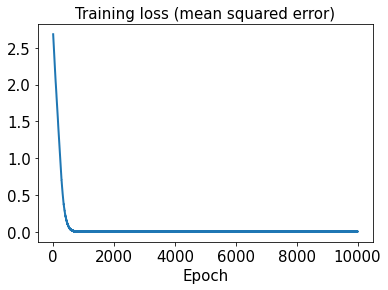

In [103]:
hist3 = history3.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

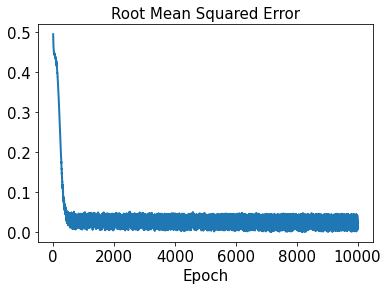

In [104]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [105]:
sd3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [106]:
start3 = datetime.datetime.now()
history3 = sd3.fit(x_train3, y_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 17ms/step - loss: 3.7412 - rmse: 1.9342
Epoch 2/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7209 - rmse: 1.9290
Epoch 3/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7005 - rmse: 1.9237
Epoch 4/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.6801 - rmse: 1.9184
Epoch 5/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6599 - rmse: 1.9131
Epoch 6/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6396 - rmse: 1.9078
Epoch 7/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.6195 - rmse: 1.9025
Epoch 8/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.5994 - rmse: 1.8972
Epoch 9/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.5794 - rmse: 1.8919
Epoch 10/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5593 - rmse: 1.8866
Epoch 11/10000
2/2 [====================

2/2 [==============================] - 0s 7ms/step - loss: 2.3664 - rmse: 1.5383
Epoch 87/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.3542 - rmse: 1.5343
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3444 - rmse: 1.5311
Epoch 89/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.3300 - rmse: 1.5264
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3183 - rmse: 1.5226
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3089 - rmse: 1.5195
Epoch 92/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2969 - rmse: 1.5155
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2851 - rmse: 1.5116
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2741 - rmse: 1.5080
Epoch 95/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2612 - rmse: 1.5037
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 1.5996 - rmse: 1.2647
Epoch 171/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.5935 - rmse: 1.2623
Epoch 172/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.5855 - rmse: 1.2591
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5787 - rmse: 1.2564
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5738 - rmse: 1.2544
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5668 - rmse: 1.2517
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5616 - rmse: 1.2496
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5548 - rmse: 1.2469
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5509 - rmse: 1.2453
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5399 - rmse: 1.2408
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 1.1327 - rmse: 1.0642
Epoch 255/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1262 - rmse: 1.0611
Epoch 256/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1207 - rmse: 1.0585
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1178 - rmse: 1.0571
Epoch 258/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1134 - rmse: 1.0550
Epoch 259/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1103 - rmse: 1.0536
Epoch 260/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1102 - rmse: 1.0535
Epoch 261/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1006 - rmse: 1.0490
Epoch 262/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0946 - rmse: 1.0461
Epoch 263/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0963 - rmse: 1.0469
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.8132 - rmse: 0.9016
Epoch 339/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8152 - rmse: 0.9027
Epoch 340/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.8069 - rmse: 0.8981
Epoch 341/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8060 - rmse: 0.8976
Epoch 342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.8022 - rmse: 0.8954
Epoch 343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7991 - rmse: 0.8937
Epoch 344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7975 - rmse: 0.8928
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7951 - rmse: 0.8915
Epoch 346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.7968 - rmse: 0.8924
Epoch 347/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.7867 - rmse: 0.8868
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.5921 - rmse: 0.7693
Epoch 423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5927 - rmse: 0.7697
Epoch 424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5913 - rmse: 0.7687
Epoch 425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5884 - rmse: 0.7669
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5830 - rmse: 0.7633
Epoch 427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5806 - rmse: 0.7618
Epoch 428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5785 - rmse: 0.7604
Epoch 429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5771 - rmse: 0.7595
Epoch 430/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5743 - rmse: 0.7576
Epoch 431/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5782 - rmse: 0.7602
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.4268 - rmse: 0.6531
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4259 - rmse: 0.6524
Epoch 508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4258 - rmse: 0.6523
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4218 - rmse: 0.6493
Epoch 510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4229 - rmse: 0.6501
Epoch 511/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4209 - rmse: 0.6486
Epoch 512/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4179 - rmse: 0.6463
Epoch 513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4154 - rmse: 0.6443
Epoch 514/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4150 - rmse: 0.6440
Epoch 515/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4153 - rmse: 0.6442
Epoch 516/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 0.3042 - rmse: 0.5514
Epoch 591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3056 - rmse: 0.5526
Epoch 592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3079 - rmse: 0.5547
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3076 - rmse: 0.5544
Epoch 594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2977 - rmse: 0.5455
Epoch 595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2986 - rmse: 0.5462
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3001 - rmse: 0.5476
Epoch 597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2935 - rmse: 0.5416
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2921 - rmse: 0.5403
Epoch 599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2904 - rmse: 0.5387
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.2078 - rmse: 0.4556
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2106 - rmse: 0.4588
Epoch 676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2056 - rmse: 0.4532
Epoch 677/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2055 - rmse: 0.4532
Epoch 678/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2065 - rmse: 0.4542
Epoch 679/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2028 - rmse: 0.4502
Epoch 680/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2035 - rmse: 0.4509
Epoch 681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2031 - rmse: 0.4505
Epoch 682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2004 - rmse: 0.4475
Epoch 683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2014 - rmse: 0.4486
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.1369 - rmse: 0.3699
Epoch 759/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1406 - rmse: 0.3748
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1364 - rmse: 0.3691
Epoch 761/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1352 - rmse: 0.3676
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1386 - rmse: 0.3721
Epoch 763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1377 - rmse: 0.3709
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1330 - rmse: 0.3646
Epoch 765/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1338 - rmse: 0.3657
Epoch 766/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1320 - rmse: 0.3632
Epoch 767/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1332 - rmse: 0.3649
Epoch 768/10000
2/2 [======================

2/2 [==============================] - 0s 8ms/step - loss: 0.0889 - rmse: 0.2980
Epoch 843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0876 - rmse: 0.2958
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0882 - rmse: 0.2969
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0878 - rmse: 0.2961
Epoch 846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0876 - rmse: 0.2959
Epoch 847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0903 - rmse: 0.3003
Epoch 848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0868 - rmse: 0.2945
Epoch 849/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0852 - rmse: 0.2917
Epoch 850/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0889 - rmse: 0.2979
Epoch 851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0826 - rmse: 0.2873
Epoch 852/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0538 - rmse: 0.2318
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0583 - rmse: 0.2413
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0590 - rmse: 0.2427
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0539 - rmse: 0.2321
Epoch 930/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0503 - rmse: 0.2241
Epoch 931/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0568 - rmse: 0.2381
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0496 - rmse: 0.2226
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0520 - rmse: 0.2278
Epoch 934/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0493 - rmse: 0.2220
Epoch 935/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0561 - rmse: 0.2367
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0287 - rmse: 0.1692
Epoch 1011/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0282 - rmse: 0.1678
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0279 - rmse: 0.1670
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0290 - rmse: 0.1701
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0335 - rmse: 0.1830
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0294 - rmse: 0.1713
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0275 - rmse: 0.1657
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0283 - rmse: 0.1682
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0312 - rmse: 0.1764
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0360 - rmse: 0.1896
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0173 - rmse: 0.1315
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0156 - rmse: 0.1247
Epoch 1095/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0149 - rmse: 0.1220
Epoch 1096/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0190 - rmse: 0.1377
Epoch 1097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0146 - rmse: 0.1208
Epoch 1098/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0143 - rmse: 0.1193
Epoch 1099/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0222 - rmse: 0.1487
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0209 - rmse: 0.1442
Epoch 1101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0169 - rmse: 0.1299
Epoch 1102/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0138 - rmse: 0.1174
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 1177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0107 - rmse: 0.1030
Epoch 1178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0164 - rmse: 0.1280
Epoch 1179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0140 - rmse: 0.1179
Epoch 1180/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.1002
Epoch 1181/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0111 - rmse: 0.1052
Epoch 1182/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 1183/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 1184/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 1185/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0105 - rmse: 0.1022
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0849
Epoch 1260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 1261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0695
Epoch 1262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 1263/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0807
Epoch 1264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 1265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 1266/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0750
Epoch 1267/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0849
Epoch 1268/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0792
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 1343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 1344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 1345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 1346/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 1347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0100 - rmse: 0.0998
Epoch 1348/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 1349/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 1350/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 1351/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0708
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 1427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0730
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 1431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0511
Epoch 1432/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 1433/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 1434/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 1435/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 7.6783e-04 - rmse: 0.0270
Epoch 1508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 1509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 1510/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.9640e-04 - rmse: 0.0257
Epoch 1511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0450
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 1514/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0879e-04 - rmse: 0.0278
Epoch 1515/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7365e-04 - rmse: 0.0271
Epoch 1516/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8339e-04 - rmse: 0.0273
Epoch 1517/10000


2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 1590/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6231e-04 - rmse: 0.0206
Epoch 1591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 1592/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2277e-04 - rmse: 0.0221
Epoch 1593/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5627e-04 - rmse: 0.0205
Epoch 1594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0634
Epoch 1595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 1596/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7859e-04 - rmse: 0.0253
Epoch 1597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 1598/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0840e-04 - rmse: 0.0217
Epoch 1599/10000


2/2 [==============================] - 0s 7ms/step - loss: 4.9699e-04 - rmse: 0.0215
Epoch 1672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 1673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 1674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0439
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 1676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 1677/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6213e-04 - rmse: 0.0288
Epoch 1678/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3411e-04 - rmse: 0.0141
Epoch 1679/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0097 - rmse: 0.0981
Epoch 1680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 1681/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 1754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 1755/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 1756/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 1757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 1758/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 1759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 1761/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4998e-04 - rmse: 0.0147
Epoch 1762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 1763/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 1836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 1837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 1838/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8619e-04 - rmse: 0.0292
Epoch 1839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 1840/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0708
Epoch 1841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 1842/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 1843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 1844/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 1845/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 1919/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 1920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 1921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 1922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 1923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 1924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 1925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 1926/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2341e-04 - rmse: 0.0221
Epoch 1927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 1928/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 2.5607e-04 - rmse: 0.0149
Epoch 2001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 2002/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2540e-04 - rmse: 0.0198
Epoch 2003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 2004/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0811e-04 - rmse: 0.0194
Epoch 2005/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 2006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 2007/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6807e-05 - rmse: 0.0073
Epoch 2008/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9620e-05 - rmse: 0.0052
Epoch 2009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 2010/10000


2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 2083/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8212e-04 - rmse: 0.0187
Epoch 2084/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0081 - rmse: 0.0897
Epoch 2085/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 2086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 2087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 2088/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 2089/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 2090/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3845e-04 - rmse: 0.0103
Epoch 2091/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 2092/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 2165/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 2166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 2167/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0746e-04 - rmse: 0.0133
Epoch 2168/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0849
Epoch 2169/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8256e-04 - rmse: 0.0187
Epoch 2170/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 2171/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6481e-04 - rmse: 0.0115
Epoch 2172/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0903
Epoch 2173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 2174/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 2248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 2249/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0556e-04 - rmse: 0.0194
Epoch 2250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 2251/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 2252/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 2253/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 2254/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2242e-04 - rmse: 0.0171
Epoch 2255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 2256/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.6372e-04 - rmse: 0.0153
Epoch 2329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 2330/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 2331/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 2332/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2035e-04 - rmse: 0.0298
Epoch 2333/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 2334/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0783
Epoch 2335/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0077e-04 - rmse: 0.0192
Epoch 2336/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 2337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 2338/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 2411/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 2412/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 2413/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 2414/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 2415/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5403e-04 - rmse: 0.0250
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0721
Epoch 2417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 2418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 2419/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 2420/10000
2/2 [======

2/2 [==============================] - 0s 8ms/step - loss: 5.0511e-04 - rmse: 0.0218
Epoch 2494/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 2495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 2496/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 2497/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5120e-04 - rmse: 0.0179
Epoch 2498/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 2499/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 2500/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 2501/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9005e-04 - rmse: 0.0162
Epoch 2502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 2503/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0529
Epoch 2576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 2577/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 2578/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 2579/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 2580/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5335e-04 - rmse: 0.0180
Epoch 2581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0907
Epoch 2582/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4552e-04 - rmse: 0.0147
Epoch 2583/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.7863e-04 - rmse: 0.0123
Epoch 2584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 2585/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 2658/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3489e-04 - rmse: 0.0175
Epoch 2659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 2660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 2661/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5416e-04 - rmse: 0.0250
Epoch 2662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 2663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 2664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 2665/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 2666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 2667/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 2741/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.3243e-04 - rmse: 0.0284
Epoch 2742/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 2743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 2744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 2745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 2746/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4311e-04 - rmse: 0.0268
Epoch 2747/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2045e-04 - rmse: 0.0282
Epoch 2748/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 2749/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 2750/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 2823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 2824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 2825/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 2826/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0063 - rmse: 0.0792
Epoch 2827/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.6823e-04 - rmse: 0.0210
Epoch 2828/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 2829/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 2830/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 2831/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.8310e-04 - rmse: 0.0236
Epoch 2832/10000
2/2 [==

2/2 [==============================] - 0s 8ms/step - loss: 8.3727e-05 - rmse: 0.0076
Epoch 2905/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1668e-04 - rmse: 0.0222
Epoch 2906/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 2907/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 2908/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 2909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 2910/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 2911/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3876e-04 - rmse: 0.0106
Epoch 2912/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 2913/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 2914/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 4.3833e-04 - rmse: 0.0203
Epoch 2987/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 2988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 2989/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1743e-05 - rmse: 0.0041
Epoch 2990/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8667e-04 - rmse: 0.0127
Epoch 2991/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3565e-04 - rmse: 0.0203
Epoch 2992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 2993/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1095e-04 - rmse: 0.0136
Epoch 2994/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 2995/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 2996/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 3069/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 3070/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6697e-04 - rmse: 0.0156
Epoch 3071/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.7694e-04 - rmse: 0.0213
Epoch 3072/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 3073/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.2539e-04 - rmse: 0.0142
Epoch 3074/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 3075/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 3076/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 3077/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5389e-05 - rmse: 0.0072
Epoch 3078/1000

2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 3151/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1323e-04 - rmse: 0.0170
Epoch 3152/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8975e-04 - rmse: 0.0163
Epoch 3153/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 3154/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 3155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 3156/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 3157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 3158/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 3159/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9764e-04 - rmse: 0.0193
Epoch 3160/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 5.4084e-04 - rmse: 0.0228
Epoch 3233/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9913e-04 - rmse: 0.0279
Epoch 3234/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 3235/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 3236/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 3237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 3238/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 3239/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2818e-04 - rmse: 0.0246
Epoch 3240/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4611e-04 - rmse: 0.0229
Epoch 3241/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 3242/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 3315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 3316/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 3317/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 3318/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 3319/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 3320/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7256e-04 - rmse: 0.0187
Epoch 3321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 3322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 3323/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 3324/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 5.0574e-04 - rmse: 0.0220
Epoch 3397/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 3398/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5421e-04 - rmse: 0.0115
Epoch 3399/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 3400/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3460e-04 - rmse: 0.0177
Epoch 3401/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8791e-04 - rmse: 0.0216
Epoch 3402/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 3403/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 3404/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 3405/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4371e-04 - rmse: 0.0180
Epoch 3406/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 3479/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 3480/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3481/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 3482/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1781e-04 - rmse: 0.0282
Epoch 3483/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 3484/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7529e-04 - rmse: 0.0188
Epoch 3485/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3486/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 3487/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 3488/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.2496e-04 - rmse: 0.0201
Epoch 3561/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 3562/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 3563/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 3564/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0688e-05 - rmse: 0.0084
Epoch 3565/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 3566/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6422e-04 - rmse: 0.0211
Epoch 3567/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6613e-04 - rmse: 0.0186
Epoch 3568/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 3569/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 3570/10000
2/2 

2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 3643/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 3644/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 3645/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 3646/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 3647/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 3648/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 3649/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0367e-04 - rmse: 0.0092
Epoch 3650/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 3651/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 3652/10000
2/2 [=======

Epoch 3725/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 3726/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 3727/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 3728/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 3729/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 3730/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 3731/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 3732/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 3733/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 3734/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 3735/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 4.1664e-04 - rmse: 0.0200
Epoch 3808/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6384e-04 - rmse: 0.0254
Epoch 3809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 3810/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0977
Epoch 3811/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 3813/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 3814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 3815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 3816/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 3817/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 3890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 3891/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 3892/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 3893/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 3894/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 3895/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 3896/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 3897/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 3898/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5439e-04 - rmse: 0.0118
Epoch 3899/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 3972/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5092e-04 - rmse: 0.0209
Epoch 3973/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 3974/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 3975/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 3976/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 3977/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 3978/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9809e-04 - rmse: 0.0280
Epoch 3979/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 3980/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1786e-04 - rmse: 0.0265
Epoch 3981/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 4054/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 4055/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 4056/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 4057/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 4058/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 4059/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 4060/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0101 - rmse: 0.1002
Epoch 4061/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0996
Epoch 4062/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 4063/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 5.1626e-04 - rmse: 0.0224
Epoch 4136/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 4137/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 4138/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 4139/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.4144e-04 - rmse: 0.0113
Epoch 4140/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.8491e-05 - rmse: 0.0067
Epoch 4141/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 4142/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 4143/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8203e-04 - rmse: 0.0311
Epoch 4144/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 4145/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 4218/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0509e-04 - rmse: 0.0096
Epoch 4219/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 4220/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8934e-04 - rmse: 0.0194
Epoch 4221/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.6758e-04 - rmse: 0.0188
Epoch 4222/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 4223/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8961e-04 - rmse: 0.0218
Epoch 4226/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 4227/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 4300/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 4301/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6691e-04 - rmse: 0.0159
Epoch 4302/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 4303/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 4304/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5740e-04 - rmse: 0.0291
Epoch 4305/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5020e-04 - rmse: 0.0289
Epoch 4306/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 4307/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 4308/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3006e-04 - rmse: 0.0147
Epoch 4309/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 4382/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9390e-04 - rmse: 0.0135
Epoch 4383/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 4384/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 4385/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8903e-04 - rmse: 0.0279
Epoch 4386/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 4387/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1713e-04 - rmse: 0.0103
Epoch 4388/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 4389/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1805e-05 - rmse: 0.0055
Epoch 4390/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0911e-05 - rmse: 0.0062
Epoch 4391/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 4464/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 4465/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4042e-04 - rmse: 0.0288
Epoch 4466/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 4467/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 4468/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 4469/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0839
Epoch 4470/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9246e-04 - rmse: 0.0168
Epoch 4471/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 4472/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 4473/10000
2/2 [=======

Epoch 4546/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 4547/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2479e-04 - rmse: 0.0146
Epoch 4548/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 4549/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5361e-04 - rmse: 0.0210
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5658e-05 - rmse: 0.0059
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0473
Epoch 4553/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 4554/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 4555/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3350e-04 - rmse: 0.0180
Ep

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 4629/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 4630/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9211e-04 - rmse: 0.0297
Epoch 4631/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 4632/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.3151e-04 - rmse: 0.0228
Epoch 4633/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 4634/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 4636/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 4637/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 4638/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0523
Epoch 4711/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 4712/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0102 - rmse: 0.1011
Epoch 4713/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 4714/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 4715/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 4716/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 4717/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 4718/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 4719/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 4720/10000
2/2 [===============

Epoch 4793/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 4794/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 4795/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8203e-04 - rmse: 0.0131
Epoch 4796/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 4797/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 4798/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 4799/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0960
Epoch 4800/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0092 - rmse: 0.0957
Epoch 4801/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 4802/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1196e-04 - rmse: 0.0224
Epoch 4803/1

2/2 [==============================] - 0s 7ms/step - loss: 5.8136e-04 - rmse: 0.0239
Epoch 4876/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 4877/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9275e-04 - rmse: 0.0196
Epoch 4878/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 4879/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 4880/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 4881/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 4882/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2632e-04 - rmse: 0.0268
Epoch 4883/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2421e-04 - rmse: 0.0248
Epoch 4884/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8840e-04 - rmse: 0.0195
Epoch 4885/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 4958/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 4959/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2672e-04 - rmse: 0.0205
Epoch 4960/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0748e-04 - rmse: 0.0099
Epoch 4961/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 4962/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.5464e-05 - rmse: 0.0082
Epoch 4963/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 4964/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4965/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 4966/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1936e-04 - rmse: 0.0145
Epoch 4967/1000

2/2 [==============================] - 0s 7ms/step - loss: 3.1564e-04 - rmse: 0.0175
Epoch 5040/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 5041/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 5042/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5043/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 5044/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2975e-04 - rmse: 0.0179
Epoch 5045/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 5046/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 5047/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0386e-04 - rmse: 0.0140
Epoch 5048/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 5049/10000
2/2 [===

2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 5122/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 5123/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6965e-04 - rmse: 0.0215
Epoch 5124/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0404
Epoch 5125/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.0436e-04 - rmse: 0.0172
Epoch 5126/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0033 - rmse: 0.0578
Epoch 5127/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 5128/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9198e-04 - rmse: 0.0242
Epoch 5129/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6122e-04 - rmse: 0.0124
Epoch 5130/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 5131/1000

2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 5204/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 5205/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0504
Epoch 5206/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 5207/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 5208/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 5209/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 5210/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8365e-04 - rmse: 0.0166
Epoch 5211/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 5212/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7019e-04 - rmse: 0.0310
Epoch 5213/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5286/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0388e-04 - rmse: 0.0282
Epoch 5287/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.1520e-05 - rmse: 0.0086
Epoch 5288/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0452
Epoch 5289/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 5290/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 5291/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 5292/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 5293/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 5294/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6386e-04 - rmse: 0.0160
Epoch 5295/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 5368/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.9807e-04 - rmse: 0.0281
Epoch 5369/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 5370/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9706e-04 - rmse: 0.0138
Epoch 5371/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 5372/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9454e-04 - rmse: 0.0137
Epoch 5373/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9692e-04 - rmse: 0.0170
Epoch 5374/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0533
Epoch 5375/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 5376/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 5377/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 5450/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 5451/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 5452/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 5453/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 5454/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.7198e-04 - rmse: 0.0191
Epoch 5455/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 5456/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 5457/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 5458/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 5459/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 5532/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 5533/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1983e-04 - rmse: 0.0177
Epoch 5534/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6753e-04 - rmse: 0.0257
Epoch 5535/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0852
Epoch 5536/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 5537/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0688
Epoch 5538/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.2876e-04 - rmse: 0.0249
Epoch 5539/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 5540/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0845
Epoch 5541/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 5615/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 5616/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 5617/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 5618/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 5619/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0722
Epoch 5620/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0839
Epoch 5621/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 5622/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 5623/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 5624/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0484
Epoch 5697/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 5698/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 5699/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 5700/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 5701/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 5702/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2759e-04 - rmse: 0.0149
Epoch 5703/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 5704/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.8670e-05 - rmse: 0.0072
Epoch 5705/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.5189e-04 - rmse: 0.0211
Epoch 5706/10000
2/2 [===

2/2 [==============================] - 0s 17ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 5779/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 5780/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.9565e-05 - rmse: 0.0073
Epoch 5781/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 5782/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 5783/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 5784/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9708e-04 - rmse: 0.0138
Epoch 5785/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 5786/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8734e-04 - rmse: 0.0135
Epoch 5787/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 5788/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 5861/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.5328e-04 - rmse: 0.0273
Epoch 5862/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 5863/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 5864/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 5865/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4683e-05 - rmse: 0.0089
Epoch 5866/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1547e-05 - rmse: 0.0023
Epoch 5867/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7441e-04 - rmse: 0.0130
Epoch 5868/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 5869/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7536e-04 - rmse: 0.0164
Epoch 5870/10000


2/2 [==============================] - 0s 8ms/step - loss: 6.5512e-04 - rmse: 0.0255
Epoch 5943/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 5944/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 5945/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 5946/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 5947/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 5948/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5949/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 5950/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6921e-04 - rmse: 0.0162
Epoch 5951/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3301e-04 - rmse: 0.0113
Epoch 5952/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 6025/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 6026/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5298e-04 - rmse: 0.0157
Epoch 6027/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8397e-04 - rmse: 0.0194
Epoch 6028/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0974
Epoch 6029/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 6030/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 6031/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 6032/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.0288e-04 - rmse: 0.0140
Epoch 6033/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 6034/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 5.5176e-04 - rmse: 0.0234
Epoch 6107/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9531e-04 - rmse: 0.0138
Epoch 6108/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6660e-04 - rmse: 0.0127
Epoch 6109/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 6110/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 6111/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3226e-04 - rmse: 0.0113
Epoch 6112/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 6113/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 6114/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6115/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 6116/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 9.7471e-04 - rmse: 0.0311
Epoch 6189/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 6190/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 6191/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 6192/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0915
Epoch 6193/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1014e-04 - rmse: 0.0301
Epoch 6194/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1699e-04 - rmse: 0.0302
Epoch 6195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 6196/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 6197/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 6198/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 6271/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 6272/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0897
Epoch 6273/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9629e-04 - rmse: 0.0138
Epoch 6274/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6153e-04 - rmse: 0.0214
Epoch 6275/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.7902e-04 - rmse: 0.0132
Epoch 6276/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.1274e-04 - rmse: 0.0103
Epoch 6277/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 6278/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 6279/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 6280/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 6353/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 6354/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 6355/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 6356/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0084 - rmse: 0.0915
Epoch 6357/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 6358/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5677e-04 - rmse: 0.0235
Epoch 6359/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 6360/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5799e-04 - rmse: 0.0255
Epoch 6361/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 6362/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0353
Epoch 6435/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 6436/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 6437/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 6438/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6439/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0922
Epoch 6440/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 6441/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 6442/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 6443/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 6444/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 5.8116e-04 - rmse: 0.0240
Epoch 6518/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 6519/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0506e-04 - rmse: 0.0245
Epoch 6520/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 6521/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 6522/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 6523/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3722e-04 - rmse: 0.0251
Epoch 6524/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 6525/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2744e-04 - rmse: 0.0179
Epoch 6526/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 6527/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 6600/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0688
Epoch 6601/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0474
Epoch 6602/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 6603/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 6604/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 6605/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9552e-04 - rmse: 0.0243
Epoch 6606/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 6607/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 6608/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1598e-04 - rmse: 0.0247
Epoch 6609/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 6682/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 6684/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 6685/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2809e-04 - rmse: 0.0206
Epoch 6686/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0977
Epoch 6687/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6688/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 6689/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 6690/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0695
Epoch 6691/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6764/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2315e-04 - rmse: 0.0109
Epoch 6765/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5821e-04 - rmse: 0.0159
Epoch 6766/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.1920e-04 - rmse: 0.0227
Epoch 6767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 6768/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9011e-04 - rmse: 0.0297
Epoch 6769/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 6770/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 6771/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2555e-04 - rmse: 0.0179
Epoch 6772/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6284e-04 - rmse: 0.0236
Epoch 6773/10

2/2 [==============================] - 0s 8ms/step - loss: 8.2803e-04 - rmse: 0.0287
Epoch 6846/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5213e-04 - rmse: 0.0157
Epoch 6847/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8060e-04 - rmse: 0.0166
Epoch 6848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0628
Epoch 6849/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7104e-04 - rmse: 0.0163
Epoch 6850/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 6851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 6852/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 6853/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 6854/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 6855/10000
2/2 

2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 6928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 6929/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.4590e-04 - rmse: 0.0155
Epoch 6930/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 6931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 6932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 6933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0914
Epoch 6934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 6935/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.8632e-04 - rmse: 0.0241
Epoch 6936/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 6937/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 7010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 7011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 7012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0352
Epoch 7013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 7014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 7015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0510
Epoch 7016/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8508e-04 - rmse: 0.0167
Epoch 7017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 7018/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1767e-04 - rmse: 0.0302
Epoch 7019/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 7092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0902
Epoch 7093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 7094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 7095/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0484
Epoch 7096/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8483e-04 - rmse: 0.0134
Epoch 7097/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 7098/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1576e-04 - rmse: 0.0105
Epoch 7099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 7100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 7101/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 5.9405e-04 - rmse: 0.0243
Epoch 7174/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0097 - rmse: 0.0986
Epoch 7175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 7176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7177/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.2182e-04 - rmse: 0.0268
Epoch 7178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 7179/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.8570e-04 - rmse: 0.0261
Epoch 7180/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0072 - rmse: 0.0848
Epoch 7181/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.2632e-04 - rmse: 0.0269
Epoch 7182/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 7183/10000


2/2 [==============================] - 0s 7ms/step - loss: 1.3162e-04 - rmse: 0.0112
Epoch 7256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 7257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 7259/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7260/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0032e-04 - rmse: 0.0098
Epoch 7261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 7262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 7263/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7570e-04 - rmse: 0.0278
Epoch 7264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 7265/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 7338/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2217e-04 - rmse: 0.0108
Epoch 7339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 7340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 7341/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7653e-04 - rmse: 0.0193
Epoch 7342/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 7343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 7344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 7345/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1841e-04 - rmse: 0.0146
Epoch 7346/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1924e-04 - rmse: 0.0177
Epoch 7347/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 7420/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 7421/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 7422/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 7423/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1501e-04 - rmse: 0.0176
Epoch 7424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0096 - rmse: 0.0980
Epoch 7425/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6489e-04 - rmse: 0.0161
Epoch 7426/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8268e-04 - rmse: 0.0167
Epoch 7427/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 7428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 7429/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 7502/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 7503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 7504/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0098 - rmse: 0.0989
Epoch 7505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 7506/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 7507/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.7225e-04 - rmse: 0.0258
Epoch 7508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 7509/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6432e-04 - rmse: 0.0310
Epoch 7510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 7511/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 7585/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0734e-04 - rmse: 0.0142
Epoch 7586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 7587/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 7588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 7589/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.5561e-04 - rmse: 0.0274
Epoch 7590/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5234e-05 - rmse: 0.0055
Epoch 7591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 7592/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8716e-04 - rmse: 0.0135
Epoch 7593/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7666/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4906e-04 - rmse: 0.0291
Epoch 7667/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1576e-04 - rmse: 0.0203
Epoch 7668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 7669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 7670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 7672/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1762e-04 - rmse: 0.0106
Epoch 7673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 7674/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2050e-04 - rmse: 0.0107
Epoch 7675/10000
2/2 

Epoch 7748/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0718
Epoch 7749/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 7750/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 7751/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 7752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 7753/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 7754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 7755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 7756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 7757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 7758/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 7831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 7832/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8309e-04 - rmse: 0.0167
Epoch 7833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 7834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 7835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 7836/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 7837/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 7838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 7839/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 7840/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 7914/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4755e-04 - rmse: 0.0290
Epoch 7915/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 7916/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0595
Epoch 7917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 7918/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 7919/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0598e-04 - rmse: 0.0174
Epoch 7920/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5919e-05 - rmse: 0.0090
Epoch 7921/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 7922/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 7923/10000
2/2 [==

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 7996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0960
Epoch 7997/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1316e-04 - rmse: 0.0284
Epoch 7998/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.2235e-04 - rmse: 0.0108
Epoch 7999/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3458e-04 - rmse: 0.0207
Epoch 8000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 8001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 8002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 8003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 8004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 8005/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 8078/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0620
Epoch 8079/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 8080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 8081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 8082/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7662e-04 - rmse: 0.0239
Epoch 8083/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9550e-04 - rmse: 0.0198
Epoch 8084/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 8085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 8086/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8087/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 8160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 8161/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0595
Epoch 8162/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8163/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8164/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9865e-04 - rmse: 0.0139
Epoch 8165/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0323
Epoch 8166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 8167/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 8168/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2488e-04 - rmse: 0.0205
Epoch 8169/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 8242/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5112e-04 - rmse: 0.0211
Epoch 8243/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 8244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 8245/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8246/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 8247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 8248/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 8249/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 8250/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0380
Epoch 8251/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 1.2430e-04 - rmse: 0.0109
Epoch 8324/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 8325/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 8326/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 8327/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1114e-04 - rmse: 0.0144
Epoch 8328/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 8329/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 8330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0560
Epoch 8331/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 8332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 8333/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 9.3932e-05 - rmse: 0.0094
Epoch 8406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 8407/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 8408/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 8409/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8487e-04 - rmse: 0.0167
Epoch 8410/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.4639e-04 - rmse: 0.0185
Epoch 8411/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7657e-04 - rmse: 0.0193
Epoch 8412/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8413/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 8414/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 8415/100

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 8488/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3476e-04 - rmse: 0.0288
Epoch 8489/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.9929e-04 - rmse: 0.0199
Epoch 8490/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.4759e-04 - rmse: 0.0119
Epoch 8491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 8492/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 8493/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 8494/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6839e-04 - rmse: 0.0258
Epoch 8495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 8496/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 8497/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8570/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 8571/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 8572/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8953e-04 - rmse: 0.0220
Epoch 8573/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 8574/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8575/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 8576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0775
Epoch 8577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 8578/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 8579/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 8652/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.7190e-04 - rmse: 0.0192
Epoch 8653/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 8654/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3198e-04 - rmse: 0.0113
Epoch 8655/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 8656/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 8657/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 8658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 8659/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8465e-05 - rmse: 0.0091
Epoch 8660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 8661/10000
2

2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 8734/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 8735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8736/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 8737/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 8739/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8740/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.3241e-04 - rmse: 0.0207
Epoch 8741/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8004e-04 - rmse: 0.0166
Epoch 8742/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 8743/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 5.7585e-04 - rmse: 0.0239
Epoch 8816/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 8817/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 8818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 8819/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7585e-04 - rmse: 0.0193
Epoch 8820/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 8821/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 8822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 8823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 8824/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.5487e-04 - rmse: 0.0255
Epoch 8825/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 8898/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8424e-04 - rmse: 0.0167
Epoch 8899/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0138e-05 - rmse: 0.0092
Epoch 8900/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 8901/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3020e-04 - rmse: 0.0150
Epoch 8902/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 8903/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 8905/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 8906/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 8907/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 8.1806e-05 - rmse: 0.0088
Epoch 8980/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1044e-05 - rmse: 0.0025
Epoch 8981/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 8982/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2126e-04 - rmse: 0.0178
Epoch 8983/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 8984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 8985/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 8986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 8987/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 8988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8989/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 9062/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 9063/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 9064/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 9065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 9066/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 9067/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1522e-04 - rmse: 0.0176
Epoch 9068/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 9069/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 9070/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8517e-04 - rmse: 0.0134
Epoch 9071/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 1.8759e-04 - rmse: 0.0135
Epoch 9144/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 9145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 9146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 9147/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 9148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 9149/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 9150/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.6509e-04 - rmse: 0.0190
Epoch 9151/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4042e-04 - rmse: 0.0209
Epoch 9152/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2292e-04 - rmse: 0.0228
Epoch 9153/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 9226/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3302e-04 - rmse: 0.0288
Epoch 9227/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 9228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 9229/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 9230/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 9231/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 9232/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 9233/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0184e-04 - rmse: 0.0172
Epoch 9234/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 9235/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 3.1564e-04 - rmse: 0.0176
Epoch 9308/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9309/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 9310/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0514
Epoch 9311/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9706e-04 - rmse: 0.0171
Epoch 9312/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 9313/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 9314/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 9315/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 9316/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5994e-04 - rmse: 0.0160
Epoch 9317/10000
2/2 [

2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 9390/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1876e-04 - rmse: 0.0203
Epoch 9391/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 9392/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.0107e-05 - rmse: 0.0087
Epoch 9393/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8151e-04 - rmse: 0.0279
Epoch 9394/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9848e-04 - rmse: 0.0139
Epoch 9395/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9934e-04 - rmse: 0.0315
Epoch 9396/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 9397/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 9398/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 9399/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 9472/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0924
Epoch 9473/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0796
Epoch 9474/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0793
Epoch 9475/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0378
Epoch 9476/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 9477/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 9478/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2156e-04 - rmse: 0.0286
Epoch 9479/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 9480/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 9481/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 9554/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 9555/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5991e-04 - rmse: 0.0125
Epoch 9556/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2845e-04 - rmse: 0.0180
Epoch 9557/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3735e-04 - rmse: 0.0182
Epoch 9558/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9041e-04 - rmse: 0.0136
Epoch 9559/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0367
Epoch 9560/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2821e-04 - rmse: 0.0180
Epoch 9561/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 9562/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0602e-04 - rmse: 0.0224
Epoch 9563/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0970
Epoch 9636/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 9637/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 9638/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 9639/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 9640/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 9641/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 9642/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 9643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9644/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6131e-04 - rmse: 0.0293
Epoch 9645/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 9718/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 9719/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0906
Epoch 9720/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 9721/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 9722/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 9723/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7367e-04 - rmse: 0.0192
Epoch 9724/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0688
Epoch 9725/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 9726/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 9727/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 5.6977e-04 - rmse: 0.0238
Epoch 9800/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 9801/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0039 - rmse: 0.0628
Epoch 9802/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 9803/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 9804/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 9805/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1504e-04 - rmse: 0.0145
Epoch 9806/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 9807/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 9808/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 9809/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 1.7532e-04 - rmse: 0.0131
Epoch 9882/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 9883/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 9884/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 9885/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 9886/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 9887/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 9888/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7853e-04 - rmse: 0.0218
Epoch 9889/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8034e-04 - rmse: 0.0194
Epoch 9890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 9891/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9964/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 9965/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 9966/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 9967/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 9968/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 9969/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2804e-04 - rmse: 0.0111
Epoch 9970/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 9971/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9580e-04 - rmse: 0.0315
Epoch 9972/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 9973/10000
2/2 [=======

In [107]:
time3 = end3 - start3
print("Training time (Case 3):", time3)

Training time (Case 3): 0:02:53.998022


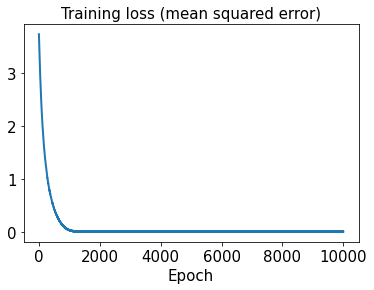

In [108]:
hist3 = history3.history
plt.plot(hist3['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

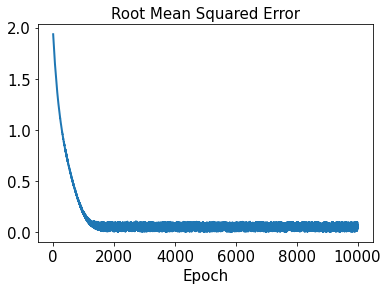

In [109]:
plt.plot(hist3['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [110]:
test_results3 = sd3.evaluate(x_test3)

1/1 [==============================] - 0s 81ms/step - loss: 4.5473e-06 - rmse: 0.0000e+00


In [111]:
decoded_sensor_train3 = sensor_pred3.predict(t_train)

In [112]:
decoded_sensor_test3 = sensor_pred3.predict(t_test)

In [113]:
decoded_train3 = sd3.predict(decoded_sensor_train3)

In [114]:
decoded_test3 = sd3.predict(decoded_sensor_test3)

In [115]:
error_train_abs3 = np.abs(decoded_train3 - y_train3)

In [116]:
error_test_abs3 = np.abs(decoded_test3 - y_test3)

In [140]:
l2_error_sensor_train3 = np.sqrt(np.sum((decoded_sensor_train3 - x_train3)**2) / np.sum(x_train3**2))
print(l2_error_sensor_train3)

0.04458279708222405


In [141]:
l2_error_sensor_test3 = np.sqrt(np.sum((decoded_sensor_test3 - x_test3)**2) / np.sum(x_test3**2))
print(l2_error_sensor_test3)

0.06094187337964455


In [117]:
l2_error_train3 = np.sqrt(np.sum((decoded_train3 - y_train3)**2) / np.sum(y_train3**2))
print(l2_error_train3)

0.04905621640088419


In [118]:
l2_error_test3 = np.sqrt(np.sum((decoded_test3 - y_test3)**2) / np.sum(y_test3**2))
print(l2_error_test3)

0.05422925618967535


In [119]:
l2_error_train_list3 = []
for i in range(0, len(x_train3)):
    l2_error_train_data3 = np.sqrt(np.sum((decoded_train3[i] - y_train3[i])**2) / np.sum(y_train3[i]**2))
    l2_error_train_list3.append(l2_error_train_data3)
print(l2_error_train_list3)

[0.025416626800575864, 0.030413309937861694, 0.008034068816792944, 0.05107848951661, 0.05309258498829613, 0.0428944871025978, 0.0542150500079406, 0.06803586848876397, 0.05399696800440764, 0.11674176513080488, 0.09911659830376786, 0.005167889487099728, 0.002652810636118976, 0.02541727147548675, 0.04887262548852999, 0.0023310476182138527, 0.03890453573511707, 0.04190150047667707, 0.008302765916087097, 0.053710306700204866, 0.1564665161889075, 0.01432456488310881, 0.13583734797647215, 0.03122941460898757, 0.08290080386057301, 0.046135376716993345, 0.037021512947427546, 0.051467241775005286, 0.045909520300428545, 0.03500794727791207, 0.053780040708115866, 0.013213977104061001, 0.1732468499446324]


In [120]:
l2_error_test_list3 = []
for i in range(0, len(x_test3)):
    l2_error_test_data3 = np.sqrt(np.sum((decoded_test3[i] - y_test3[i])**2) / np.sum(y_test3[i]**2))
    l2_error_test_list3.append(l2_error_test_data3)
print(l2_error_test_list3)

[0.02448438075426569, 0.05272419443875526, 0.039176903178519754, 0.016750529200210175, 0.020045030933520506, 0.13043988466221235, 0.04908533739902589, 0.1521104163236043]


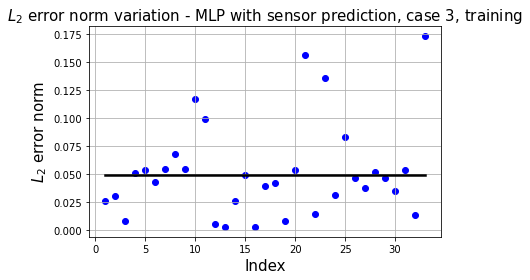

In [121]:
plt.plot(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train3*np.ones(x_train3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

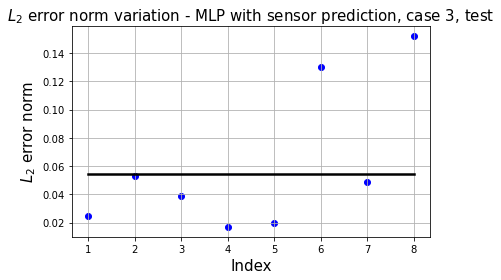

In [122]:
plt.plot(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test3*np.ones(x_test3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

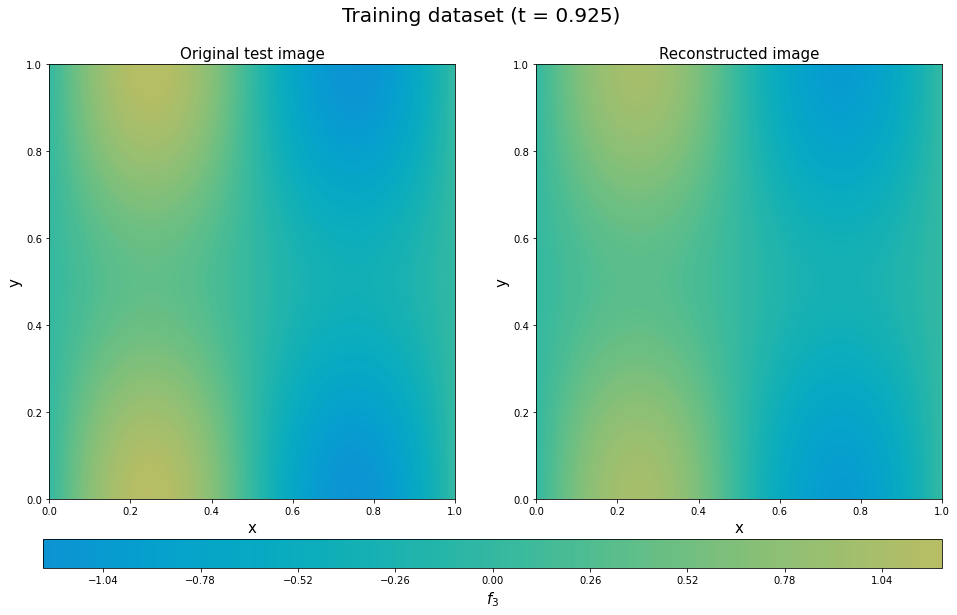

In [123]:
plt.figure(figsize=(16, 8))
y_train3_20_rotate = y_train3[20].T.reshape(101,101)
decoded_rotate3 = decoded_train3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_20_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[37]),fontsize=20)
plt.show()

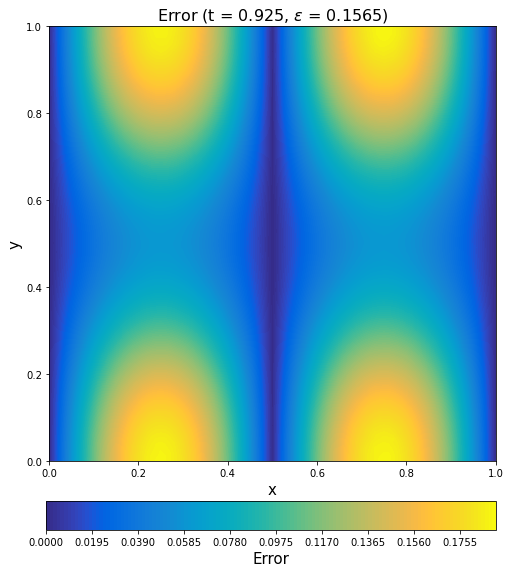

In [124]:
error_train_abs3_rotate20 = error_train_abs3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate20, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.925, $\epsilon$ = %.4f)' %(l2_error_train_list3[20]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

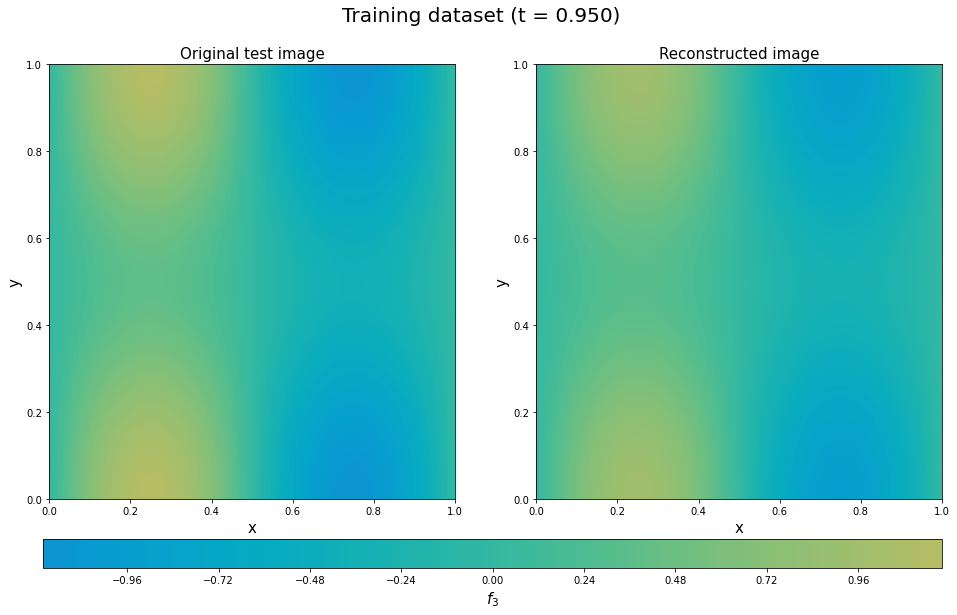

In [125]:
plt.figure(figsize=(16, 8))
y_train3_32_rotate = y_train3[32].T.reshape(101,101)
decoded_rotate3 = decoded_train3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_32_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[38]), fontsize=20)
plt.show()

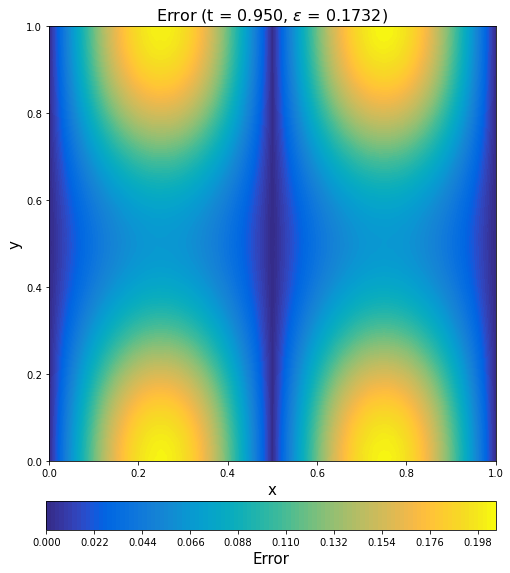

In [126]:
error_train_abs3_rotate32 = error_train_abs3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate32, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.950, $\epsilon$ = %.4f)' %(l2_error_train_list3[32]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

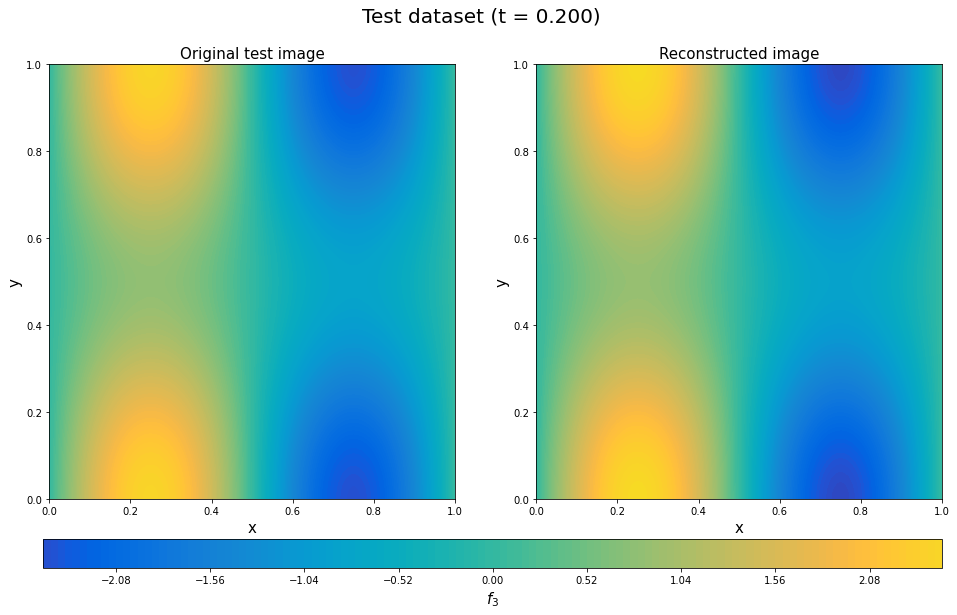

In [127]:
plt.figure(figsize=(16, 8))
y_test3_2_rotate = y_test3[2].T.reshape(101,101)
decoded_rotate3 = decoded_test3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

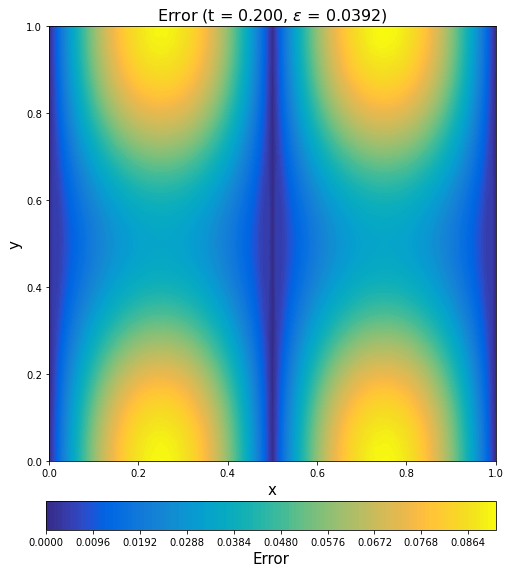

In [128]:
error_test_abs3_rotate2 = error_test_abs3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list3[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

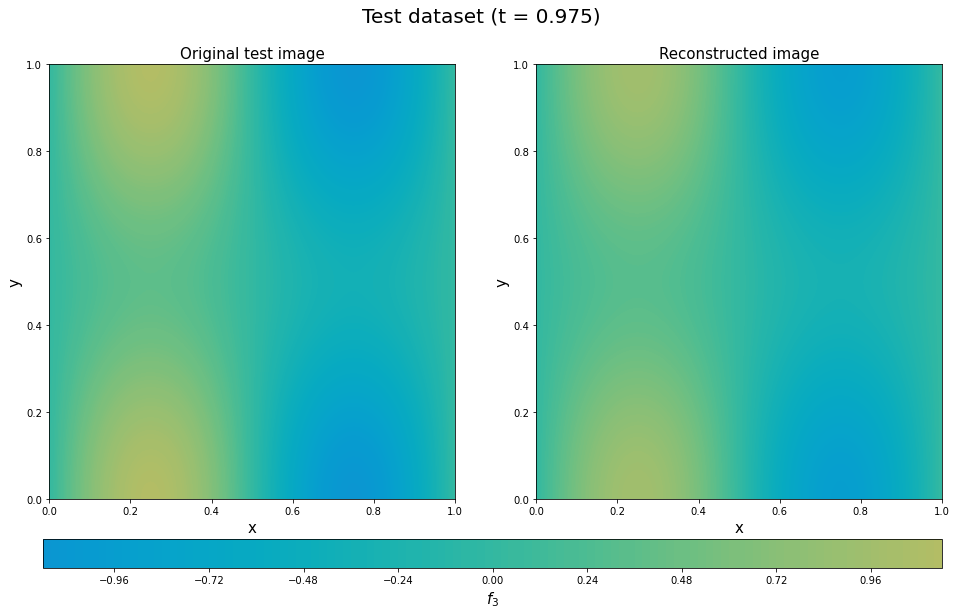

In [129]:
plt.figure(figsize=(16, 8))
y_test3_7_rotate = y_test3[7].T.reshape(101,101)
decoded_rotate3 = decoded_test3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_7_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[39]),fontsize=20)
plt.show()

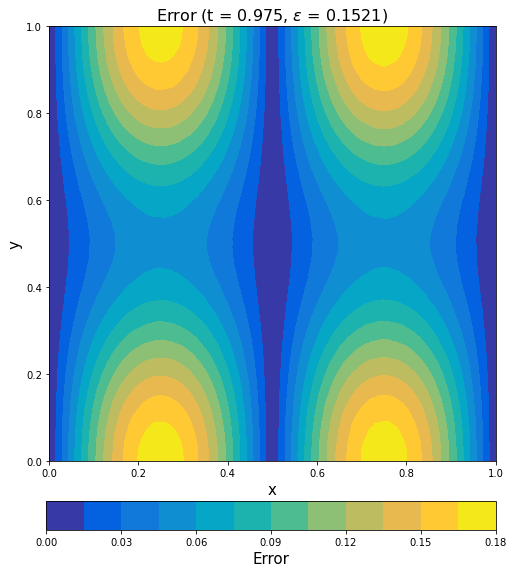

In [130]:
error_test_abs3_rotate7 = error_test_abs3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate7, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.975, $\epsilon$ = %.4f)' %(l2_error_test_list3[7]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()